# **Spain: Energy Profile**
Business, economic and financial data project by Chiara Bigarella, Luca Pessina and Silvia Poletti. 

The code is written in R.

**Notebook outline:**
- Data pre-processing and exploratory data analysis
- Statistical methods for modeling the energy generation power of different sources
- Understand the possible competition/collaboration dynamic between sources of energy
- Energy price forecasting

## Load/Install useful libraries

In [3]:
install.packages('DIMORA', version='0.1.0')
install.packages('acepack')
install.packages("gam")
install.packages("pracma")
install.packages("sm")

packageurl <- "https://cran.r-project.org/src/contrib/Archive/pbkrtest/pbkrtest_0.4-4.tar.gz" 
install.packages(packageurl, repos=NULL, type="source")

install.packages('car')
install.packages('ggpubr')
install.packages('gbm')

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)

also installing the dependency ‘rstatix’


Installing package into ‘/usr/local/lib/R/site-library’
(as ‘lib’ is unspecified)



In [5]:
library(lubridate)
library(tidyr)
library(DIMORA)
library(sm)
library(pracma)
library(data.table)
library(scales)
library(fpp2)
library(forecast)
library(lmtest) 
library(lubridate)
library(dplyr)
library(repr)
library(fmsb)
library(Rcpp)
library(readxl)
library(gam)
library(data.table)
library(sm)
library(ggpubr)
library(car)
library(gbm)

In [6]:
set.seed(42)

# ➡️ Data loading and pre-processing

In [7]:
df <- read.csv('../input/energy-consumption-generation-prices-and-weather/energy_dataset.csv')

In [8]:
df[['dates']] <- as.POSIXct(df[['time']], format = "%Y-%m-%d %H:%M:%S")

df$hours <- seq(1,dim(df)[1],1)            # add new column for hours
df$weeks <- floor_date(df$dates, "week")   # add new column for weeks

# Delete non-informative columns:
df <- subset(df, select=-c(generation.wind.offshore, generation.marine,generation.fossil.coal.derived.gas,
                           generation.fossil.peat, generation.hydro.pumped.storage.aggregated, 
                           generation.geothermal, generation.fossil.oil.shale,
                           forecast.wind.offshore.eday.ahead, forecast.solar.day.ahead, 
                           forecast.wind.onshore.day.ahead, total.load.forecast, time, price.day.ahead))

# Delete rows with NAN values:
df <- df %>% drop_na()

In [8]:
dim(df)      # Print the dimension of the dataset

[1] 35018    19

## ⌛ Time aggregation
Use the mean value to aggregate the data, first by year, then by days, weeks and months.

In [9]:
# Split dataset by years
years = split(df, format(as.Date(df$dates), "%Y"))
year_2015 = as.data.frame(years[1])
year_2016 = as.data.frame(years[2])
year_2017 = as.data.frame(years[3])
year_2018 = as.data.frame(years[4])

# Change colnames:
colnames(year_2015) <- colnames(df)
colnames(year_2016) <- colnames(df)
colnames(year_2017) <- colnames(df)
colnames(year_2018) <- colnames(df)

In [10]:
# 2015
# Aggregation by days:
year_2015_agg_d = aggregate(subset(year_2015, select=-c(dates, hours, weeks)),
                          by=list(day=as.POSIXct(trunc(year_2015$dates, "days"))), FUN=mean)  
# Aggregation by weeks:
year_2015_agg_w = aggregate(subset(year_2015, select=-c(dates, hours, weeks)),
                          by=list(week=year_2015$week), FUN=mean)  
# Aggregation by months:
year_2015_agg_m = aggregate(subset(year_2015, select=-c(dates, hours, weeks)),
                          by=list(day=as.POSIXct(trunc(year_2015$dates, "months"))), FUN=mean)   

# 2016
year_2016_agg_d = aggregate(subset(year_2016, select=-c(dates, hours, weeks)),
                          by=list(day=as.POSIXct(trunc(year_2016$dates, "days"))), FUN=mean)

year_2016_agg_d = year_2016_agg_d[!year_2016_agg_d$day == "2016-02-29 UTC",]
rownames(year_2016_agg_d) <- 1:nrow(year_2016_agg_d)

year_2016_agg_w = aggregate(subset(year_2016, select=-c(dates, hours, weeks)),
                          by=list(week=year_2016$week), FUN=mean)
year_2016_agg_m = aggregate(subset(year_2016, select=-c(dates, hours, weeks)),
                          by=list(day=as.POSIXct(trunc(year_2016$dates, "months"))), FUN=mean)

# 2017
year_2017_agg_d = aggregate(subset(year_2017, select=-c(dates, hours, weeks)),
                          by=list(day=as.POSIXct(trunc(year_2017$dates, "days"))), FUN=mean)
year_2017_agg_w = aggregate(subset(year_2017, select=-c(dates, hours, weeks)),
                          by=list(week=year_2017$week), FUN=mean)
year_2017_agg_m = aggregate(subset(year_2017, select=-c(dates, hours, weeks)),
                          by=list(day=as.POSIXct(trunc(year_2017$dates, "months"))), FUN=mean)

# 2018
year_2018_agg_d = aggregate(subset(year_2018, select=-c(dates, hours, weeks)),
                          by=list(day=as.POSIXct(trunc(year_2018$dates, "days"))), FUN=mean)
year_2018_agg_w = aggregate(subset(year_2018, select=-c(dates, hours, weeks)),
                          by=list(week=year_2018$week), FUN=mean)
year_2018_agg_m = aggregate(subset(year_2018, select=-c(dates, hours, weeks)),
                          by=list(day=as.POSIXct(trunc(year_2018$dates, "months"))), FUN=mean)

## ⚡ Feature Aggregation

In [11]:
FeatAggr <- function(dataset, date) {
    
    if (date=='day'){
    data_feat_aggr <- subset(dataset, select=-c(day, total.load.actual, price.actual, 
                                                generation.other, generation.other.renewable))
    }
    
    if (date=='week'){
    data_feat_aggr <- subset(dataset, select=-c(week, total.load.actual, price.actual, 
                                                generation.other, generation.other.renewable))
    }
    
    # All Fossil
    data_feat_aggr$generation.all.fossil <- dataset$generation.fossil.brown.coal.lignite + 
                                            dataset$generation.fossil.hard.coal +
                                            dataset$generation.fossil.oil +
                                            dataset$generation.fossil.gas
    data_feat_aggr$generation.fossil.brown.coal.lignite <- NULL
    data_feat_aggr$generation.fossil.hard.coal <- NULL
    data_feat_aggr$generation.fossil.oil <- NULL
    data_feat_aggr$generation.fossil.gas <- NULL
    
    # Hydro
    data_feat_aggr$generation.hydro <- dataset$generation.hydro.pumped.storage.consumption + 
                                       dataset$generation.hydro.run.of.river.and.poundage +
                                       dataset$generation.hydro.water.reservoir
    data_feat_aggr$generation.hydro.pumped.storage.consumption <- NULL
    data_feat_aggr$generation.hydro.run.of.river.and.poundage <- NULL
    data_feat_aggr$generation.hydro.water.reservoir <- NULL
    
    # Biomass and Waste
    data_feat_aggr$generation.biomass.waste <- dataset$generation.biomass + 
                                               dataset$generation.waste
    data_feat_aggr$generation.biomass <- NULL
    data_feat_aggr$generation.waste <- NULL
    
    # All Renewables
    data_feat_aggr$generation.all.renewables <- dataset$generation.other.renewable + 
                                                data_feat_aggr$generation.solar +
                                                data_feat_aggr$generation.wind.onshore +
                                                data_feat_aggr$generation.hydro
    
    data_feat_aggr <- data_feat_aggr[,c(4,6,1,2,3,5,7)]
    colnames(data_feat_aggr)[5] <- "generation.wind"
    return(data_feat_aggr)
}

In [12]:
data_2015_w <- FeatAggr(year_2015_agg_w,'week')
data_2016_w <- FeatAggr(year_2016_agg_w,'week')
data_2017_w <- FeatAggr(year_2017_agg_w,'week')
data_2018_w <- FeatAggr(year_2018_agg_w,'week')

data_2015_d <- FeatAggr(year_2015_agg_d,'day')
data_2016_d <- FeatAggr(year_2016_agg_d,'day')
data_2017_d <- FeatAggr(year_2017_agg_d,'day')
data_2018_d <- FeatAggr(year_2018_agg_d,'day')

colnames(data_2015_w)

[1] "generation.all.fossil"     "generation.biomass.waste" 
[3] "generation.nuclear"        "generation.solar"         
[5] "generation.wind"           "generation.hydro"         
[7] "generation.all.renewables"

# ➡️ Exploratory Data Analysis

## 💸 Energy price visualizations

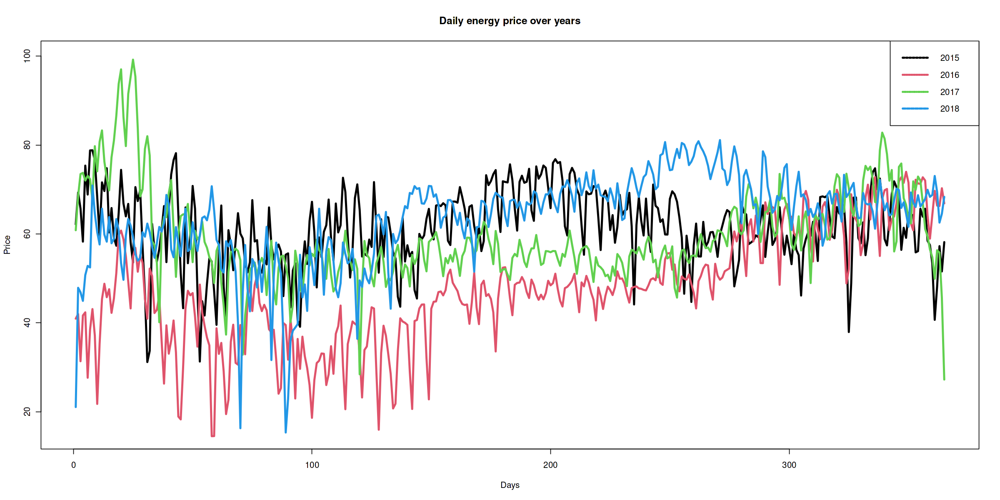

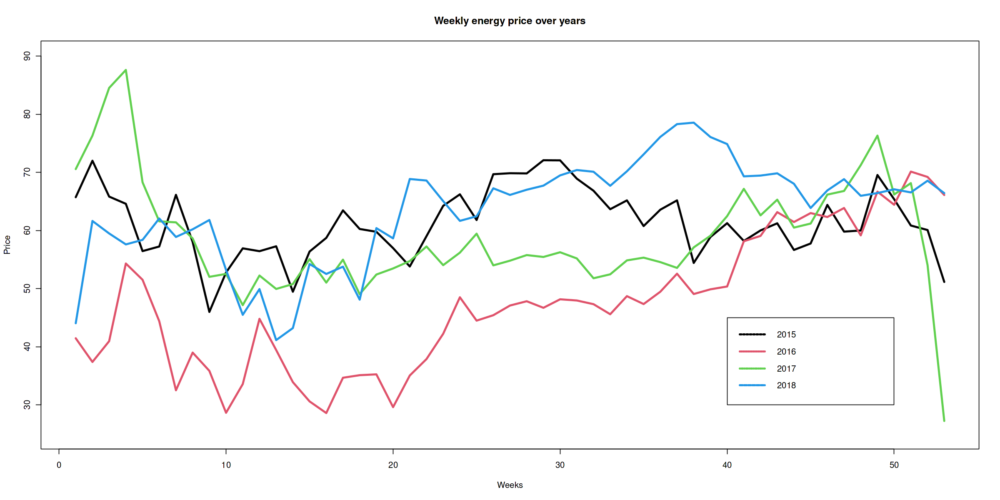

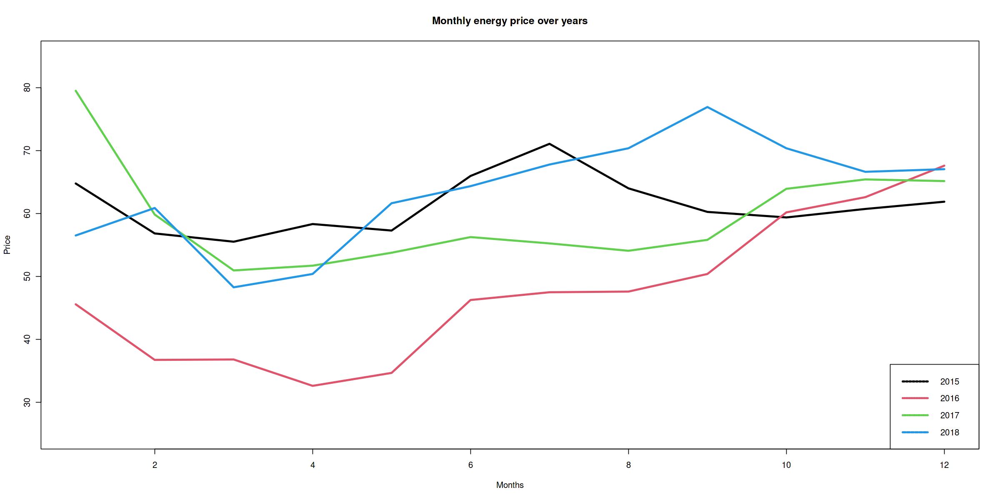

In [13]:
options(repr.plot.width=20, repr.plot.height=10)

plot(year_2015_agg_d$price.actual, type='l', col=1, 
     xlab="Days", ylab="Price", main="Daily energy price over years", ylim=c(15,100), lwd=3)
lines(year_2016_agg_d$price.actual, col=2, lwd=3)
lines(year_2017_agg_d$price.actual, col=3, lwd=3)
lines(year_2018_agg_d$price.actual, col=4, lwd=3)
legend(x = "topright", legend=c('2015','2016','2017','2018'), col=c(1,2,3,4), lty=2:10, lwd=3)

plot(year_2015_agg_w$price.actual, type='l', col=1,xlab="Weeks", ylab="Price",
     main="Weekly energy price over years",ylim=c(25,90), lwd=3)
lines(year_2016_agg_w$price.actual, col=2, lwd=3)
lines(year_2017_agg_w$price.actual, col=3, lwd=3)
lines(year_2018_agg_w$price.actual, col=4, lwd=3)
legend(c(40,50),c(30,45),legend=c('2015','2016','2017','2018'), col=c(1,2,3,4), lty=2:10, lwd=3)

plot(year_2015_agg_m$price.actual, type='l', col=1, xlab="Months", ylab="Price",
     main="Monthly energy price over years", ylim=c(25,85), lwd=3)
lines(year_2016_agg_m$price.actual, col=2, lwd=3)
lines(year_2017_agg_m$price.actual, col=3, lwd=3)
lines(year_2018_agg_m$price.actual, col=4, lwd=3)
legend(x="bottomright", legend=c('2015','2016','2017','2018'), col=c(1,2,3,4), lty=2:10, lwd=3)

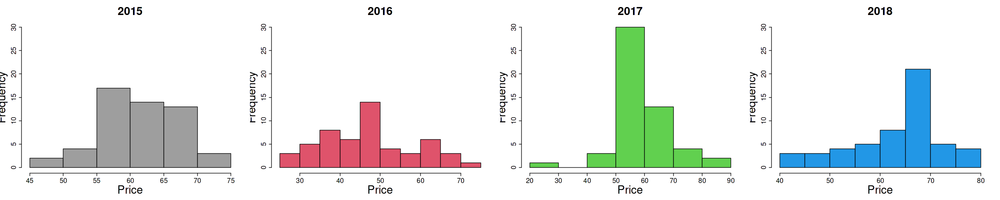

In [14]:
options(repr.plot.width=25, repr.plot.height=5)
par(mfrow=c(1,4))

h <- hist(year_2015_agg_w$price.actual, plot = FALSE)
plot(h, xlab = "Price", ylab = "Frequency", ylim=c(0,30),
     main = "2015", col = 8, cex.lab=2.5, cex.axis=1.5, cex.main=2.5)
h <- hist(year_2016_agg_w$price.actual, plot = FALSE)
plot(h, xlab = "Price", ylab = "Frequency",ylim=c(0,30),
     main = "2016", col = 2, cex.lab=2.5, cex.axis=1.5, cex.main=2.5)
h <- hist(year_2017_agg_w$price.actual, plot = FALSE)
plot(h, xlab = "Price", ylab = "Frequency",ylim=c(0,30),
     main = "2017", col = 3, cex.lab=2.5, cex.axis=1.5, cex.main=2.5)
h <- hist(year_2018_agg_w$price.actual, plot = FALSE)
plot(h, xlab = "Price", ylab = "Frequency",ylim=c(0,30),
     main = "2018", col = 4, cex.lab=2.5, cex.axis=1.5, cex.main=2.5)

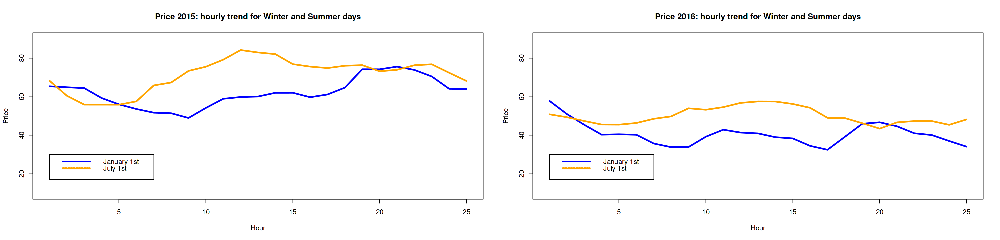

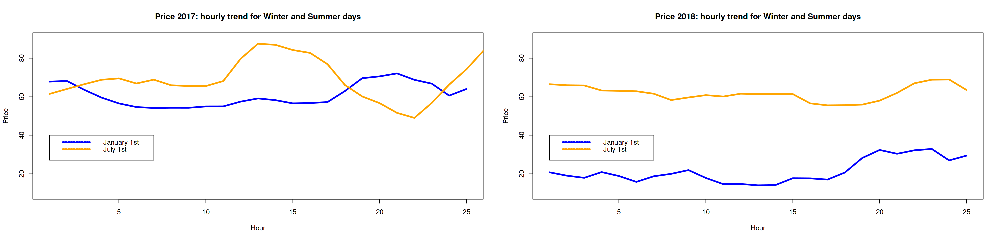

In [15]:
options(repr.plot.width=25, repr.plot.height=6)
par(mfrow=c(1,2))

plot(year_2015$price.actual[1:25], type='l', ylim=c(10,90), main="Price 2015: hourly trend for Winter and Summer days",
    xlab="Hour", ylab="Price", col="blue", lwd=3)
lines(year_2015$price.actual[4315:4339], col="orange", lwd=3)
legend(c(1,7), c(17,30), legend = c('January 1st', 'July 1st'), col=c("blue","orange"), lty=2, lwd=3)

plot(year_2016$price.actual[1:25], type='l', ylim=c(10,90), main="Price 2016: hourly trend for Winter and Summer days",
    xlab="Hour", ylab="Price", col="blue", lwd=3)
lines(year_2016$price.actual[4363:4387], col="orange", lwd=3)
legend(c(1,7), c(17,30), legend = c('January 1st', 'July 1st'), col=c("blue","orange"), lty=2, lwd=3)

plot(year_2017$price.actual[1:25], type='l', ylim=c(10,90), main="Price 2017: hourly trend for Winter and Summer days",
    xlab="Hour", ylab="Price", col="blue", lwd=3)
lines(year_2017$price.actual[344:4368], col="orange", lwd=3)
legend(c(1,7), c(27,40), legend = c('January 1st', 'July 1st'), col=c("blue","orange"), lty=2, lwd=3)

plot(year_2018$price.actual[1:25], type='l', ylim=c(10,90), main="Price 2018: hourly trend for Winter and Summer days",
    xlab="Hour", ylab="Price", col="blue", lwd=3)
lines(year_2018$price.actual[4343:4367], col="orange", lwd=3)
legend(c(1,7), c(27,40), legend = c('January 1st', 'July 1st'), col=c("blue","orange"), lty=2, lwd=3)

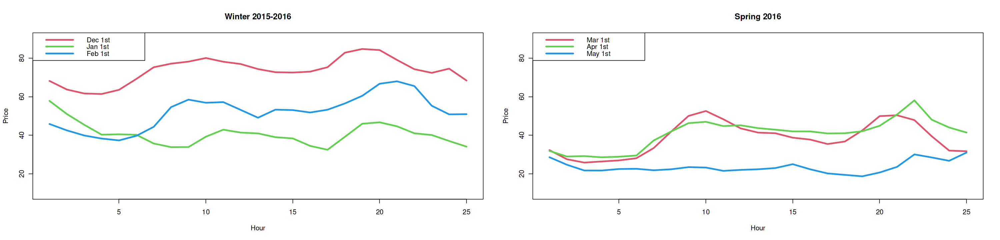

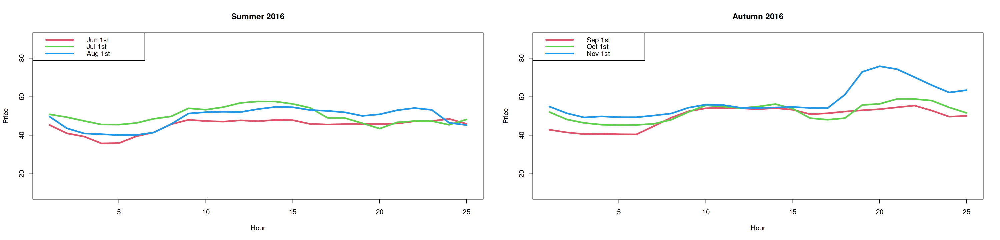

In [16]:
options(repr.plot.width=25, repr.plot.height=6)
par(mfrow=c(1,2))

plot(year_2015[7987:8011,]$price.actual, type='l', col=2, xlab="Hour", ylab="Price", ylim=c(10,90),
    main="Winter 2015-2016", lwd=3)
lines(year_2016[1:25,]$price.actual, col=3, lwd=3)
lines(year_2016[745:769,]$price.actual, col=4, lwd=3)
legend(x="topleft", legend=c('Dec 1st', 'Jan 1st','Feb 1st'), col=c(2,3,4), lwd=3)

plot(year_2016[1441:1465,]$price.actual, type='l', col=2, xlab="Hour", ylab="Price", ylim=c(10,90),
    main="Spring 2016", lwd=3)
lines(year_2016[2184:2208,]$price.actual, col=3, lwd=3)
lines(year_2016[2901:2925,]$price.actual, col=4, lwd=3)
legend(x="topleft", legend=c('Mar 1st', 'Apr 1st','May 1st'), col=c(2,3,4), lwd=3)

plot(year_2016[3644:3668,]$price.actual, type='l', col=2, xlab="Hour", ylab="Price", ylim=c(10,90),
    main="Summer 2016", lwd=3)
lines(year_2016[4363:4387,]$price.actual, col=3, lwd=3)
lines(year_2016[5105:5129,]$price.actual, col=4, lwd=3)
legend(x="topleft", legend=c('Jun 1st', 'Jul 1st','Aug 1st'), col=c(2,3,4), lwd=3)

plot(year_2016[5849:5873,]$price.actual, type='l', col=2, xlab="Hour", ylab="Price", ylim=c(10,90),
    main="Autumn 2016", lwd=3)
lines(year_2016[6568:6592,]$price.actual, col=3, lwd=3)
lines(year_2016[7312:7336,]$price.actual, col=4, lwd=3)
legend(x="topleft", legend=c('Sep 1st', 'Oct 1st','Nov 1st'), col=c(2,3,4), lwd=3)

## 🔌 Energy supply visualizations

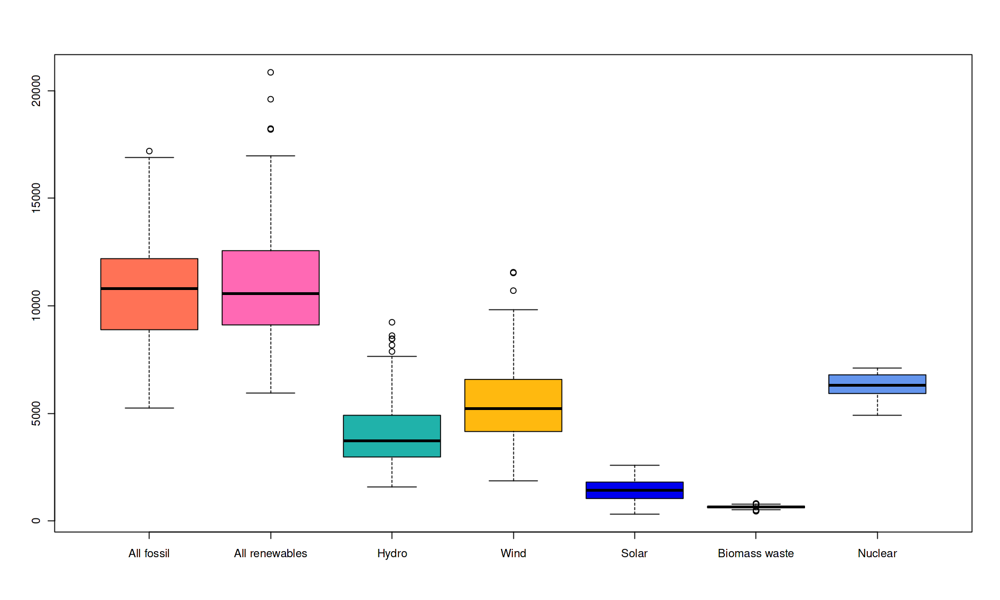

In [17]:
options(repr.plot.width=15, repr.plot.height=9)

labels = c("fossil","nuclear", "biomass & waste","solar", "hydroelectric", "wind",  "renewables")

df_w <- aggregate(subset(df, select=-c(dates, hours, weeks)), by=list(week=df$week), FUN=mean)
df_aggr_w <- FeatAggr(df_w, 'week')

boxplot(df_aggr_w$generation.all.fossil, df_aggr_w$generation.all.renewables,
        df_aggr_w$generation.hydro, df_aggr_w$generation.wind, df_aggr_w$generation.solar,
        df_aggr_w$generation.biomass.waste, df_aggr_w$generation.nuclear, 
        col= c('coral1', 'hotpink', 'lightseagreen','darkgoldenrod1', 'blue2', 'aquamarine', 'cornflowerblue'), 
        names=c('All fossil', 'All renewables', 'Hydro','Wind','Solar', 'Biomass waste', 'Nuclear'))

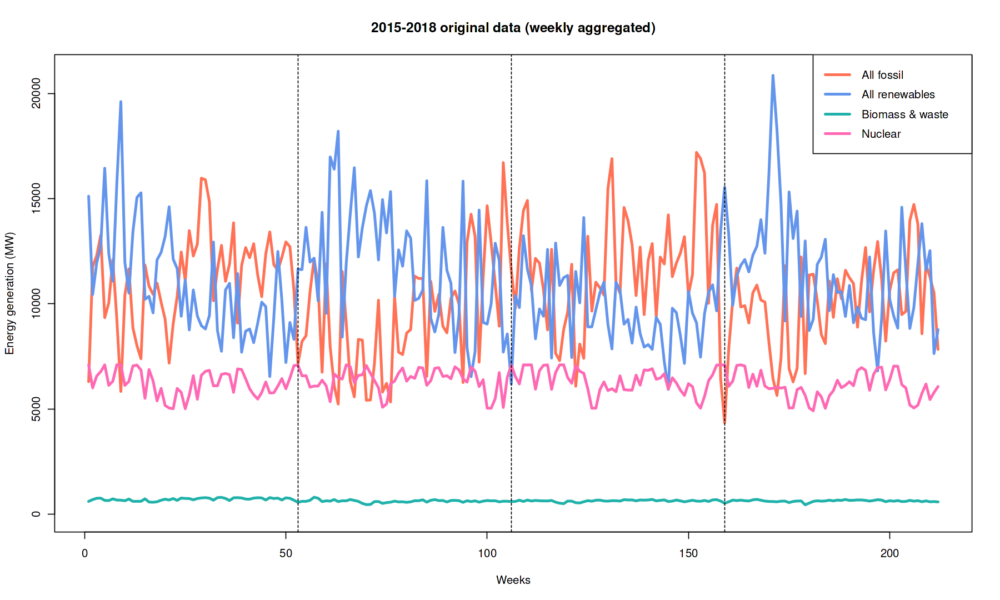

In [18]:
options(repr.plot.width=15, repr.plot.height=9)

data_w_original <- rbind(data_2015_w, data_2016_w, data_2017_w, data_2018_w)

plot(data_w_original$generation.all.fossil, type='l', lwd = 3, ylim=c(0,21000), col='coral1', ylab="Energy generation (MW)", xlab="Weeks", main='2015-2018 original data (weekly aggregated)')
lines(data_w_original$generation.all.renewables, type='l', col='cornflowerblue', lwd = 3)
lines(data_w_original$generation.biomass.waste, type='l', col='lightseagreen', lwd = 3)
lines(data_w_original$generation.nuclear, type='l', col='hotpink', lwd = 3)
abline(v=53, lty=2)
abline(v=53*2, lty=2)
abline(v=53*3, lty=2)
legend(x='topright', legend = c('All fossil', 'All renewables', 'Biomass & waste', 'Nuclear'), 
       col = c('coral1','cornflowerblue', 'lightseagreen', 'hotpink'), lwd = 3)

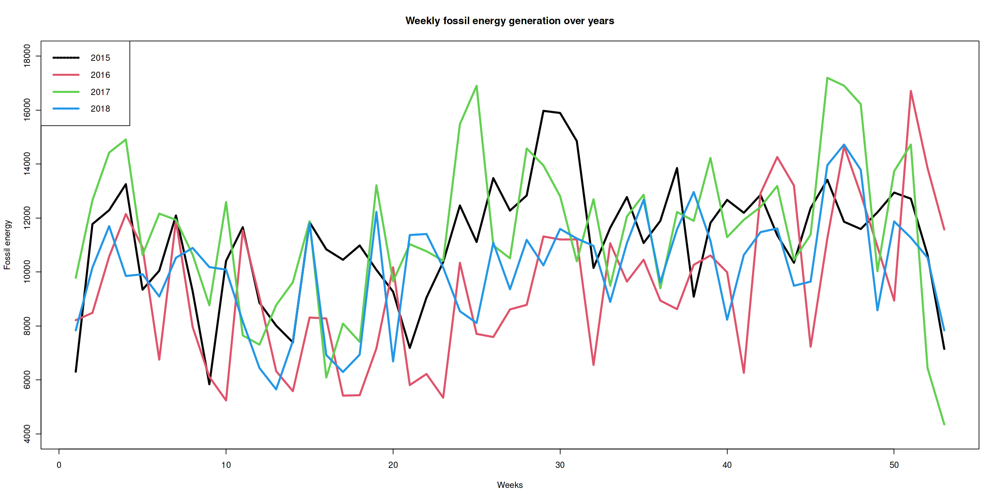

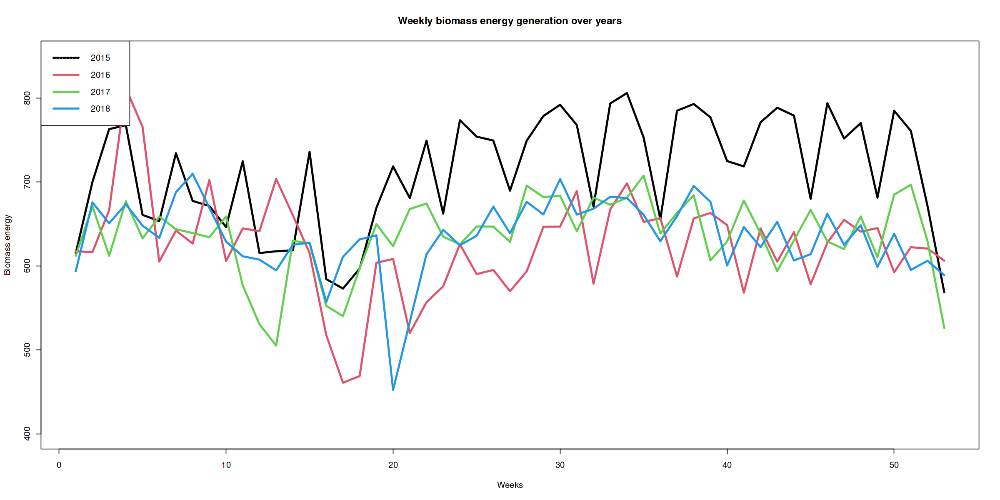

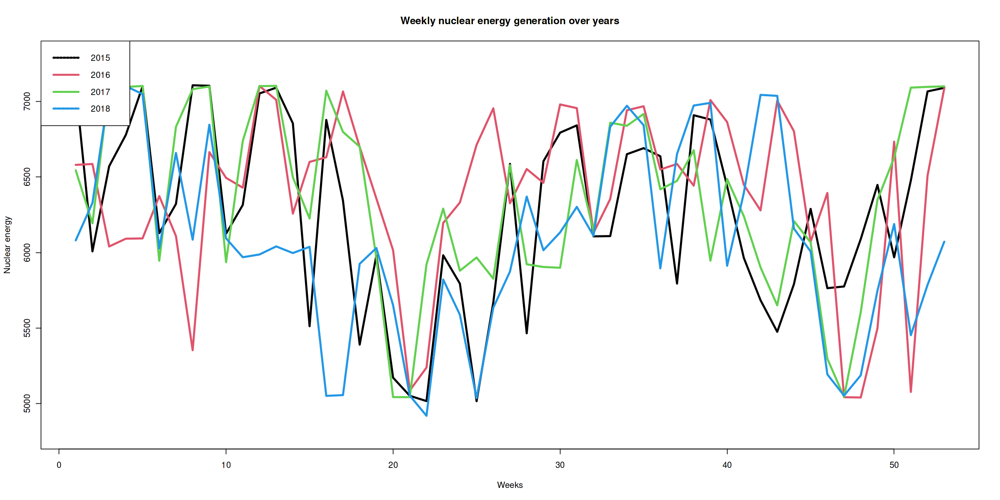

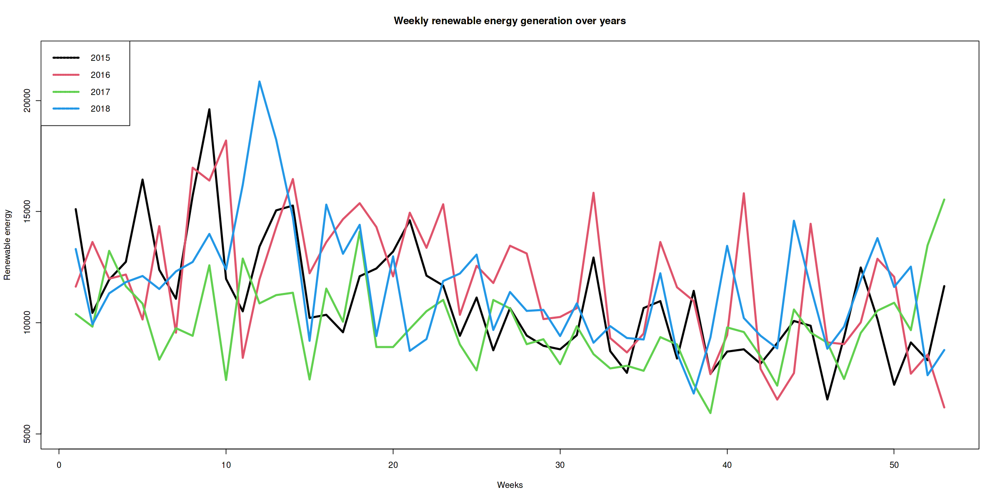

In [19]:
options(repr.plot.width=20, repr.plot.height=10)

plot(data_2015_w$generation.all.fossil, type='l', col=1,
     xlab="Weeks", ylab="Fossil energy",main="Weekly fossil energy generation over years", 
     ylim = c(4000,18000), lwd=3)
lines(data_2016_w$generation.all.fossil, col=2, lwd=3)
lines(data_2017_w$generation.all.fossil, col=3, lwd=3)
lines(data_2018_w$generation.all.fossil, col=4, lwd=3)
legend('topleft',legend=c('2015','2016','2017','2018'), col=c(1,2,3,4), lty=2:10, lwd=3)

plot(data_2015_w$generation.biomass.waste, type='l', col=1,
     xlab="Weeks", ylab="Biomass energy",main="Weekly biomass energy generation over years", 
     ylim=c(400,850), lwd=3)
lines(data_2016_w$generation.biomass.waste, col=2, lwd=3)
lines(data_2017_w$generation.biomass.waste, col=3, lwd=3)
lines(data_2018_w$generation.biomass.waste, col=4, lwd=3)
legend('topleft',legend=c('2015','2016','2017','2018'), col=c(1,2,3,4), lty=2:10, lwd=3)

plot(data_2015_w$generation.nuclear, type='l', col=1,
     xlab="Weeks", ylab="Nuclear energy",main="Weekly nuclear energy generation over years", 
     ylim=c(4800,7300), lwd=3)
lines(data_2016_w$generation.nuclear, col=2, lwd=3)
lines(data_2017_w$generation.nuclear, col=3, lwd=3)
lines(data_2018_w$generation.nuclear, col=4, lwd=3)
legend('topleft',legend=c('2015','2016','2017','2018'), col=c(1,2,3,4), lty=2:10, lwd=3)

plot(data_2015_w$generation.all.renewables, type='l', col=1, 
     xlab="Weeks", ylab="Renewable energy",main="Weekly renewable energy generation over years", 
     ylim=c(5000,22000), lwd=3)
lines(data_2016_w$generation.all.renewables, col=2, lwd=3)
lines(data_2017_w$generation.all.renewables, col=3, lwd=3)
lines(data_2018_w$generation.all.renewables, col=4, lwd=3)
legend('topleft',legend=c('2015','2016','2017','2018'), col=c(1,2,3,4), lty=2:10, lwd=3)

In [20]:
plot_hist_source_energy_consumption <- function(dataset, year, col) {
    
    options(repr.plot.width=25, repr.plot.height=5)
    par(mfrow=c(1,4))

    h <- hist(dataset$generation.all.fossil, plot = FALSE)
    plot(h, xlab = "Generated energy", ylab = "Frequency", ylim=c(0,25),
         main = paste("Fossil energy", year, sep = ' '), col = col, cex.lab=2, cex.axis=1.5, cex.main=2.5)
    h <- hist(dataset$generation.biomass.waste, plot = FALSE)
    plot(h, xlab = "Generated energy", ylab = "Frequency", ylim=c(0,25),
         main = paste("Biomass energy", year, sep = ' '), col = col, cex.lab=2, cex.axis=1.5, cex.main=2.5)
    h <- hist(dataset$generation.nuclear, plot = FALSE)
    plot(h, xlab = "Generated energy", ylab = "Frequency", ylim=c(0,25),
         main = paste("Nuclear energy", year, sep = ' '), col = col, cex.lab=2, cex.axis=1.5, cex.main=2.5)
    h <- hist(dataset$generation.all.renewables, plot = FALSE)
    plot(h, xlab = "Generated energy", ylab = "Frequency",ylim=c(0,25),
         main = paste("Renewable energy", year, sep = ' '), col = col, cex.lab=2, cex.axis=1.5, cex.main=2.5)
    
    par(mfrow=c(1,1))
}

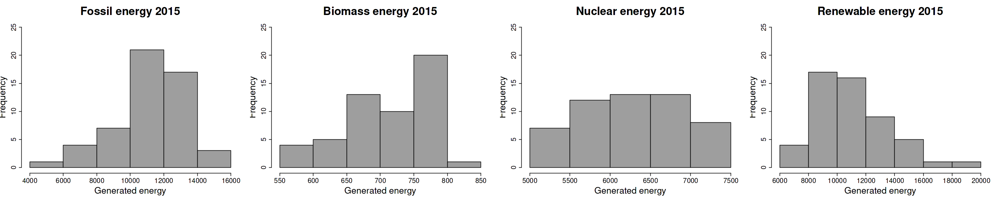

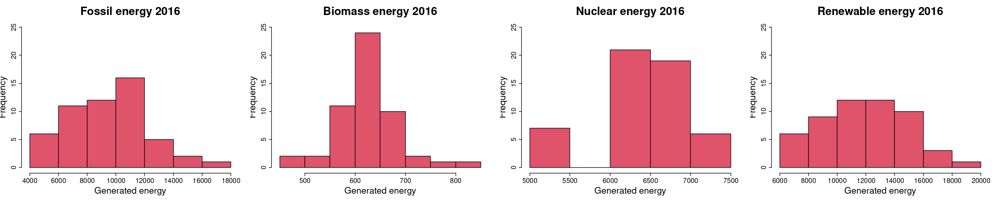

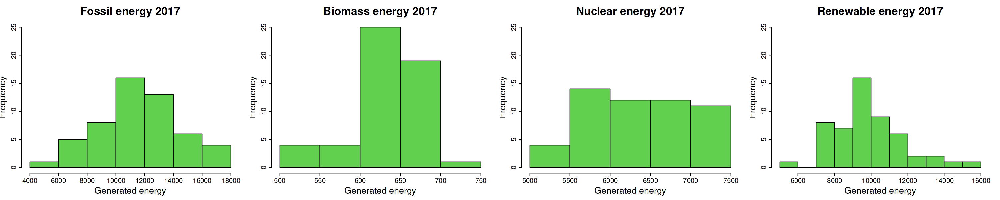

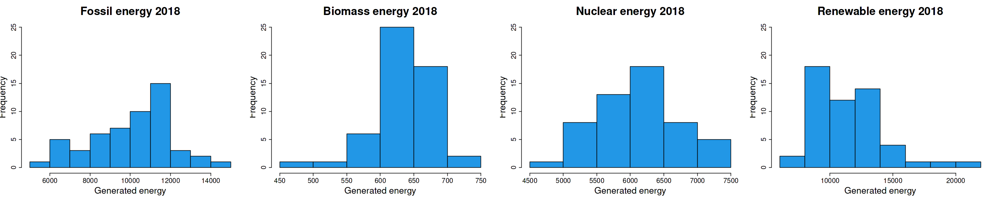

In [21]:
plot_hist_source_energy_consumption(data_2015_w, "2015", 8)
plot_hist_source_energy_consumption(data_2016_w, "2016", 2)
plot_hist_source_energy_consumption(data_2017_w, "2017", 3)
plot_hist_source_energy_consumption(data_2018_w, "2018", 4)

## Autocorrelation analysis
Time aggregations help to reduce autocorrelation in the data and seasonality patterns.

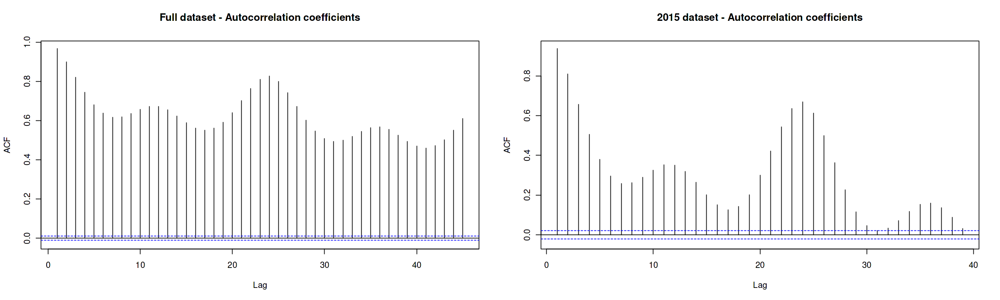

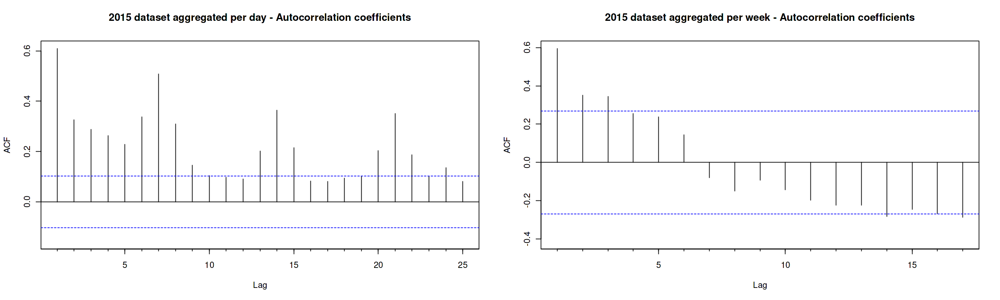

In [22]:
options(repr.plot.width=20, repr.plot.height = 6)
par(mfrow=c(1,2))

Acf(df$price.actual, main="Full dataset - Autocorrelation coefficients")
Acf(year_2015$price.actual, main="2015 dataset - Autocorrelation coefficients")
Acf(year_2015_agg_d$price.actual, main="2015 dataset aggregated per day - Autocorrelation coefficients")
Acf(year_2015_agg_w$price.actual, main="2015 dataset aggregated per week - Autocorrelation coefficients")

## 📈 Energy Price vs Energy Supply for different sources

In [23]:
# Week aggregation + feature aggregation
df_weeks_mean = aggregate(subset(df, select=-c(dates, hours, weeks)),
                         by=list(week=df$week), FUN=mean)

df_weeks_mean_feat_agg = FeatAggr(df_weeks_mean,'week')   
df_weeks_mean_feat_agg$price.actual = df_weeks_mean$price.actual 
df_weeks_mean_feat_agg$week = df_weeks_mean$week

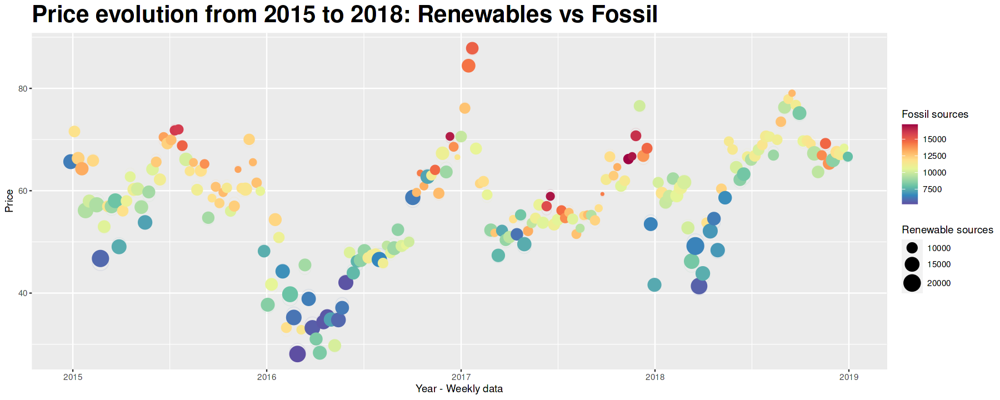

In [24]:
options(repr.plot.width=15, repr.plot.height=6)

colors = c("#5e4fa2", "#3288bd", "#66c2a5", 
           "#abdda4", "#e6f598", "#fee08b", 
           "#fdae61", "#f46d43", "#d53e4f", 
           "#9e0142")
# Plot the dataframe
ggplot(df_weeks_mean_feat_agg,
       # Set the variables on the axis and the graphical elements
       aes(x=week, y=price.actual, size = generation.all.renewables, color = generation.all.fossil)) +

# Create the scatterplot
geom_point(alpha = 0.1, shape = 21) +
# Set the scale of the points
scale_size(range = c(1, 8)) +
# Set the color gradient to use for acousticness
scale_colour_gradientn("Fossil sources", colours = colors) +
# Add some noise to the plot to increase the readibility
geom_point(position=position_jitter(w = 0.0, h = 0.8)) +
# Set the x label
xlab('Year - Weekly data') +
# Set the y label
ylab('Price') + labs(size="Renewable sources") + ggtitle("Price evolution from 2015 to 2018: Renewables vs Fossil") +
theme(plot.title = element_text(size=25, face="bold"))

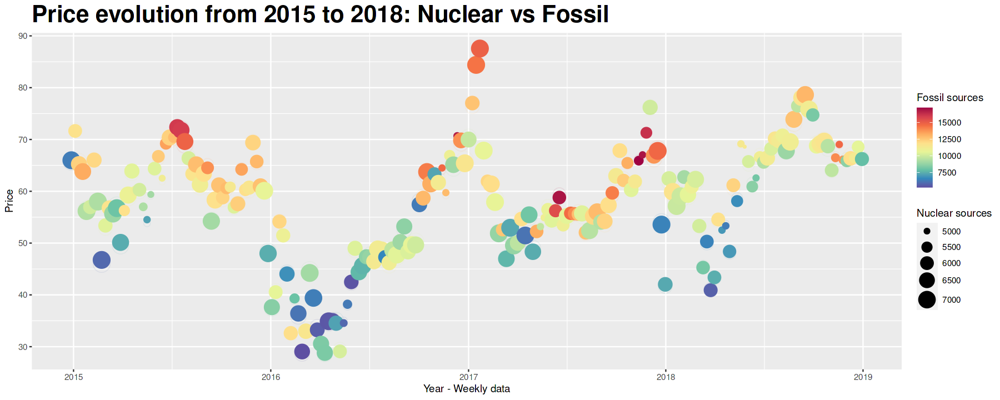

In [25]:
options(repr.plot.width=15, repr.plot.height=6)

colors = c("#5e4fa2", "#3288bd", "#66c2a5", 
           "#abdda4", "#e6f598", "#fee08b", 
           "#fdae61", "#f46d43", "#d53e4f", 
           "#9e0142")
# Plot the dataframe
ggplot(df_weeks_mean_feat_agg,
       # Set the variables on the axis and the graphical elements
       aes(x=week, y=price.actual, size = generation.nuclear, color = generation.all.fossil)) +

# Create the scatterplot
geom_point(alpha = 0.1, shape = 21) +
# Set the scale of the points
scale_size(range = c(1, 8)) +
# Set the color gradient to use for acousticness
scale_colour_gradientn("Fossil sources", colours = colors) +
# Add some noise to the plot to increase the readibility
geom_point(position=position_jitter(w = 0.0, h = 0.8)) +
# Set the x label
xlab('Year - Weekly data') +
# Set the y label
ylab('Price') + labs(size="Nuclear sources") + ggtitle("Price evolution from 2015 to 2018: Nuclear vs Fossil") +
theme(plot.title = element_text(size=25, face="bold"))

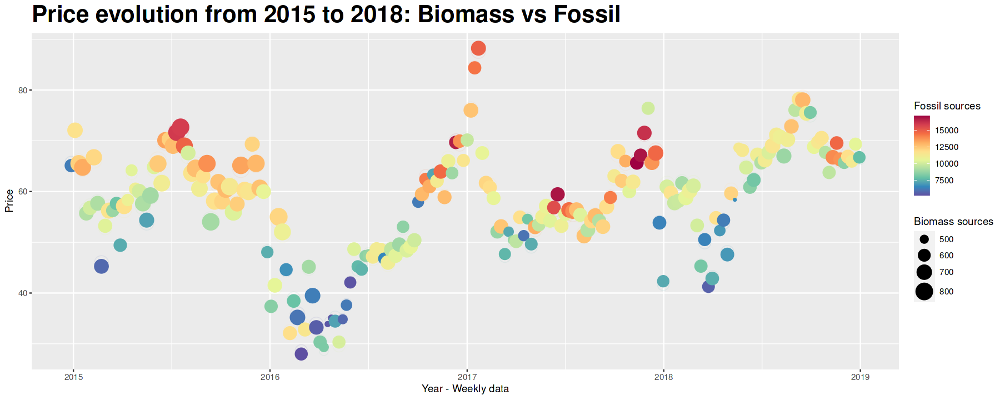

In [26]:
options(repr.plot.width=15, repr.plot.height=6)

colors = c("#5e4fa2", "#3288bd", "#66c2a5", 
           "#abdda4", "#e6f598", "#fee08b", 
           "#fdae61", "#f46d43", "#d53e4f", 
           "#9e0142")
# Plot the dataframe
ggplot(df_weeks_mean_feat_agg,
       # Set the variables on the axis and the graphical elements
       aes(x=week, y=price.actual, size = generation.biomass.waste, color = generation.all.fossil)) +

# Create the scatterplot
geom_point(alpha = 0.1, shape = 21) +
# Set the scale of the points
scale_size(range = c(1, 8)) +
# Set the color gradient to use for acousticness
scale_colour_gradientn("Fossil sources", colours = colors) +
# Add some noise to the plot to increase the readibility
geom_point(position=position_jitter(w = 0.0, h = 0.8)) +
# Set the x label
xlab('Year - Weekly data') +
# Set the y label
ylab('Price') + labs(size="Biomass sources") + ggtitle("Price evolution from 2015 to 2018: Biomass vs Fossil") +
theme(plot.title = element_text(size=25, face="bold"))

In [27]:
# Energy sources and price comparison: a qualitative intuition

supply_and_price_2015_w = data_2015_w
supply_and_price_2015_w$price.actual = year_2015_agg_w$price.actual
supply_and_price_2016_w = data_2016_w
supply_and_price_2016_w$price.actual = year_2016_agg_w$price.actual
supply_and_price_2017_w = data_2017_w
supply_and_price_2017_w$price.actual = year_2017_agg_w$price.actual
supply_and_price_2018_w = data_2018_w
supply_and_price_2018_w$price.actual = year_2018_agg_w$price.actual

# compute the mean for each feature:
means_supply_and_price_2015_w <-as.data.frame(t((colMeans(supply_and_price_2015_w[sapply(supply_and_price_2015_w, is.numeric)]))))
means_supply_and_price_2016_w <-as.data.frame(t((colMeans(supply_and_price_2016_w[sapply(supply_and_price_2016_w, is.numeric)]))))
means_supply_and_price_2017_w <-as.data.frame(t((colMeans(supply_and_price_2017_w[sapply(supply_and_price_2017_w, is.numeric)]))))
means_supply_and_price_2018_w <-as.data.frame(t((colMeans(supply_and_price_2018_w[sapply(supply_and_price_2018_w, is.numeric)]))))

all_means_df <- rbind(means_supply_and_price_2015_w, means_supply_and_price_2016_w, 
                      means_supply_and_price_2017_w, means_supply_and_price_2018_w)
all_means_df <- cbind(Row.Names = c('Year 2015','Year 2016','Year 2017','Year 2018'), all_means_df)
colnames(all_means_df)[which(names(all_means_df) == "Row.Names")] <- "Year"

colnames(all_means_df) <- c('Year','Fossil','Biomass','Nuclear','Solar','Wind','Hydro','All renewables', 'Price')
all_means_df

Year,Fossil,Biomass,Nuclear,Solar,Wind,Hydro,All renewables,Price
<chr>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
Year 2015,11172.205,712.6694,6261.488,1449.216,5522.420,3954.347,10995.183,61.37017
Year 2016,9444.002,623.6546,6380.942,1398.567,5422.022,4972.019,11873.108,47.35267
Year 2017,11530.057,636.4521,6359.613,1475.179,5473.600,2812.581,9855.931,58.80600
Year 2018,10107.551,634.9078,6081.969,1368.461,5568.299,4497.001,11531.620,63.42362


From the following plot we can see that a majority of nuclear power generation determines a low energy price.

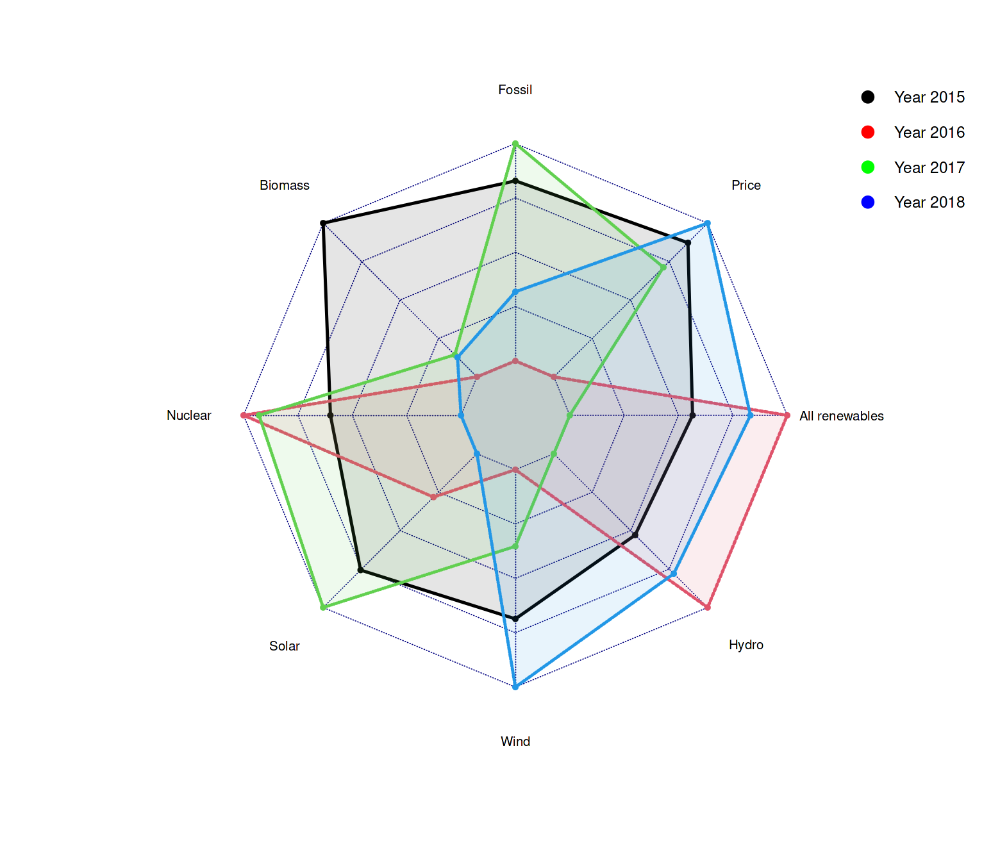

In [28]:
options(repr.plot.width=13, repr.plot.height=11)

data_plot<-rbind(apply(all_means_df[,2:9],2,max) , apply(all_means_df[,2:9],2,min) , all_means_df[,2:9])
radarchart(data_plot, plwd=3, pfcol = scales::alpha(1:4, 0.1))

legend(x=1.2, y=1.3, 
       legend =c('Year 2015','Year 2016','Year 2017','Year 2018'), 
       bty = "n", 
       pch=20, 
       col=c('black','red','green','blue'), 
       text.col = "black", 
       cex=1.2, pt.cex=3)

# ➡️ Statistical methods for modeling the energy supply

We will consider Linear models, Generalized Additive Models and (Generalized) Bass Models with possible shocks for the different energy sources supply aggregated by years.

We introduce all the models for the fossil supply in 2015 and then we report just the most interesting results for all the other combinations of energy sources and years.

## 2015: Fossil supply

In [29]:
all_fossil_2015 <- data_2015_w['generation.all.fossil']
all_fossil_2015 <- all_fossil_2015[,1]

#### Linear model


Call:
tslm(formula = ts(all_fossil_2015) ~ trend)

Residuals:
    Min      1Q  Median      3Q     Max 
-5257.0  -983.6    76.4  1247.7  4703.7 

Coefficients:
            Estimate Std. Error t value Pr(>|t|)    
(Intercept)  9889.80     578.29  17.102   <2e-16 ***
trend          47.50      18.64   2.549   0.0139 *  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Residual standard error: 2075 on 51 degrees of freedom
Multiple R-squared:  0.113,	Adjusted R-squared:  0.09559 
F-statistic: 6.496 on 1 and 51 DF,  p-value: 0.01386


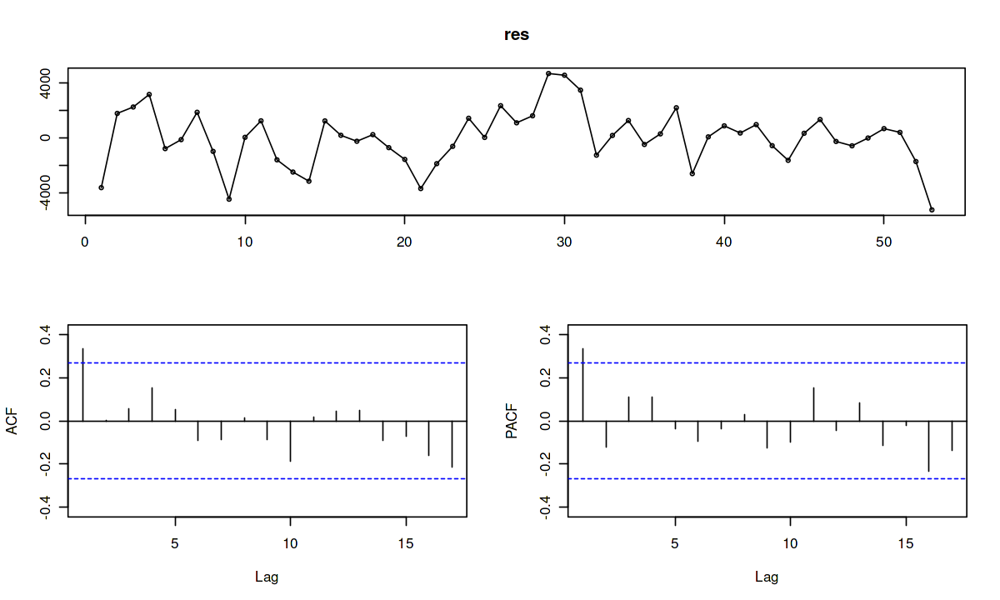


	Breusch-Godfrey test for serial correlation of order up to 10

data:  Residuals from Linear regression model
LM test = 10.347, df = 10, p-value = 0.4106



	Durbin-Watson test

data:  lm_fossil_2015
DW = 1.1475, p-value = 0.0006031
alternative hypothesis: true autocorrelation is not 0


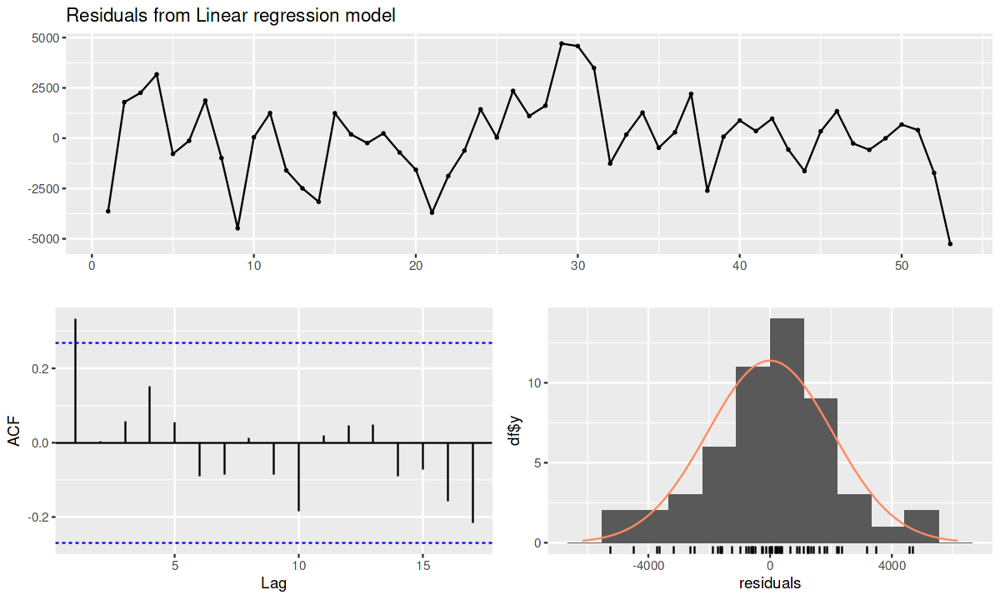

In [30]:
options(repr.plot.width=10, repr.plot.height=6)
par(mfrow=c(1,2))

lm_fossil_2015 <- tslm(ts(all_fossil_2015) ~ trend )
summary(lm_fossil_2015)

# Analysis of the residuals
res <- residuals(lm_fossil_2015)
tsdisplay(res)
checkresiduals(lm_fossil_2015)
dwtest(lm_fossil_2015, alt="two.sided")

#### Generalized Additive Model with seasonality


Call: gam(formula = ts(all_fossil_2015) ~ s(tt) + seas)
Deviance Residuals:
    Min      1Q  Median      3Q     Max 
-3601.7 -1075.2   124.6  1236.1  4440.4 

(Dispersion Parameter for gaussian family taken to be 3391352)

    Null Deviance: 247625191 on 52 degrees of freedom
Residual Deviance: 152610784 on 45 degrees of freedom
AIC: 956.6823 

Number of Local Scoring Iterations: NA 

Anova for Parametric Effects
          Df    Sum Sq  Mean Sq F value   Pr(>F)   
s(tt)      1  27977938 27977938  8.2498 0.006196 **
seas       3  18797042  6265681  1.8475 0.152147   
Residuals 45 152610784  3391352                    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Anova for Nonparametric Effects
            Npar Df Npar F    Pr(F)   
(Intercept)                           
s(tt)             3 4.5705 0.007056 **
seas                                  
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

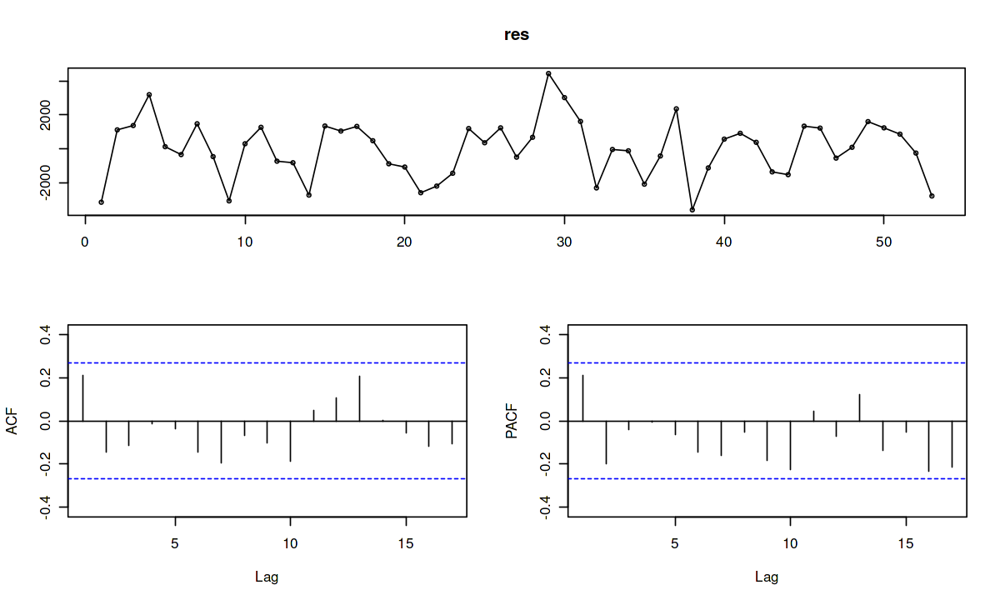


	Breusch-Godfrey test for serial correlation of order up to 10

data:  Residuals from glm.fit
LM test = 10.256, df = 10, p-value = 0.4183


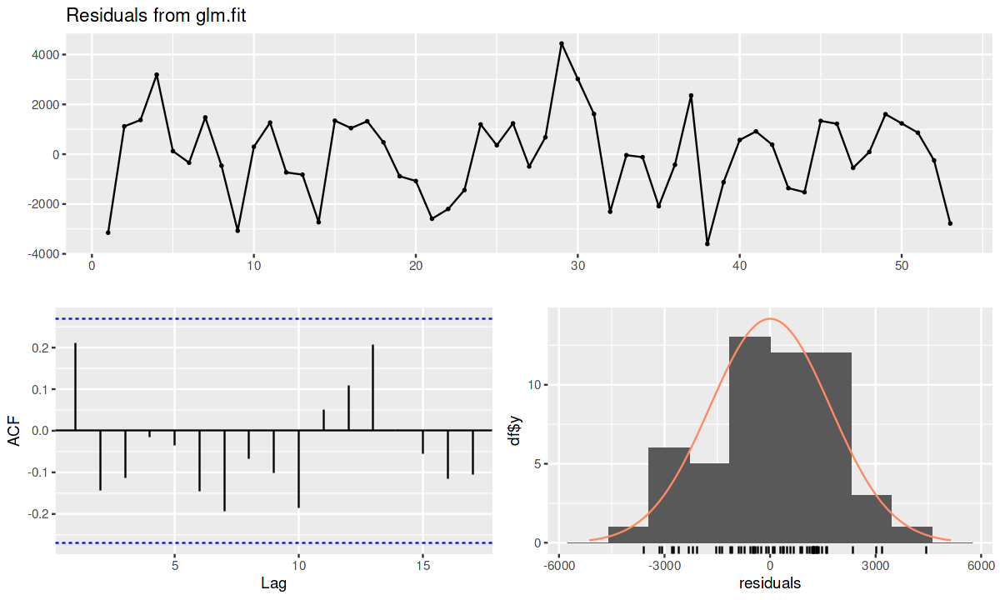

In [31]:
options(repr.plot.width=10, repr.plot.height=6)
par(mfrow=c(1,2))

seas <- factor(c(rep(1:4, length(all_fossil_2015)/4), 1)) # seasonality 
tt <- (1:length(all_fossil_2015)) # time

gam_fossil_2015 <- gam(ts(all_fossil_2015) ~ s(tt) + seas)
summary(gam_fossil_2015)

# Analysis of the residuals:
res <- residuals(gam_fossil_2015)
tsdisplay(res)
checkresiduals(gam_fossil_2015)

#### Bass Model

,Estimate,Std.Error,Lower,Upper,p-value
,<dbl>,<dbl>,<dbl>,<dbl>,<dbl>
m,1.473182e+06,2.233518e+05,1.035420e+06,1.910943e+06,2.57e-08
p,6.125410e-03,8.253426e-04,4.507768e-03,7.743052e-03,1.32e-09
q,1.918042e-02,2.810473e-03,1.367200e-02,2.468885e-02,1.13e-08


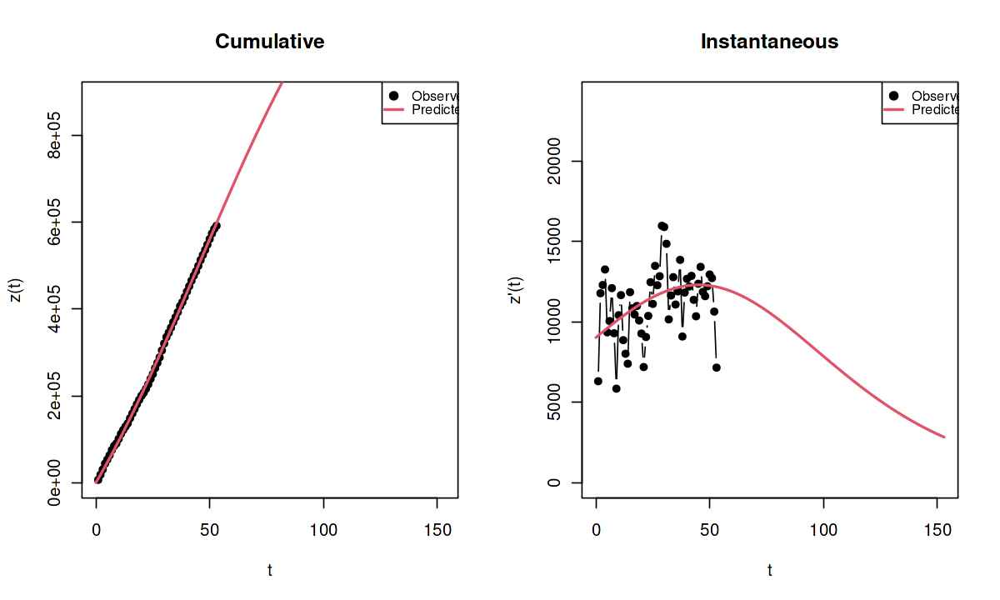

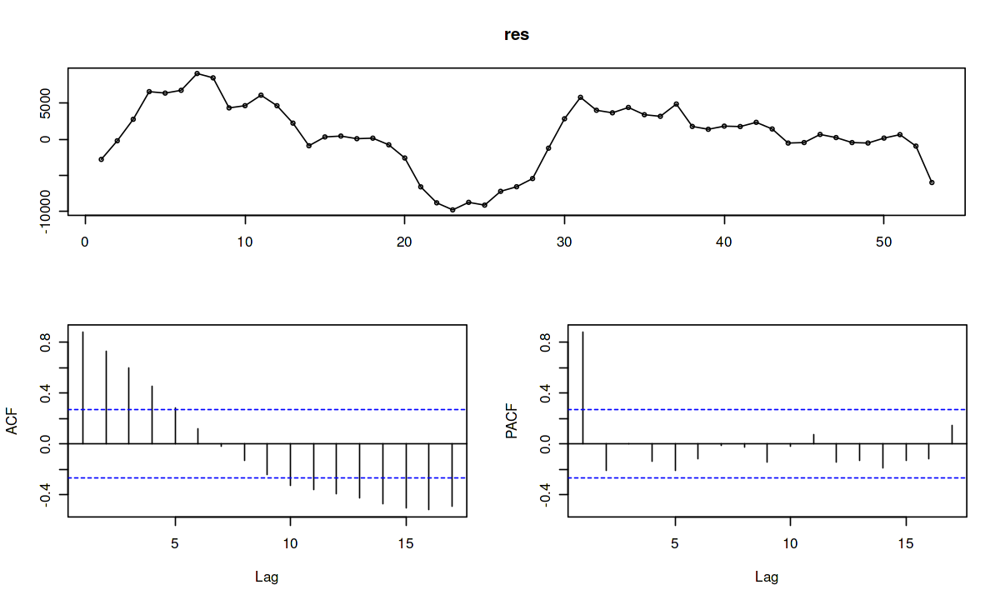


	Ljung-Box test

data:  Residuals
Q* = 125.57, df = 10, p-value < 2.2e-16

Model df: 0.   Total lags used: 10



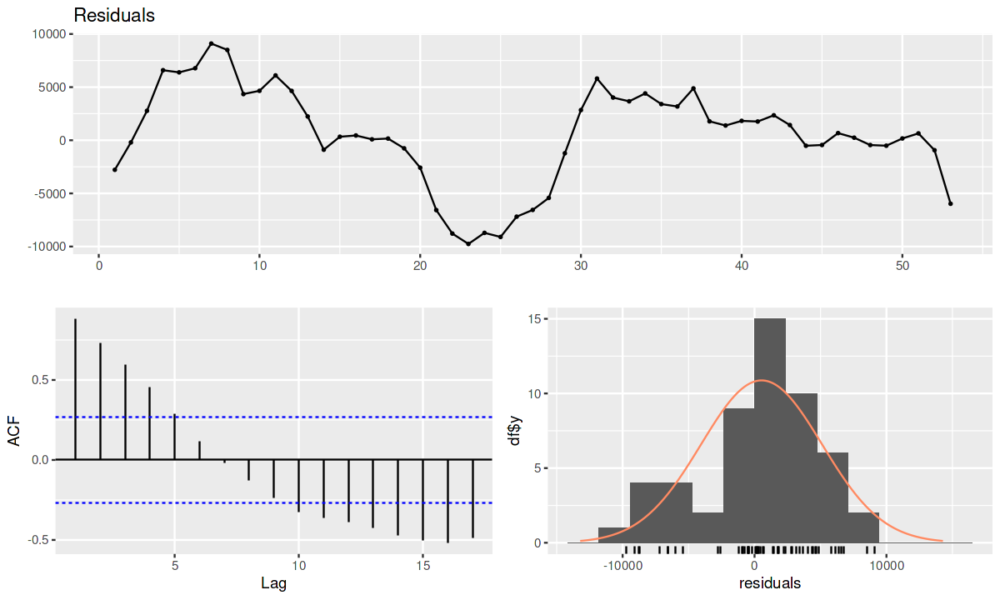

In [32]:
options(repr.plot.width=10, repr.plot.height=6)
par(mfrow=c(1,2))

bass_fossil_2015 <- BM(all_fossil_2015, oos=100)
bass_fossil_2015[c(3,5,6)]

# Analysis of the residuals:
res <- residuals(bass_fossil_2015)
tsdisplay(res)
checkresiduals(bass_fossil_2015)

#### Summary

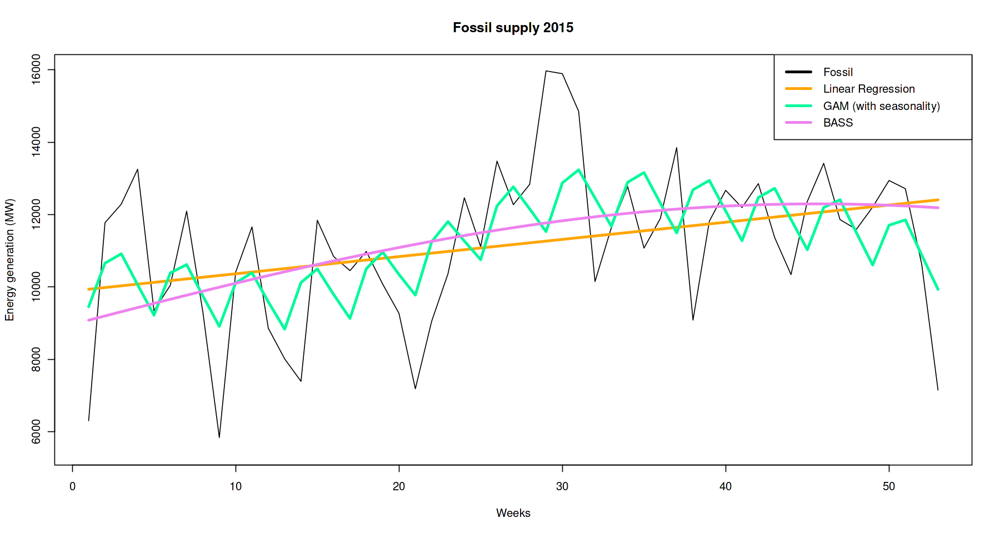

In [33]:
options(repr.plot.width=15, repr.plot.height=8)
par(mfrow=c(1,1))

plot(all_fossil_2015, type="l", ylim=c(5500, 16000), xlab="Weeks", ylab="Energy generation (MW)", main="Fossil supply 2015")
lines(fitted(lm_fossil_2015), col="orange", lwd=3)
lines(fitted(gam_fossil_2015), col="mediumspringgreen", lwd = 3)
lines(c(bass_fossil_2015$fitted[1],diff(bass_fossil_2015$fitted)), col="violet", lwd = 3)
# bass_fossil$fitted reports the cumulative fitted values

legend(x='topright', legend = c('Fossil', 'Linear Regression', 'GAM (with seasonality)', 'BASS'), 
       col = c('black','orange', 'mediumspringgreen', 'violet'), lwd = 3)

The models can only capture the general trend, but not the oscillation of the series.

## 2016: Fossil supply

In [34]:
all_fossil_2016 <- data_2016_w['generation.all.fossil']
all_fossil_2016 <- all_fossil_2016[,1]

#### Generalized Additive Model with seasonality


Call: gam(formula = ts(all_fossil_2016) ~ s(tt) + seas)
Deviance Residuals:
    Min      1Q  Median      3Q     Max 
-3863.0  -996.2  -227.6  1228.1  3602.8 

(Dispersion Parameter for gaussian family taken to be 3537958)

    Null Deviance: 386994698 on 52 degrees of freedom
Residual Deviance: 159208056 on 45 degrees of freedom
AIC: 958.9253 

Number of Local Scoring Iterations: NA 

Anova for Parametric Effects
          Df    Sum Sq  Mean Sq F value    Pr(>F)    
s(tt)      1  90406497 90406497 25.5533 7.657e-06 ***
seas       3  65102592 21700864  6.1337  0.001375 ** 
Residuals 45 159208056  3537958                      
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Anova for Nonparametric Effects
            Npar Df Npar F     Pr(F)    
(Intercept)                             
s(tt)             3 7.4216 0.0003848 ***
seas                                    
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

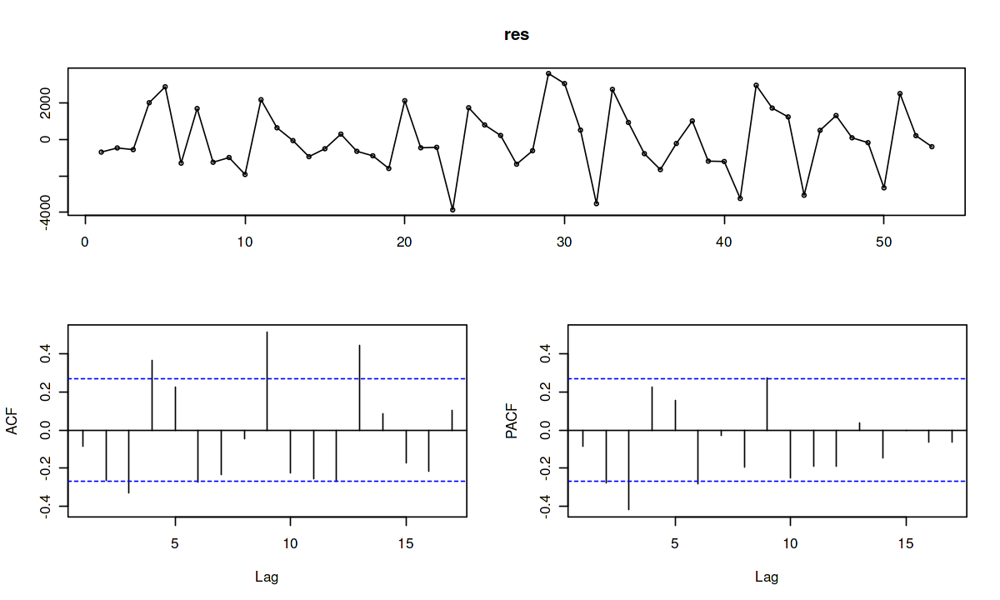


	Breusch-Godfrey test for serial correlation of order up to 10

data:  Residuals from glm.fit
LM test = 31.256, df = 10, p-value = 0.0005322


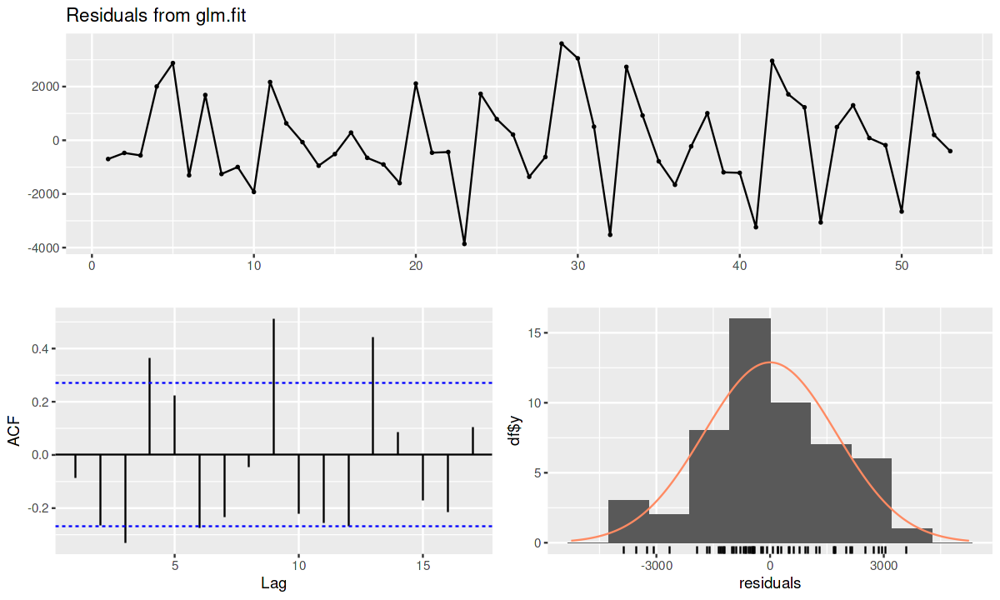

In [35]:
options(repr.plot.width=10, repr.plot.height=6)
par(mfrow=c(1,2))

seas <- factor(c(rep(1:4, length(all_fossil_2016)/4), 1)) # seasonality 
tt <- (1:length(all_fossil_2016)) # time

gam_fossil_2016 <- gam(ts(all_fossil_2016) ~ s(tt) + seas) 
summary(gam_fossil_2016)

# Analysis of the residuals:
res <- residuals(gam_fossil_2016)
tsdisplay(res)
checkresiduals(gam_fossil_2016)

#### Model the residuals of GAM with ARIMA


 ARIMA(0,0,0) with zero mean     : 943.0037
 ARIMA(0,0,0) with non-zero mean : 945.1653
 ARIMA(0,0,1) with zero mean     : 944.01
 ARIMA(0,0,1) with non-zero mean : 946.2587
 ARIMA(0,0,2) with zero mean     : 941.5688
 ARIMA(0,0,2) with non-zero mean : 943.9121
 ARIMA(0,0,3) with zero mean     : Inf
 ARIMA(0,0,3) with non-zero mean : Inf
 ARIMA(0,0,4) with zero mean     : 933.6739
 ARIMA(0,0,4) with non-zero mean : 936.2233
 ARIMA(0,0,5) with zero mean     : Inf
 ARIMA(0,0,5) with non-zero mean : Inf
 ARIMA(1,0,0) with zero mean     : 944.7766
 ARIMA(1,0,0) with non-zero mean : 947.0264
 ARIMA(1,0,1) with zero mean     : Inf
 ARIMA(1,0,1) with non-zero mean : Inf
 ARIMA(1,0,2) with zero mean     : Inf
 ARIMA(1,0,2) with non-zero mean : Inf
 ARIMA(1,0,3) with zero mean     : Inf
 ARIMA(1,0,3) with non-zero mean : Inf
 ARIMA(1,0,4) with zero mean     : Inf
 ARIMA(1,0,4) with non-zero mean : 938.5572
 ARIMA(2,0,0) with zero mean     : 943.0028
 ARIMA(2,0,0) with non-zero mean : 945.3447


Series: res 
ARIMA(0,0,4) with zero mean 

Coefficients:
          ma1      ma2      ma3     ma4
      -0.0093  -0.1931  -0.3755  0.4523
s.e.   0.1328   0.1323   0.1695  0.1949

sigma^2 = 2218543:  log likelihood = -461.2
AIC=932.4   AICc=933.67   BIC=942.25

Training set error measures:
                    ME     RMSE      MAE    MPE     MAPE      MASE        ACF1
Training set -20.48265 1432.168 1166.348 50.283 142.7088 0.5941388 -0.02536062


	Ljung-Box test

data:  Residuals from ARIMA(0,0,4) with zero mean
Q* = 15.584, df = 6, p-value = 0.01617

Model df: 4.   Total lags used: 10



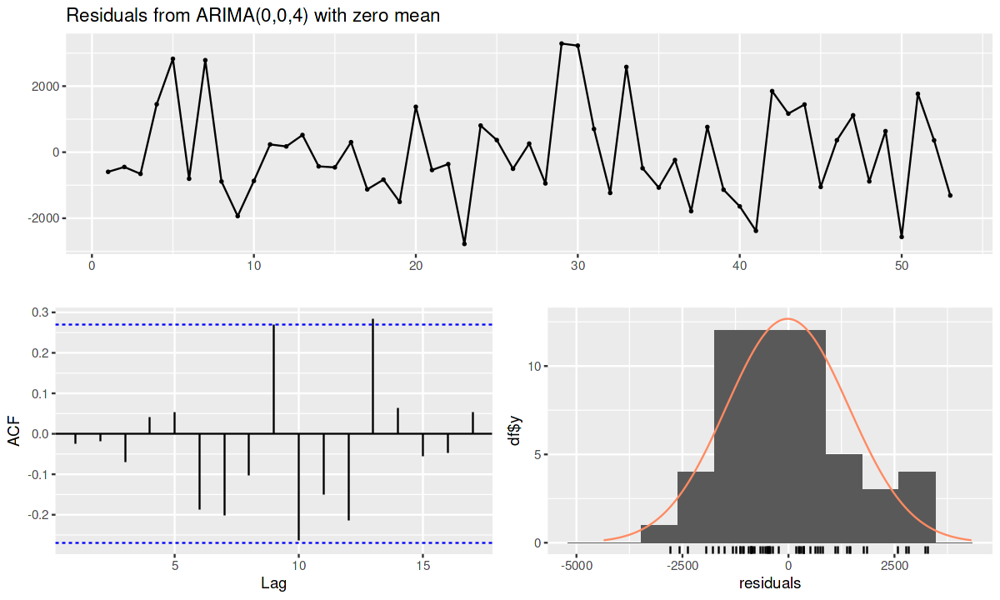

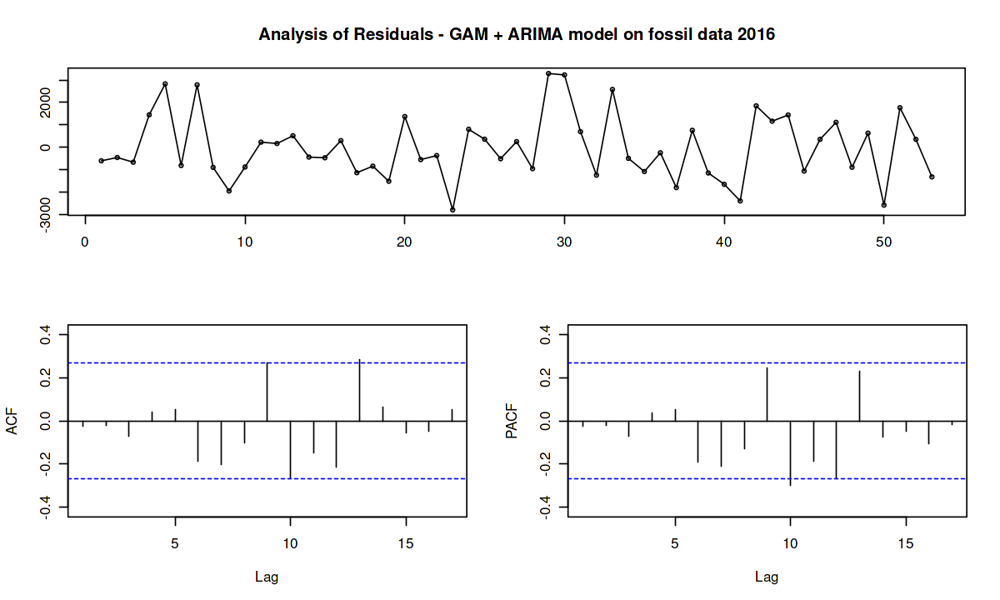

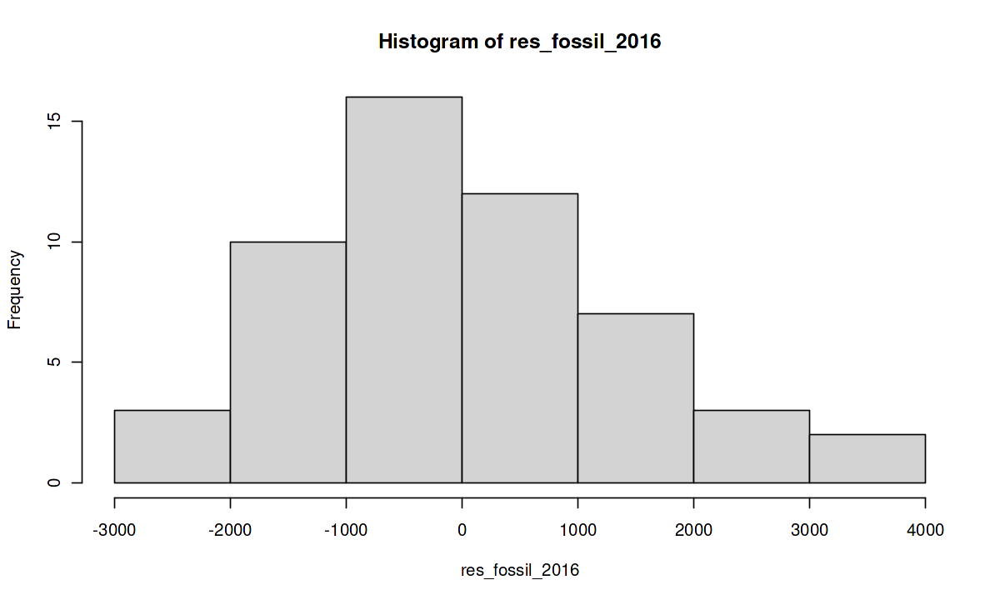

In [36]:
options(repr.plot.width=10, repr.plot.height=6)
par(mfrow=c(1,2))

aar_fossil_2016 <- auto.arima(res, stepwise=FALSE, approximation=FALSE, trace=TRUE)
summary(aar_fossil_2016)
checkresiduals(aar_fossil_2016)

# Analisis of the residuals
fit_fossil_2016 <- fitted(gam_fossil_2016) + fitted(aar_fossil_2016)
res_fossil_2016 <- all_fossil_2016 - fit_fossil_2016
tsdisplay(res_fossil_2016, main="Analysis of Residuals - GAM + ARIMA model on fossil data 2016")

hist(res_fossil_2016)

#### Generalized Additive Model without seasonality


Call: gam(formula = ts(all_fossil_2016) ~ s(tt))
Deviance Residuals:
     Min       1Q   Median       3Q      Max 
-4445.85 -1528.61   -19.17  1798.16  4005.60 

(Dispersion Parameter for gaussian family taken to be 4673532)

    Null Deviance: 386994698 on 52 degrees of freedom
Residual Deviance: 224329464 on 48 degrees of freedom
AIC: 971.0992 

Number of Local Scoring Iterations: NA 

Anova for Parametric Effects
          Df    Sum Sq  Mean Sq F value   Pr(>F)    
s(tt)      1  90406497 90406497  19.344 6.04e-05 ***
Residuals 48 224329464  4673532                     
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

Anova for Nonparametric Effects
            Npar Df Npar F    Pr(F)   
(Intercept)                           
s(tt)             3 5.1537 0.003606 **
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

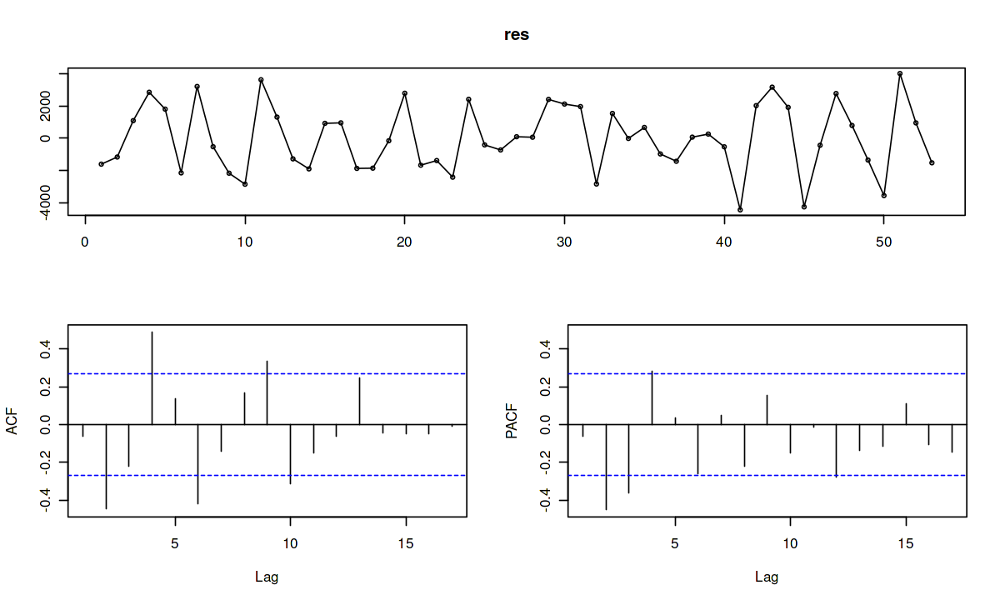


	Breusch-Godfrey test for serial correlation of order up to 10

data:  Residuals from glm.fit
LM test = 30.099, df = 10, p-value = 0.0008252


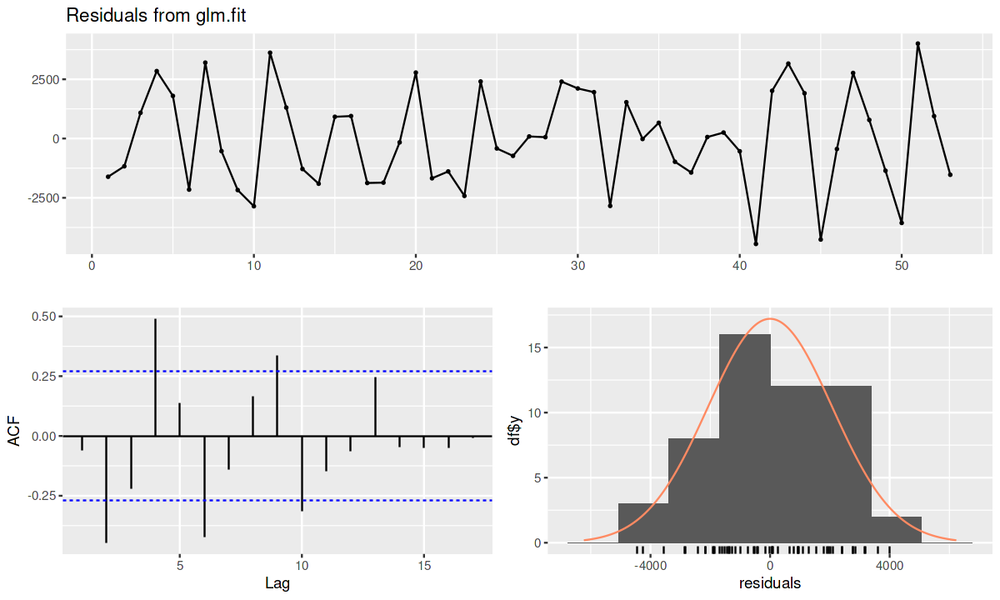

In [37]:
options(repr.plot.width=10, repr.plot.height=6)
par(mfrow=c(1,2))

gam_fossil_2016_without_seas <- gam(ts(all_fossil_2016) ~ s(tt))
summary(gam_fossil_2016_without_seas)

# Analysis of the residuals:
res <- residuals(gam_fossil_2016_without_seas)
tsdisplay(res)
checkresiduals(gam_fossil_2016_without_seas)

#### Summary

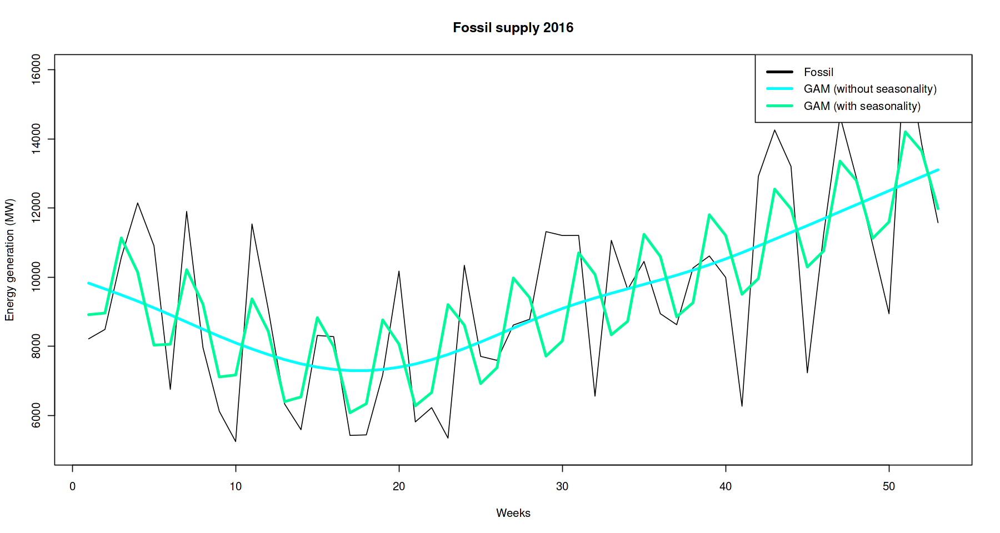

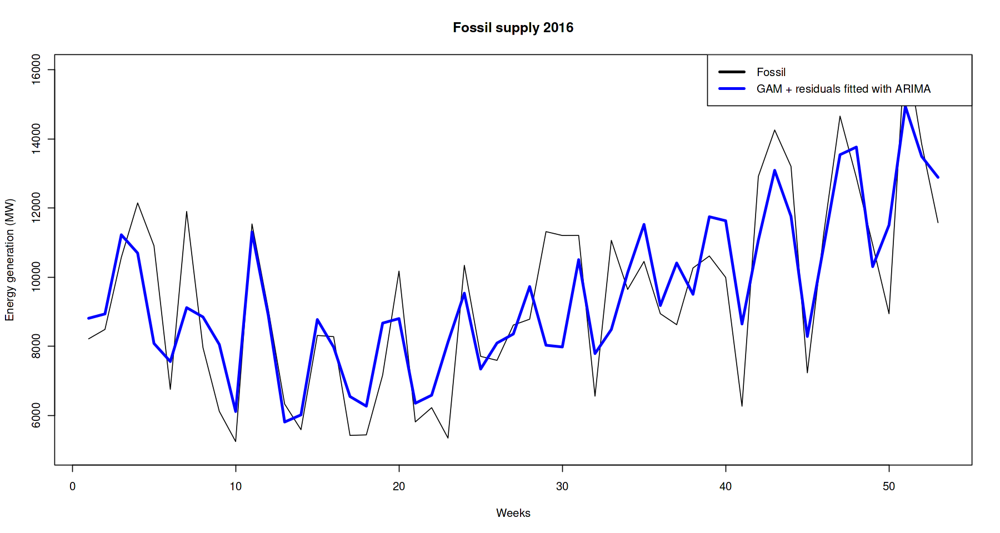

In [38]:
options(repr.plot.width=15, repr.plot.height=8)
par(mfrow=c(1,1))

plot(all_fossil_2016, type="l", ylim=c(5000, 16000), xlab="Weeks", ylab="Energy generation (MW)", main="Fossil supply 2016")
lines(fitted(gam_fossil_2016_without_seas), col="cyan", lwd=3)
lines(fitted(gam_fossil_2016), col="mediumspringgreen", lwd = 3)
legend(x='topright', legend = c('Fossil', 'GAM (without seasonality)', 'GAM (with seasonality)'), 
       col = c('black','cyan', 'mediumspringgreen'), lwd = 3)

plot(all_fossil_2016, type="l", ylim=c(5000, 16000), xlab="Weeks", ylab="Energy generation (MW)", main="Fossil supply 2016")
lines(fitted(aar_fossil_2016) + fitted(gam_fossil_2016), col="blue", lwd = 3)
legend(x='topright', legend = c('Fossil', 'GAM + residuals fitted with ARIMA' ), 
       col = c('black','blue'), lwd = 3)

By fitting the residuals, the performance of GAM slightly improves.

## 2017: Biomass supply

In [39]:
biomass_2017 <- data_2017_w['generation.biomass.waste']
biomass_2017 <- biomass_2017[,1]

#### Generalized Additive Model without seasonality


Call: gam(formula = ts(biomass_2017) ~ s(tt))
Deviance Residuals:
    Min      1Q  Median      3Q     Max 
-98.031 -23.310   2.366  25.635  71.532 

(Dispersion Parameter for gaussian family taken to be 1492.876)

    Null Deviance: 104671.1 on 52 degrees of freedom
Residual Deviance: 71658.03 on 48 degrees of freedom
AIC: 544.504 

Number of Local Scoring Iterations: NA 

Anova for Parametric Effects
          Df Sum Sq Mean Sq F value Pr(>F)
s(tt)      1   3149  3148.7  2.1091 0.1529
Residuals 48  71658  1492.9               

Anova for Nonparametric Effects
            Npar Df Npar F     Pr(F)    
(Intercept)                             
s(tt)             3 6.6682 0.0007447 ***
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

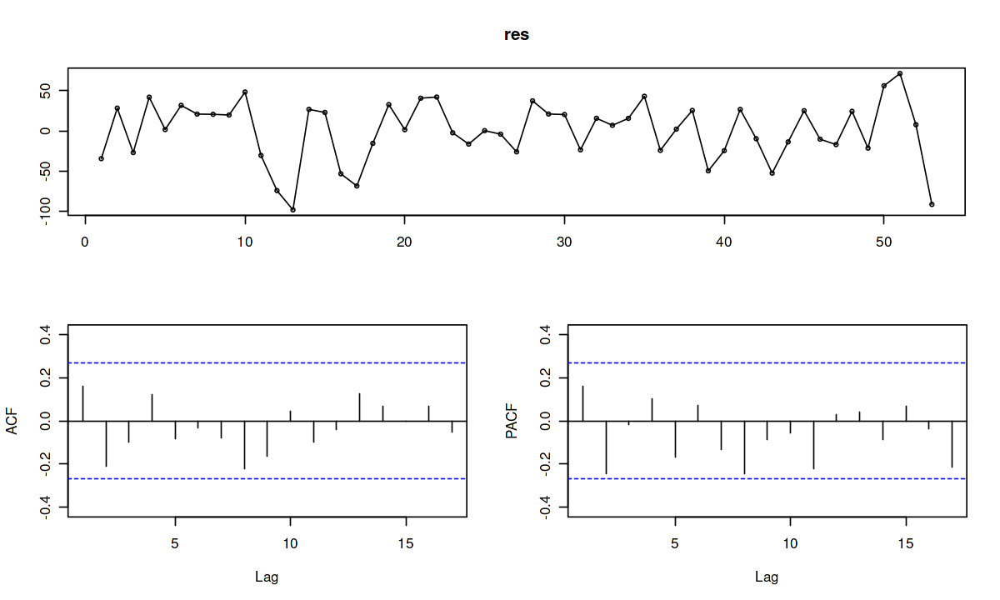


	Breusch-Godfrey test for serial correlation of order up to 10

data:  Residuals from glm.fit
LM test = 16.155, df = 10, p-value = 0.09528


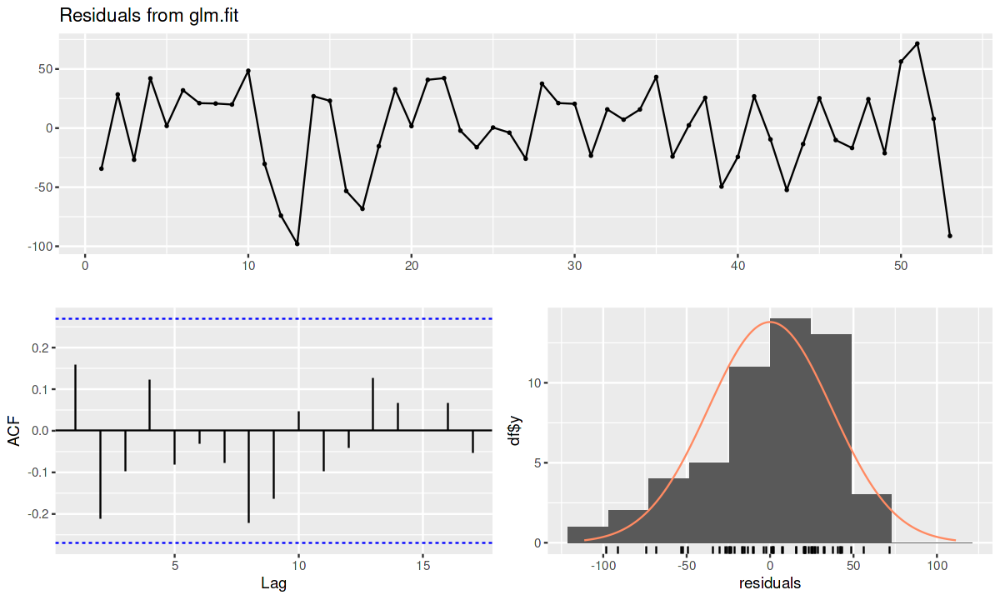

In [40]:
options(repr.plot.width=10, repr.plot.height=6)
par(mfrow=c(1,2))

tt <- (1:length(biomass_2017)) # time
gam_biomass_2017 <- gam(ts(biomass_2017) ~ s(tt))
summary(gam_biomass_2017)

# Analysis of the residuals:
res <- residuals(gam_biomass_2017)
tsdisplay(res)
checkresiduals(gam_biomass_2017)

#### Generalized Bass Model with exponential shock

m            p            q 
1.593040e+05 3.816039e-03 6.630393e-03

Call: ( Generalized Bass model with 1  Exponential  shock )

  GBM(series = biomass_2017, shock = "exp", nshock = 1, prelimestimates = c(159303.95, 
    0.0038, 0.0066, 10, -0.1, 0.1))

Residuals:
     Min.  1st Qu.   Median     Mean  3rd Qu.     Max. 
-64.1374 -23.6608  -1.6040   0.1267  22.4349  82.5866 

Coefficients:
           Estimate    Std.Error         Lower         Upper  p-value    
m     7.709318e+04 4.216604e+03  6.882879e+04  8.535757e+04 5.32e-23 ***
p     8.184697e-03 4.251261e-04  7.351465e-03  9.017929e-03 6.22e-24 ***
q     1.366517e-02 1.191960e-03  1.132897e-02  1.600136e-02 3.25e-15 ***
a1    1.046480e+01 2.753340e-01  9.925155e+00  1.100444e+01 6.08e-37 ***
b1   -1.668376e-01 2.802898e-02 -2.217734e-01 -1.119018e-01 3.18e-07 ***
c1   -2.591616e-01 2.229971e-02 -3.028682e-01 -2.154550e-01 2.02e-15 ***
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error  39.32285  on  47  degrees of freedom
 Multiple R-squared:   0.999986  

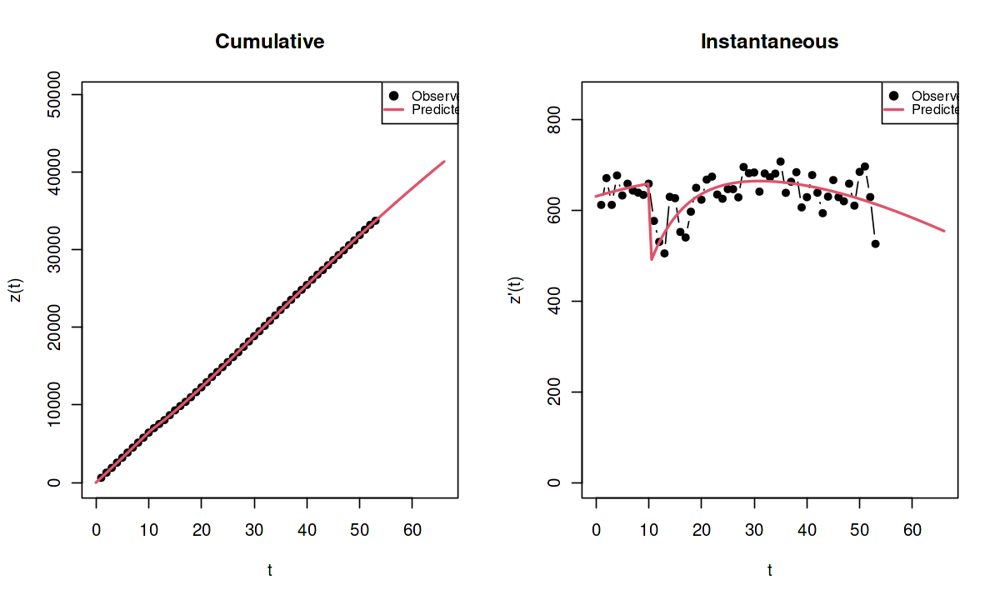

In [41]:
options(repr.plot.width=10, repr.plot.height=6)
par(mfrow=c(1,2))

# Compute the standard Bass Model's coefficient to be used as initialization values
bass_biomass_2017 <- BM(biomass_2017, oos=100, display="F")
bass_biomass_2017$coefficients

GBM_biomass_exp_2017 <- GBM(biomass_2017, shock="exp", nshock=1, 
                            prelimestimates=c(159303.95, 0.0038, 0.0066, 10, -0.1, 0.1))
summary(GBM_biomass_exp_2017) 

#### Summary

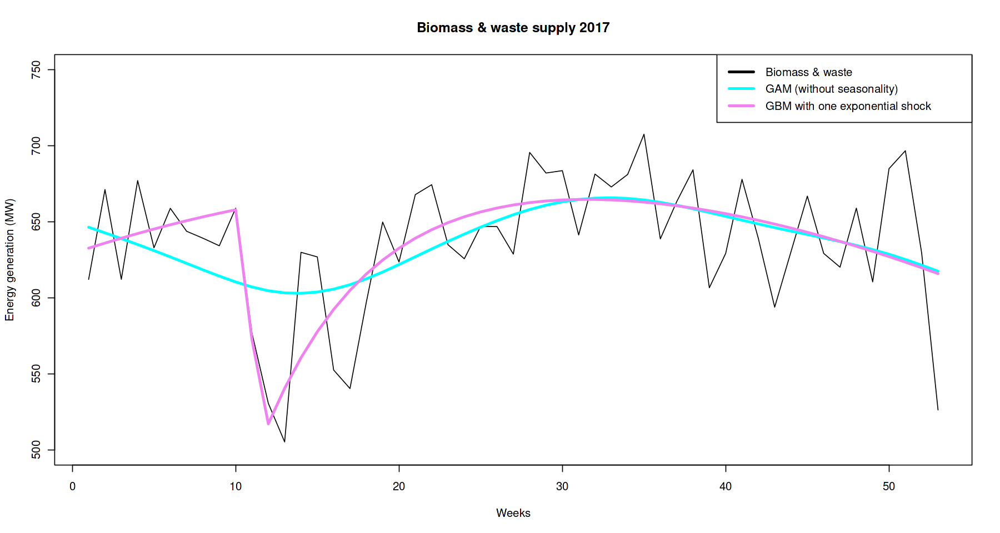

In [42]:
options(repr.plot.width=15, repr.plot.height=8)
par(mfrow=c(1,1))

plot(biomass_2017, type="l", ylim=c(500, 750), xlab="Weeks", ylab="Energy generation (MW)", main="Biomass & waste supply 2017")
lines(fitted(gam_biomass_2017), col="cyan", lwd = 3) 
lines(c(GBM_biomass_exp_2017$fitted[1],diff(GBM_biomass_exp_2017$fitted)), col="violet", lwd = 3)
# GBM_biomass_exp_2017$fitted reports the cumulative fitted values

legend(x='topright', legend = c('Biomass & waste', 'GAM (without seasonality)', 'GBM with one exponential shock'), 
       col = c('black','cyan', 'violet'), lwd = 3)

## 2016: Nuclear supply

In [43]:
nuclear_2016 <- data_2016_w['generation.nuclear']
nuclear_2016 <- nuclear_2016[,1]

#### Generalized Additive Model without seasonality


Call: gam(formula = ts(nuclear_2016) ~ s(tt))
Deviance Residuals:
     Min       1Q   Median       3Q      Max 
-1260.31  -207.43    22.61   348.13  1041.88 

(Dispersion Parameter for gaussian family taken to be 285015.6)

    Null Deviance: 16322944 on 52 degrees of freedom
Residual Deviance: 13680746 on 48 degrees of freedom
AIC: 822.8515 

Number of Local Scoring Iterations: NA 

Anova for Parametric Effects
          Df   Sum Sq Mean Sq F value Pr(>F)
s(tt)      1    46613   46613  0.1635 0.6877
Residuals 48 13680746  285016               

Anova for Nonparametric Effects
            Npar Df Npar F   Pr(F)  
(Intercept)                         
s(tt)             3 3.0356 0.03802 *
---
Signif. codes:  0 ‘***’ 0.001 ‘**’ 0.01 ‘*’ 0.05 ‘.’ 0.1 ‘ ’ 1

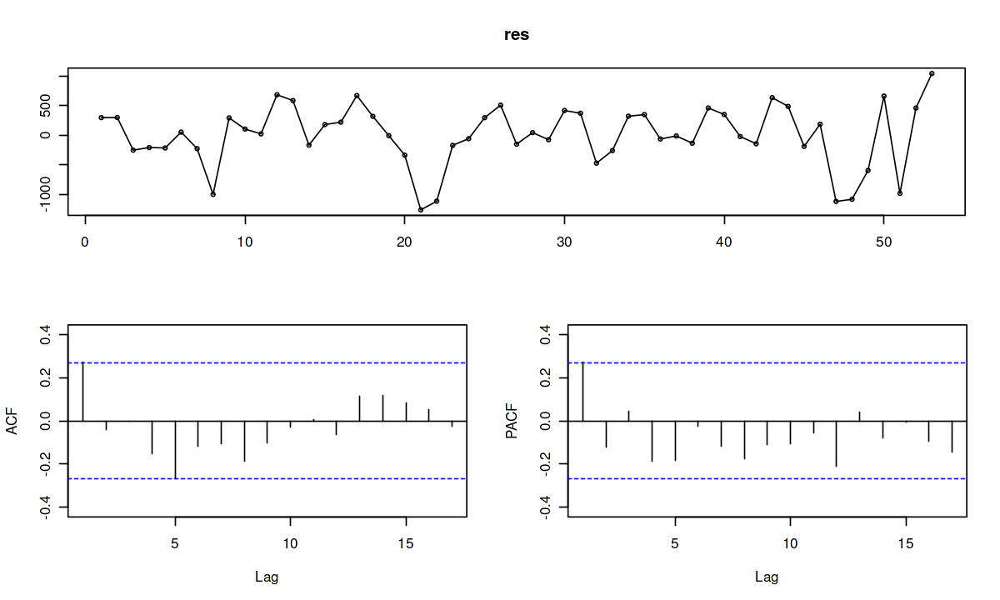


	Breusch-Godfrey test for serial correlation of order up to 10

data:  Residuals from glm.fit
LM test = 14.463, df = 10, p-value = 0.1529


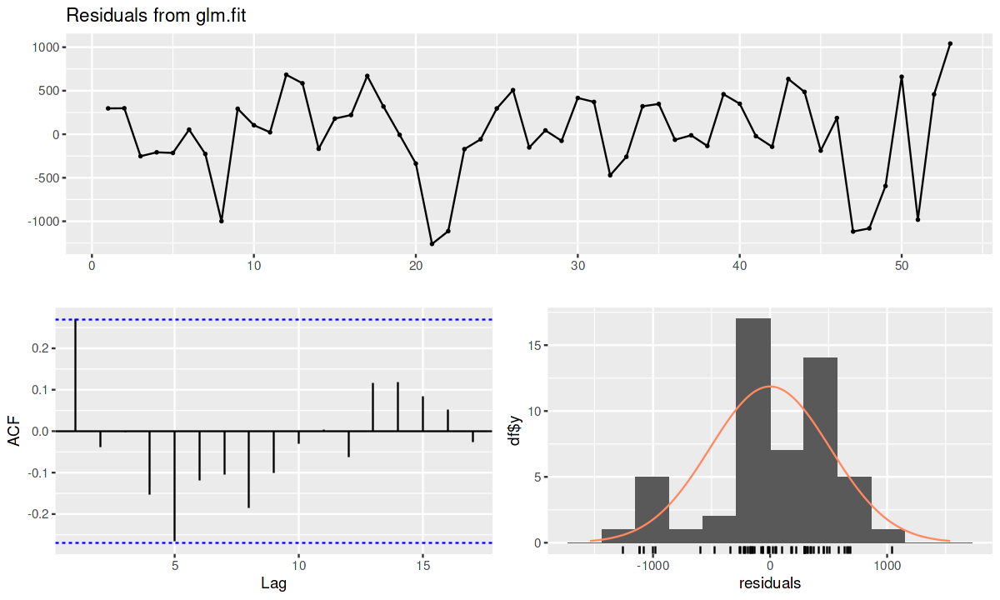

In [44]:
options(repr.plot.width=10, repr.plot.height=6)
par(mfrow=c(1,2))

tt <- (1:length(nuclear_2016)) # time
gam_nuclear_2016 <- gam(ts(nuclear_2016) ~ s(tt))
summary(gam_nuclear_2016)

# Analysis of the residuals:
res <- residuals(gam_nuclear_2016)
tsdisplay(res)
checkresiduals(gam_nuclear_2016)

#### Generalized Bass Model with exponential shocks

m            p            q 
8.594708e+05 7.154717e-03 1.164774e-02

Call: ( Generalized Bass model with 2  Exponential  shock )

  GBM(series = nuclear_2016, shock = "exp", nshock = 2, prelimestimates = c(859470.84, 
    0.00715, 0.01165, 20, -0.1, 0.1, 46, -0.1, 0.1))

Residuals:
    Min. 1st Qu.  Median    Mean 3rd Qu.    Max. 
 -982.9  -180.1    28.4    22.7   287.1   834.8 

Coefficients:
           Estimate    Std.Error         Lower         Upper  p-value    
m     7.865516e+05 6.297654e+04  6.631199e+05  9.099834e+05 4.60e-16 ***
p     7.788135e-03 5.824738e-04  6.646507e-03  8.929762e-03 4.23e-17 ***
q     1.444746e-02 1.535340e-03  1.143825e-02  1.745667e-02 4.21e-12 ***
a1    1.976538e+01 2.578523e-01  1.926000e+01  2.027076e+01 1.76e-48 ***
b1   -4.503571e-01 1.111895e-01 -6.682845e-01 -2.324296e-01 2.04e-04 ***
c1   -3.351560e-01 6.112471e-02 -4.549582e-01 -2.153538e-01 1.93e-06 ***
a2    4.598308e+01 2.152635e-01  4.556118e+01  4.640499e+01 5.26e-68 ***
b2   -5.071579e-01 1.673667e-01 -8.351906e-01 -1.791252e-01 4.08e-03  **
c2   -3.640035

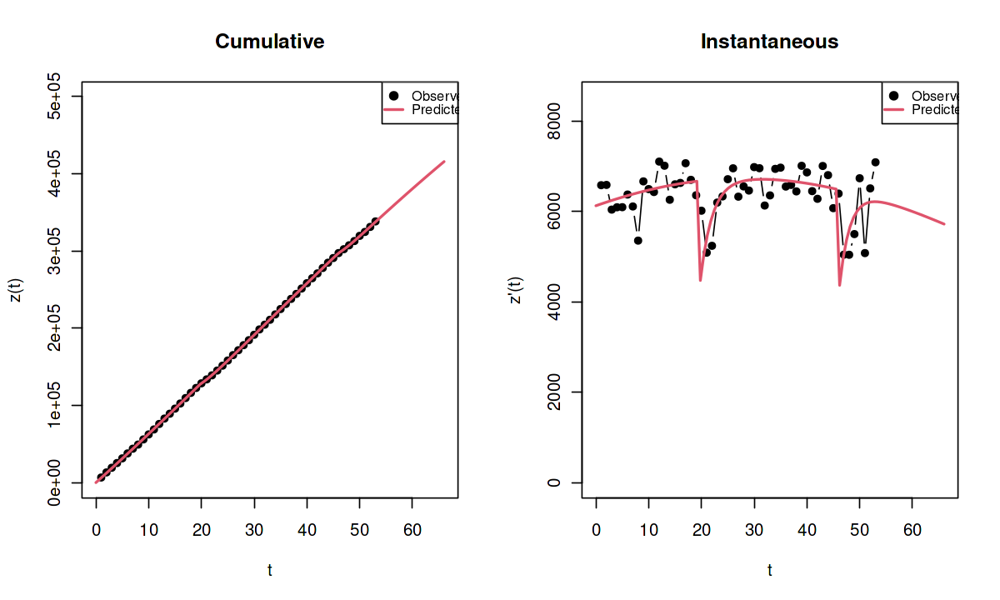

In [45]:
options(repr.plot.width=10, repr.plot.height=6)
par(mfrow=c(1,2))

# Compute the standard Bass Model's coefficient to be used as initialization values
bass_nuclear_2016 <- BM(nuclear_2016, oos=100, display="F")
bass_nuclear_2016$coefficients

GBM_nuclear_exp_2016 <- GBM(nuclear_2016, shock="exp", nshock=2, 
                            prelimestimates=c(859470.84, 0.00715, 0.01165, 20, -0.1, 0.1, 46, -0.1, 0.1))
summary(GBM_nuclear_exp_2016) 

#### Summary

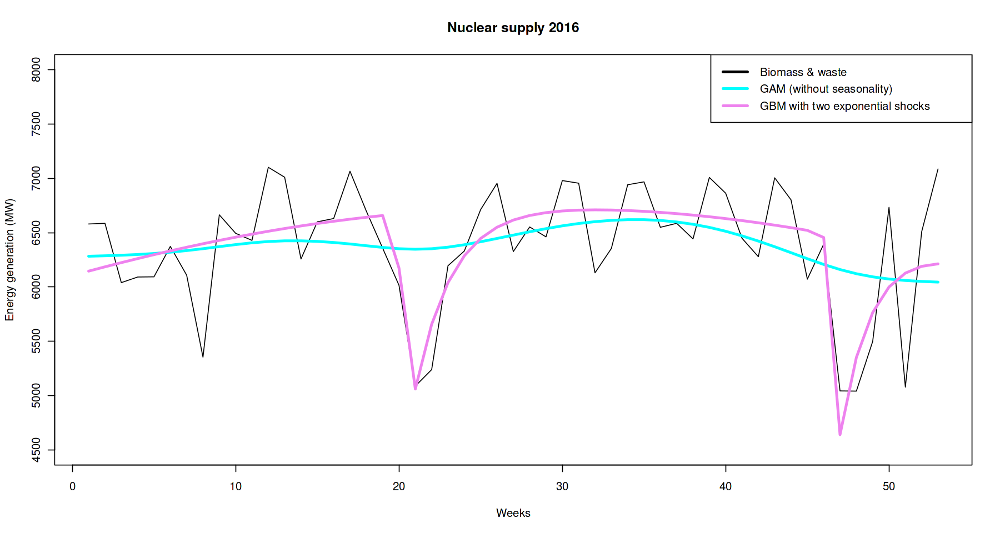

In [46]:
options(repr.plot.width=15, repr.plot.height=8)
par(mfrow=c(1,1))

plot(nuclear_2016, type="l",ylim=c(4500, 8000), xlab="Weeks", ylab="Energy generation (MW)", main="Nuclear supply 2016")
lines(fitted(gam_nuclear_2016), col="cyan", lwd = 3) 
lines(c(GBM_nuclear_exp_2016$fitted[1],diff(GBM_nuclear_exp_2016$fitted)), col="violet", lwd = 3)
# GBM_nuclear_exp_2016$fitted reports the cumulative fitted values

legend(x='topright', legend = c('Biomass & waste', 'GAM (without seasonality)', 'GBM with two exponential shocks'), 
       col = c('black','cyan', 'violet'), lwd = 3)

# ➡️ Competition and collaboration dynamics between sources of energy

## 🛝 Daily data smoothing

In this context, we will consider smoothed daily data instead of weekly data.

In [47]:
daily_data_smoothing <- function(dataset, year, smooth_h=2, smooth_ngrid=50, plot='TRUE') {
    
    options(repr.plot.width=12, repr.plot.height=6)
    par(mfrow=c(1,1))

    days = 1:365
    
    dataset_smooth = copy(dataset)
    
    val = sm.regression(days, dataset$generation.all.fossil, h = smooth_h, ngrid = smooth_ngrid, eval.points=days, display="none")
    dataset_smooth$generation.all.fossil = val$estimate
    val = sm.regression(days, dataset$generation.all.renewables, h = smooth_h, ngrid = smooth_ngrid,eval.points=days, display="none")
    dataset_smooth$generation.all.renewables = val$estimate
    val = sm.regression(days, dataset$generation.hydro, h = smooth_h, ngrid = smooth_ngrid,eval.points=days, display="none")
    dataset_smooth$generation.hydro = val$estimate
    val = sm.regression(days, dataset$generation.wind, h = smooth_h, ngrid = smooth_ngrid,eval.points=days, display="none")
    dataset_smooth$generation.wind = val$estimate
    val = sm.regression(days, dataset$generation.solar, h = smooth_h, ngrid = smooth_ngrid,eval.points=days, display="none")
    dataset_smooth$generation.solar = val$estimate
    val = sm.regression(days, dataset$generation.biomass.waste, h = smooth_h, ngrid = smooth_ngrid, eval.points=days, display="none")
    dataset_smooth$generation.biomass.waste = val$estimate
    val = sm.regression(days, dataset$generation.nuclear, h = smooth_h,, ngrid = smooth_ngrid,eval.points=days, display="none")
    dataset_smooth$generation.nuclear = val$estimate
    
    if(plot) {
    matplot(dataset_smooth, type = "l", lty=1,lwd =2, col = c('black','green','deeppink','darkorange','bisque', 'blue2','cyan'),
           main=paste("Energy supply:",year, 'smoothed data',sep=" "), xlab="Days", ylab="Energy supply")
    legend(x='topright',legend = c('All fossil', 'All renewables', 'Hydro','Wind','Solar', 'Biomass waste', 'Nuclear'), 
           col = c('black','cyan','blue2','bisque','darkorange', 'green', 'deeppink' ), lwd = 2)
    }
    par(mfrow=c(1,1))

    return(dataset_smooth)
}

#### 📅 Visualizations per year

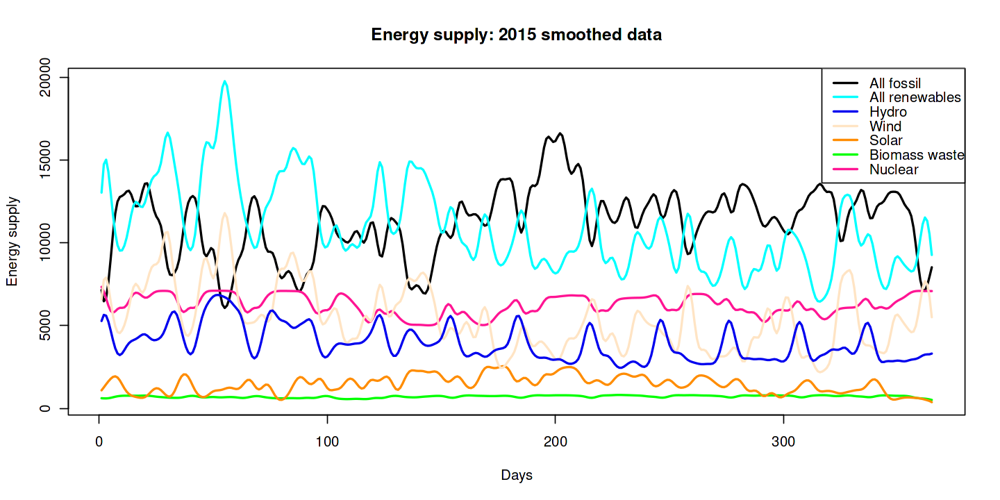

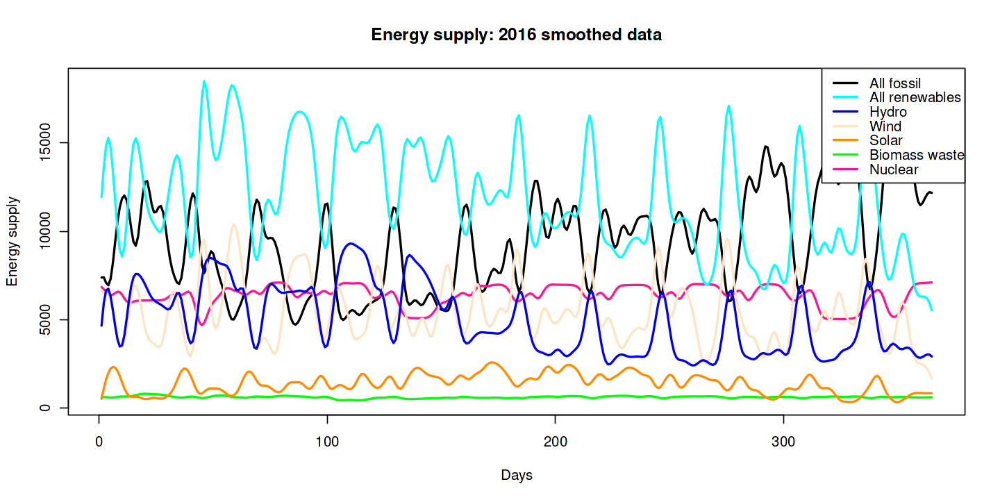

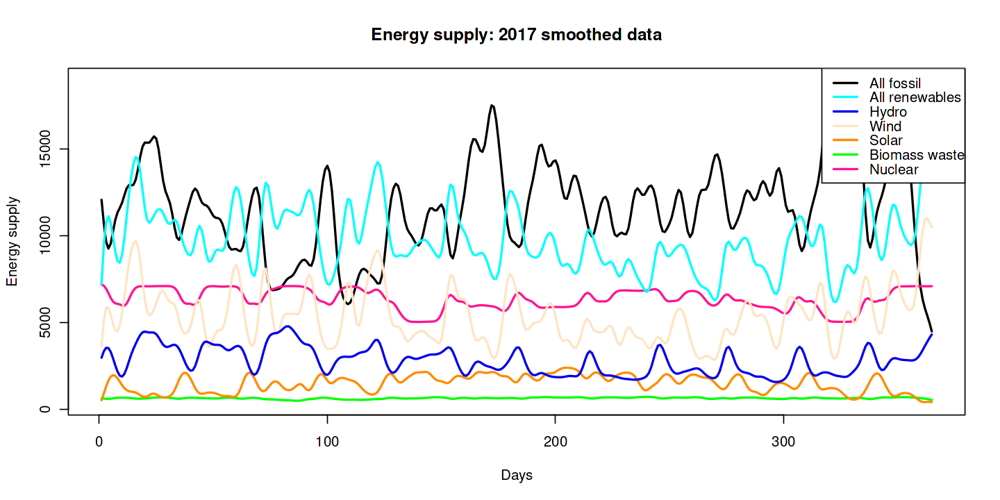

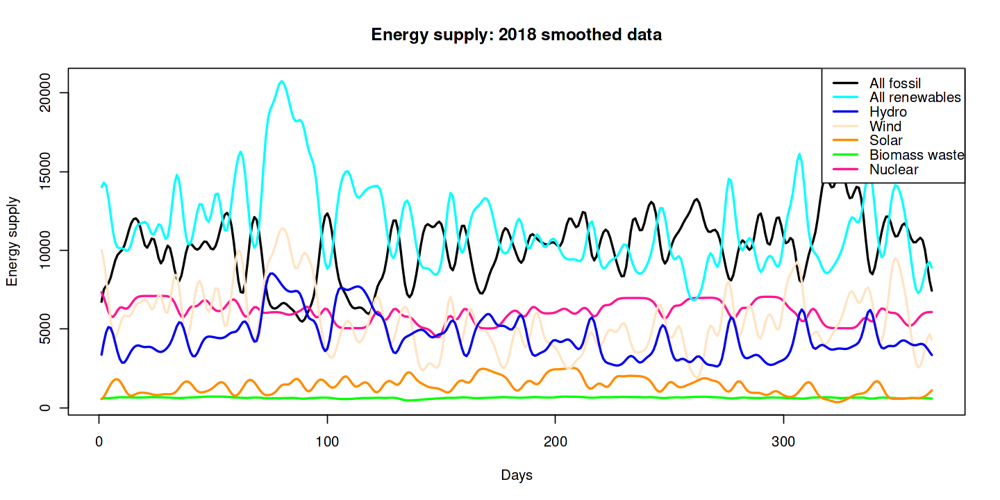

In [48]:
data_2015_d_smooth = daily_data_smoothing(data_2015_d, "2015")
data_2016_d_smooth = daily_data_smoothing(data_2016_d, "2016")
data_2017_d_smooth = daily_data_smoothing(data_2017_d, "2017")
data_2018_d_smooth = daily_data_smoothing(data_2018_d, "2018")

#### 💡 Visualizations per energy source

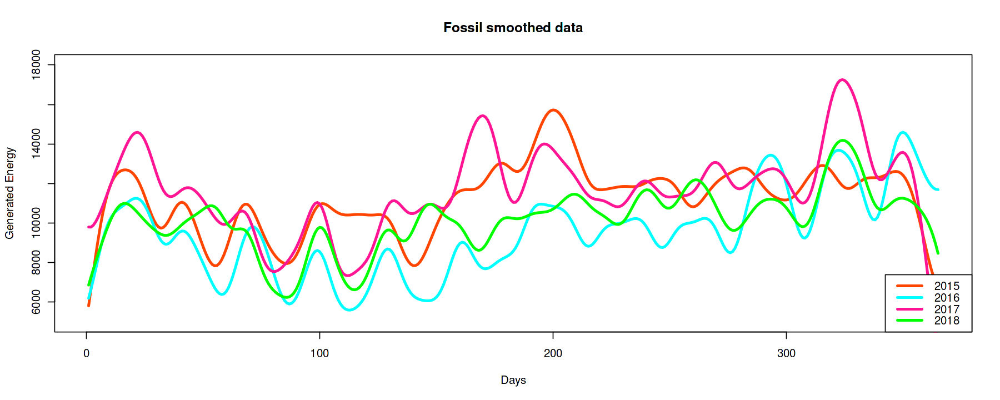

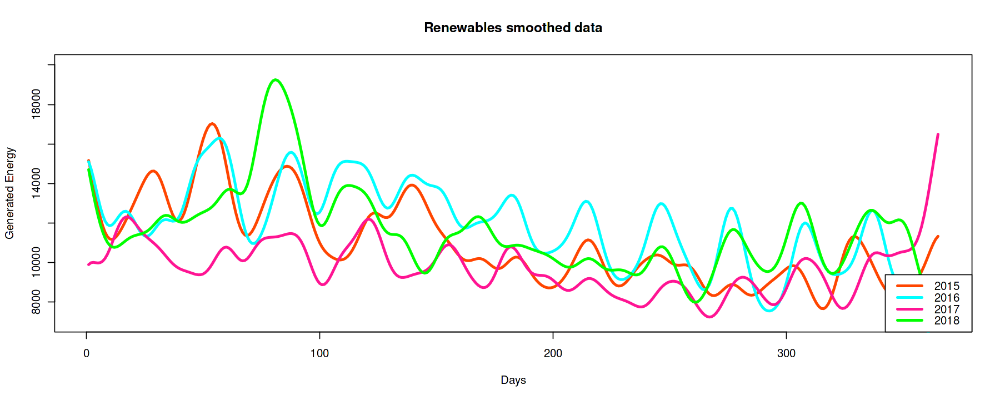

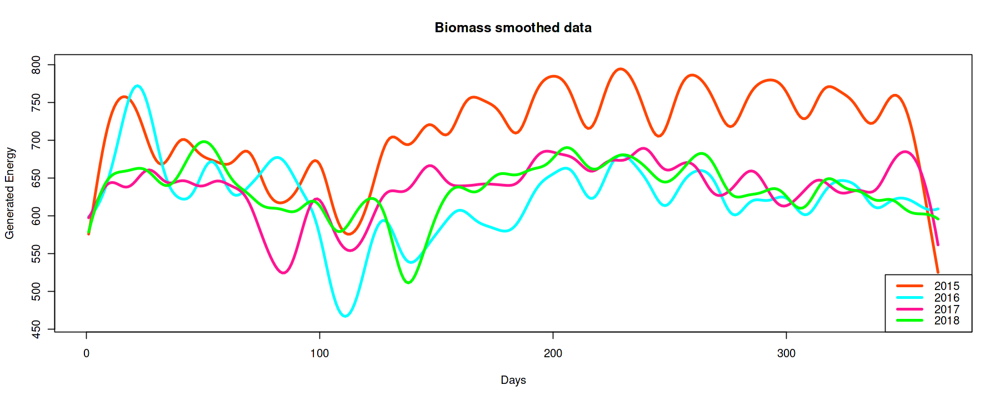

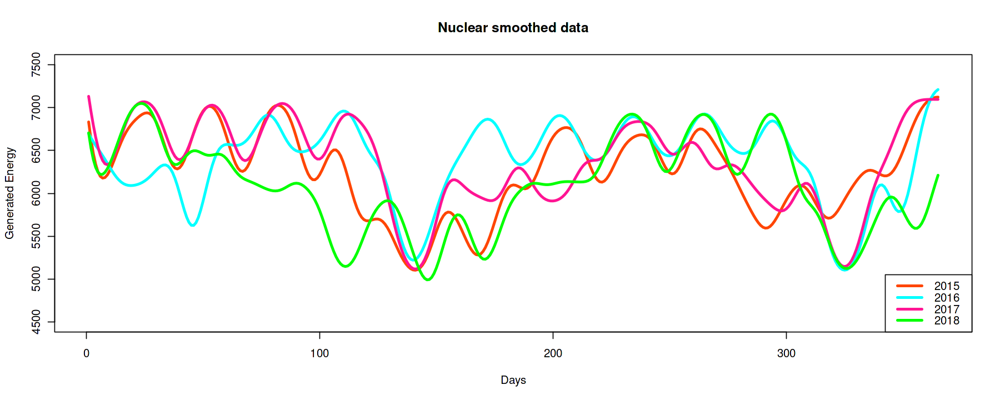

In [49]:
data_2015_d_smoother = daily_data_smoothing(data_2015_d, "2015", smooth_h=5, smooth_ngrid=50, plot='FALSE')
data_2016_d_smoother = daily_data_smoothing(data_2016_d, "2016", smooth_h=5, smooth_ngrid=50, plot='FALSE')
data_2017_d_smoother = daily_data_smoothing(data_2017_d, "2017", smooth_h=5, smooth_ngrid=50, plot='FALSE')
data_2018_d_smoother = daily_data_smoothing(data_2018_d, "2018", smooth_h=5, smooth_ngrid=50, plot='FALSE')

options(repr.plot.width=15, repr.plot.height=6)
par(mfrow=c(1,1))

plot(data_2015_d_smoother$generation.all.fossil, type='l', lwd = 3, ylim=c(5000,18000),
     main='Fossil smoothed data', col='orangered',xlab='Days',ylab='Generated Energy')
lines(data_2016_d_smoother$generation.all.fossil, type='l', col='cyan', lwd = 3)
lines(data_2017_d_smoother$generation.all.fossil, type='l', col='deeppink', lwd = 3)
lines(data_2018_d_smoother$generation.all.fossil, type='l', lwd = 3, col='green')
legend(x='bottomright',legend = c('2015', '2016', '2017','2018'), 
       col = c('orangered','cyan','deeppink','green'), lwd = 3)

plot(data_2015_d_smoother$generation.all.renewables, type='l', lwd = 3, ylim=c(7000,20000), 
     main='Renewables smoothed data', col='orangered',xlab='Days',ylab='Generated Energy')
lines(data_2016_d_smoother$generation.all.renewables, type='l', col='cyan', lwd = 3)
lines(data_2017_d_smoother$generation.all.renewables, type='l', col='deeppink', lwd = 3)
lines(data_2018_d_smoother$generation.all.renewables, type='l', lwd = 3, col='green')
legend(x='bottomright',legend = c('2015', '2016', '2017','2018'), 
       col = c('orangered','cyan','deeppink','green'), lwd = 3)

plot(data_2015_d_smoother$generation.biomass.waste, type='l', lwd = 3, ylim=c(460,800), 
     main='Biomass smoothed data', col='orangered',xlab='Days',ylab='Generated Energy')
lines(data_2016_d_smoother$generation.biomass.waste, type='l', col='cyan', lwd = 3)
lines(data_2017_d_smoother$generation.biomass.waste, type='l', col='deeppink', lwd = 3)
lines(data_2018_d_smoother$generation.biomass.waste, type='l', lwd = 3, col='green')
legend(x='bottomright',legend = c('2015', '2016', '2017','2018'), 
       col = c('orangered','cyan','deeppink','green'), lwd = 3)

plot(data_2015_d_smoother$generation.nuclear, type='l', lwd = 3, ylim=c(4500,7500),  
     main='Nuclear smoothed data', col='orangered',xlab='Days',ylab='Generated Energy')
lines(data_2016_d_smoother$generation.nuclear, type='l', col='cyan', lwd = 3)
lines(data_2017_d_smoother$generation.nuclear, type='l', col='deeppink', lwd = 3)
lines(data_2018_d_smoother$generation.nuclear, type='l', lwd = 3, col='green')
legend(x='bottomright',legend = c('2015', '2016', '2017','2018'), 
       col = c('orangered','cyan','deeppink','green'), lwd = 3)

## Feature correlations

#### Year 2015:
- Biomass.and Fossil correlation: 0.6
- Hydro and Biomass correlation: -0.7
- Renewables and Fossil correlation: -0.8

In [50]:
# Correlation matrix
cor(data_2015_w)

,generation.all.fossil,generation.biomass.waste,generation.nuclear,generation.solar,generation.wind,generation.hydro,generation.all.renewables
generation.all.fossil,1.0000000,0.6271270,-0.1608740,0.2168701,-0.7539117,-0.5665421,-0.7734991
generation.biomass.waste,0.6271270,1.0000000,-0.3068278,0.1636997,-0.3893903,-0.6642159,-0.5391636
generation.nuclear,-0.1608740,-0.3068278,1.0000000,-0.3082539,0.2753349,0.2817220,0.2692738
generation.solar,0.2168701,0.1636997,-0.3082539,1.0000000,-0.3523495,-0.1249236,-0.1361070
generation.wind,-0.7539117,-0.3893903,0.2753349,-0.3523495,1.0000000,0.5109237,0.9171429
generation.hydro,-0.5665421,-0.6642159,0.2817220,-0.1249236,0.5109237,1.0000000,0.7760789
generation.all.renewables,-0.7734991,-0.5391636,0.2692738,-0.1361070,0.9171429,0.7760789,1.0000000


#### Year 2016:
- Biomass and Fossil correlation: 0.5
- Renewables and Fossil correlation: -0.9

In [51]:
# Correlation matrix
cor(data_2016_w)

,generation.all.fossil,generation.biomass.waste,generation.nuclear,generation.solar,generation.wind,generation.hydro,generation.all.renewables
generation.all.fossil,1.0000000,0.44653221,-0.16328094,-0.34501494,-0.57567472,-0.74206526,-0.85907311
generation.biomass.waste,0.4465322,1.00000000,0.01340833,-0.23815531,-0.11545705,-0.35200937,-0.33273197
generation.nuclear,-0.1632809,0.01340833,1.00000000,0.31099780,-0.17819745,-0.15344133,-0.14123512
generation.solar,-0.3450149,-0.23815531,0.31099780,1.00000000,-0.06384843,-0.08785863,0.09248086
generation.wind,-0.5756747,-0.11545705,-0.17819745,-0.06384843,1.00000000,0.38858402,0.80063640
generation.hydro,-0.7420653,-0.35200937,-0.15344133,-0.08785863,0.38858402,1.00000000,0.83666831
generation.all.renewables,-0.8590731,-0.33273197,-0.14123512,0.09248086,0.80063640,0.83666831,1.00000000


#### Year 2017:
- Biomass and Fossil correlation: 0.6
- Renewables and Nuclear correlation: 0.5
- Fossil and Nuclear correlation: -0.5
- Hydro and Biomass correlation: -0.7
- Wind and Solar correlation: -0.6
- Hydro and Biomass correlation: -0.5
- Renewables and Fossil correlation: -0.6

In [52]:
# Correlation matrix
cor(data_2017_w)

,generation.all.fossil,generation.biomass.waste,generation.nuclear,generation.solar,generation.wind,generation.hydro,generation.all.renewables
generation.all.fossil,1.00000000,0.5636567,-0.5067168,0.08435649,-0.4657746,-0.5244111,-0.6018608
generation.biomass.waste,0.56365673,1.0000000,-0.2575751,0.24124954,-0.3309707,-0.5170538,-0.4398842
generation.nuclear,-0.50671684,-0.2575751,1.0000000,-0.39437318,0.4333458,0.5772315,0.5128321
generation.solar,0.08435649,0.2412495,-0.3943732,1.00000000,-0.6332122,-0.4759402,-0.4816345
generation.wind,-0.46577455,-0.3309707,0.4333458,-0.63321224,1.0000000,0.5476404,0.9285967
generation.hydro,-0.52441105,-0.5170538,0.5772315,-0.47594023,0.5476404,1.0000000,0.7682238
generation.all.renewables,-0.60186076,-0.4398842,0.5128321,-0.48163454,0.9285967,0.7682238,1.0000000


#### Year 2018:
- Biomass and Fossil correlation: 0.5
- Nuclear and Biomass.Waste correlation: 0.5
- Renewables and Fossil correlation: -0.7
- Hydro and Biomass.Waste correlation: -0.5
- Hydro and Nuclear correlation: -0.5

In [53]:
# Correlation matrix
cor(data_2018_w)

,generation.all.fossil,generation.biomass.waste,generation.nuclear,generation.solar,generation.wind,generation.hydro,generation.all.renewables
generation.all.fossil,1.0000000,0.48321515,0.15116421,-0.27823723,-0.44419207,-0.68693975,-0.71154234
generation.biomass.waste,0.4832152,1.00000000,0.49786062,0.04639969,-0.17690022,-0.44737673,-0.33801358
generation.nuclear,0.1511642,0.49786062,1.00000000,-0.02920836,0.09201088,-0.52401561,-0.19433196
generation.solar,-0.2782372,0.04639969,-0.02920836,1.00000000,-0.36414712,0.09852641,-0.02460193
generation.wind,-0.4441921,-0.17690022,0.09201088,-0.36414712,1.00000000,0.39447659,0.84948887
generation.hydro,-0.6869397,-0.44737673,-0.52401561,0.09852641,0.39447659,1.00000000,0.79357838
generation.all.renewables,-0.7115423,-0.33801358,-0.19433196,-0.02460193,0.84948887,0.79357838,1.00000000


## (Un)balanced Competition Regime Change Diachronic Model (UCRCD)

In [54]:
UCRCD_v2 <- function(sales1, sales2, display=T, alpha=0.05,
                     delta=0.01, gamma=0.01, par="unique",
                     col1='blue', col2='green', xlabel='time', lab1='source1', lab2='source2', yrange=c(0,20000), save=F,
                     m1 =BM(sales1,display = F)$Estimate[1,1],
                     m2 =BM(sales2,display = F)$Estimate[1,1],
                     p1c=BM(sales1,display = F)$Estimate[2,1],
                     q1c=BM(sales1,display = F)$Estimate[3,1],
                     p2c=BM(sales2,display = F)$Estimate[2,1],
                     q2c=BM(sales2,display = F)$Estimate[3,1])
{
  c2i <- length(sales1) - length(sales2) 
  c2 = c2i+1
  
  tot<-c(sales1,sales2)
  data1<-cumsum(sales1)
  data2<-cumsum(sales2)
  end <-length(sales1)
  
  if (c2i > 0){
    step <- c2i
    s1 <- sales1[1:step]
    sales1 <- sales1[(c2):end]
    t <- c(1:step)
    s2 <- c(rep(0,step))
    Z1 <- cumsum(s1)
    Z2 <- cumsum(s2)
    
    BMs1<-BM(s1,display = F)
    model1<-BMs1$model
    m1 <-BMs1$Estimate[1,1]
    p1a<-BMs1$Estimate[2,1]
    q1a<-BMs1$Estimate[3,1]
    
    m1_ <-BMs1$Estimate[1,]
    p1a_<-BMs1$Estimate[2,]
    q1a_<-BMs1$Estimate[3,]
    
    pred_BM1<-fitted(BMs1)
    
    o_bass<-matrix()
    o_bass <- cbind(t, s1, s2, Z1, Z2)
    p_bass <- matrix()
    p_bass <- cbind(t, pred_BM1, s2)
    o_bass<-as.data.frame(o_bass)
    p_bass<-as.data.frame(p_bass)
    colnames(o_bass)<-c("t","s1","s2", "Z1", "Z2")
    colnames(p_bass)<-c("t","pred_1","pred_2")
  }
  
  
  
  #######################################################
  if(par=="unique"){
    parms<-list(mc=(m1+m2)*2,
                p1c=p1c,
                p2c=p2c,
                q1c=q1c,
                q2c=q2c,
                delta=delta)
    
    t <- seq(c2, end, by = 1)
    
    Z1 <- cumsum(sales1)
    Z2 <- cumsum(sales2)
    data<-matrix()
    data<-cbind(t, sales1, sales2, Z1, Z2)
    data<-as.data.frame(data)
    colnames(data)<-c("t","s1","s2", "Z1", "Z2")
    expdf=reshape2::melt(data[1:3],id.var="t",variable.name="product",value.name="response")
    
    model<-function(t,parms){
      Z=Z1+Z2
      mc=parms$mc
      p1c=parms$p1c
      p2c=parms$p2c
      q1c=parms$q1c
      q2c=parms$q2c
      delta=parms$delta
      z1 = mc*( p1c+(q1c+delta)*Z1/mc + q1c*Z2/mc ) * (1-Z/mc)
      z2 = mc*( p2c+(q2c-delta)*Z1/mc + q2c*Z2/mc ) * (1-Z/mc)
      return(list(z1=z1,z2=z2,t=t))
    }
    
    res.model<-function(parms) {
      stime=model(t=t,parms)
      data<-data.frame(t=stime$t, z1.s=stime$z1, z2.s=stime$z2)
      preddf=reshape2::melt(data,id.var="t",variable.name="product",value.name="response")
      residui<-preddf$response-expdf$response
      return (residui)
    }
    
    fitval1=nls.lm(par=parms,fn=res.model, control=nls.lm.control(maxiter=1000,maxfev=10000))
    summary <- summary(fitval1)
    sssss<-signif(summary$coefficients, digits = 3)
    aa <- data.frame(summary$coefficients[, c(1, 2)], 0, 0,0)
    for (i in 1:NROW(aa)) {
      aa[i, c(3, 4)] <- aa[i, 1] + c(-1, 1) * qnorm(1 -
                                                      alpha/2) * aa[i, 2]
    }
    aa[, 5] <- sssss[, 4]
    names(aa) <- c("Estimate", "Std.Error", "Lower", "Upper",
                   "p-value")
    
    parest=as.list(coef(fitval1))
    mc=parest$mc
    p1c=parest$p1c
    q1c=parest$q1c
    p2c=parest$p2c
    q2c=parest$q2c
    delta=parest$delta
    
    if(c2i > 0){
      Estimate<-c(m1,p1a,q1a,mc,p1c,q1c+delta,q1c,p2c,q2c,q2c-delta)
      names(Estimate)<-c("m1","p1a","q1a","mc","p1c","q1c+delta","q1c","p2c",
                         "q2c","q2c-delta")
      
      Estimate1<-rbind(m1_, p1a_, q1a_, aa)
      stime=model(t=t,parest)
      z_prime<-data.frame(t=stime$t, pred_1=stime$z1, pred_2=stime$z2)
      
      
      data$t <- c(c2:end)
      data_o<-matrix()
      data_o <- rbind(o_bass, data)
      data <- data_o
      z_prime$t <- c(c2:end)
      data_p <- matrix()
      data_p <- rbind(p_bass, z_prime)
      z_prime <- data_p
    }
    
    if(c2i == 0){
      Estimate<-c(mc,p1c,q1c+delta,q1c,p2c,q2c,q2c-delta)
      names(Estimate)<-c("mc","p1c","q1c+delta","q1c","p2c",
                         "q2c","q2c-gamma")
      Estimate1<-aa
      stime=model(t=t,parest)
      z_prime<-data.frame(t=stime$t, pred_1=stime$z1, pred_2=stime$z2)
      
      data$t <- c(c2:end)
      z_prime$t <- c(c2:end)
    }
    
    oss=reshape2::melt(data[,c(1:3)],id.var=c("t"),variable.name="product",value.name="consumption")
    pred=reshape2::melt(z_prime,id.var=c("t"),variable.name="product",value.name="consumption")
    res=oss$consumption-pred$consumption
  }
  
  ##################################################################################
  
  if(par=="double"){
    parms<-list(mc=(m1+m2)*2,
                p1c=p1c,
                p2c=p2c,
                q1c=q1c,
                q2c=q2c,
                delta=delta,
                gamma=gamma)
    
    t <- seq(c2, end, by = 1)
    
    Z1 <- cumsum(sales1)
    Z2 <- cumsum(sales2)
    data<-matrix()
    data<-cbind(t, sales1, sales2, Z1, Z2)
    data<-as.data.frame(data)
    colnames(data)<-c("t","s1","s2", "Z1", "Z2")
    expdf=reshape2::melt(data[1:3],id.var="t",variable.name="product",value.name="response")
    
    model<-function(t,parms){
      Z=Z1+Z2
      mc=parms$mc
      p1c=parms$p1c
      p2c=parms$p2c
      q1c=parms$q1c
      q2c=parms$q2c
      delta=parms$delta
      gamma=parms$gamma
      z1 = mc*( p1c+(q1c+delta)*Z1/mc + q1c*Z2/mc ) * (1-Z/mc)
      z2 = mc*( p2c+(q2c-gamma)*Z1/mc + q2c*Z2/mc ) * (1-Z/mc)
      return(list(z1=z1,z2=z2,t=t))
    }
    
    res.model<-function(parms) {
      stime=model(t=t,parms)
      data<-data.frame(t=stime$t, z1.s=stime$z1, z2.s=stime$z2)
      preddf=reshape2::melt(data,id.var="t",variable.name="product",value.name="response")
      residui<-preddf$response-expdf$response
      return (residui)
    }
    
    fitval1=nls.lm(par=parms,fn=res.model, control=nls.lm.control(maxiter=1000,maxfev=10000))
    summary <- summary(fitval1)
    sssss<-signif(summary$coefficients, digits = 3)
    aa <- data.frame(summary$coefficients[, c(1, 2)], 0, 0,0)
    for (i in 1:NROW(aa)) {
      aa[i, c(3, 4)] <- aa[i, 1] + c(-1, 1) * qnorm(1 -
                                                      alpha/2) * aa[i, 2]
    }
    aa[, 5] <- sssss[, 4]
    names(aa) <- c("Estimate", "Std.Error", "Lower", "Upper",
                   "p-value")
    
    parest=as.list(coef(fitval1))
    mc=parest$mc
    p1c=parest$p1c
    q1c=parest$q1c
    p2c=parest$p2c
    q2c=parest$q2c
    delta=parest$delta
    gamma=parest$gamma
    
    if(c2i > 0){
      Estimate<-c(m1,p1a,q1a,mc,p1c,q1c+delta,q1c,p2c,q2c,q2c-gamma)
      names(Estimate)<-c("m1","p1a","q1a","mc","p1c","q1c+delta","q1c","p2c",
                         "q2c","q2c-gamma")
      Estimate1<-rbind(m1_, p1a_, q1a_, aa)
      stime=model(t=t,parest)
      z_prime<-data.frame(t=stime$t, pred_1=stime$z1, pred_2=stime$z2)
      
      data$t <- c(c2:end)
      data_o<-matrix()
      data_o <- rbind(o_bass, data)
      data <- data_o
      z_prime$t <- c(c2:end)
      data_p <- matrix()
      data_p <- rbind(p_bass, z_prime)
      z_prime <- data_p
    }
    
    if(c2i == 0){
      Estimate<-c(mc,p1c,q1c+delta,q1c,p2c,q2c,q2c-gamma)
      names(Estimate)<-c("mc","p1c","q1c+delta","q1c","p2c",
                         "q2c","q2c-gamma")
      Estimate1<-aa
      stime=model(t=t,parest)
      z_prime<-data.frame(t=stime$t, pred_1=stime$z1, pred_2=stime$z2)
      
      data$t <- c(c2:end)
      z_prime$t <- c(c2:end)
    }
    
    oss=reshape2::melt(data[,c(1:3)],id.var=c("t"),variable.name="product",value.name="consumption")
    pred=reshape2::melt(z_prime,id.var=c("t"),variable.name="product",value.name="consumption")
    res=oss$consumption-pred$consumption
  }
  
  ################################################
  
  if(c2i > 0){
    data<-list(oss$consumption[1:end],oss$consumption[(end+c2):(2*end)] )
    fitted<-list(pred$consumption[1:end],pred$consumption[(end+c2):(2*end)] )
    residu<-list(oss$consumption[1:end]-pred$consumption[1:end],
                 oss$consumption[(end+c2):(2*end)]-pred$consumption[(end+c2):(2*end)] )
    
    Rrres <- c(oss$consumption[1:end]-pred$consumption[1:end],
               oss$consumption[(end+c2):(2*end)]-pred$consumption[(end+c2):(2*end)] )
    
    Description <- c("Market Potential 1 stand-alone","Innovation coefficient 1 stand-alone",
                     "Imitation coefficient 1 stand-alone","Market Potential 1 competition",
                     "Innovation coefficient 1 competition","Within-product wom 1 competition",
                     "Cross-product wom 1 competition","Innovation coefficient 2 competition",
                     "Within-product wom 2 competition", "Cross-product wom 2 competition")
  }
  
  if(c2i==0){
    data<-list(oss$consumption[1:end],oss$consumption[(end+c2):(2*end)] )
    fitted<-list(pred$consumption[1:end],pred$consumption[(end+c2):(2*end)] )
    residu<-list(oss$consumption[1:end]-pred$consumption[1:end],
                 oss$consumption[(end+c2):(2*end)]-pred$consumption[(end+c2):(2*end)] )
    
    Rrres <- c(oss$consumption[1:end]-pred$consumption[1:end],
               oss$consumption[(end+c2):(2*end)]-pred$consumption[(end+c2):(2*end)] )
    
    Description <- c("Market Potential 1 competition",
                     "Innovation coefficient 1 competition","Within-product wom 1 competition",
                     "Cross-product wom 1 competition","Innovation coefficient 2 competition",
                     "Within-product wom 2 competition", "Cross-product wom 2 competition")
  }
  
  parameters<-matrix()
  parameters<-cbind(Estimate, Description)
  parameters<-as.data.frame(parameters)
  
  cum<-c(data1,data2)
  pred_c1<-cumsum(pred$consumption[1:end])
  pred_c2<-cumsum(pred$consumption[(end+c2):(2*end)])
  cum_pred<-c(pred_c1,pred_c2)
  tss <- sum((cum - mean(cum))^2)
  rss <- sum((cum - cum_pred)^2)
  r.squared <- 1 - rss/tss
  r.squared.adj <- 1 - ((1 - r.squared) * ((2*end-c2) - 1))/((2*end-c2)-1-NROW(aa))
  
  ss1 <- oss$consumption[1:end]
  ss2 <- oss$consumption[(end+c2):(2*end)]
  cc1 <- cumsum(ss1)
  cc2 <- cumsum(ss2)
  
  pp1 <- pred$consumption[1:end]
  pp2 <- pred$consumption[(end+c2):(2*end)]
  gg1 <- cumsum(pp1)
  gg2 <- cumsum(pp2)
  
  t <- c(1:end)
  t2 <- c(c2:end)
  
  if(display==T){
    if(save==T){
        png(paste(lab1,lab2,'.png',sep=''), width = 1300, height = 800)
    }
    M <- max(ss1,ss2,pp1,pp2)
    MM <- M*1.30
    plot(t,ss1,main = paste(lab1, "and",lab2, sep=" "), type = "l", lwd=8, ylab = "Generated energy", xlab = xlabel,ylim = yrange, col=alpha(col1, 0.3)) 
    lines(t, pp1, col = col1, lwd = 4)
    lines(t2, ss2, type = "l",lwd=8, col=alpha(col2, 0.3))
    lines(t2, pp2,col = col2, lwd = 4)
    legend(x='bottomright',legend = c(lab1, paste('Fitted', lab1,sep=" "),lab2,paste('Fitted', lab2,sep=" ")), 
       col = c(alpha(col1, 0.3),col1,alpha(col2, 0.3),col2), lwd = c(6,2,6,2))
    if(save==T){
        dev.off()
    }
  }
  
  cl <- match.call()
  ao <- list(model=model, type="UCRCD Model",Estimate = Estimate1, Rsquared = r.squared,
             RsquaredAdj = r.squared.adj,
             residuals = residu, fitted=fitted,RSS=rss, Res_tot=Rrres,
             coefficients=parameters,data=data, call=cl)
  class(ao) <- "Dimora"
  invisible(ao)
}

#### 2015: Renewables - Fossil

Call: ( UCRCD Model )

  UCRCD_v2(sales1 = data_2015_d_smooth$generation.all.fossil, sales2 = data_2015_d_smooth$generation.all.renewables, 
    display = T, col1 = "lightcoral", col2 = "chartreuse3", xlabel = "days", 
    lab1 = "Fossil", lab2 = "Renewables")

Residuals Series 1:
 Length  Class   Mode 
     0   NULL   NULL 

Residuals Series 2:
 Length  Class   Mode 
     0   NULL   NULL 

Coefficients:
            Estimate    Std.Error         Lower        Upper  p-value    
mc     2.461422e+07 6.705229e+06  1.147221e+07 3.775623e+07 0.000259 ***
p1c    3.852855e-04 9.865287e-05  1.919294e-04 5.786415e-04 0.000103 ***
p2c    5.647094e-04 1.488625e-04  2.729442e-04 8.564745e-04 0.000161 ***
q1c    1.103468e-03 5.533709e-04  1.888098e-05 2.188055e-03 0.046500   *
q2c   -2.525208e-04 7.374071e-04 -1.697812e-03 1.192771e-03 0.732000    
delta -1.293397e-04 1.227319e-03 -2.534840e-03 2.276161e-03 0.916000    
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual s

,Estimate,Description
,<chr>,<chr>
mc,24614221.874376,Market Potential 1 competition
p1c,0.00038528547737017,Innovation coefficient 1 competition
q1c+delta,0.000974128363190077,Within-product wom 1 competition
q1c,0.00110346802736114,Cross-product wom 1 competition
p2c,0.000564709358334365,Innovation coefficient 2 competition
q2c,-0.000252520820135743,Within-product wom 2 competition
q2c-gamma,-0.000123181155964681,Cross-product wom 2 competition


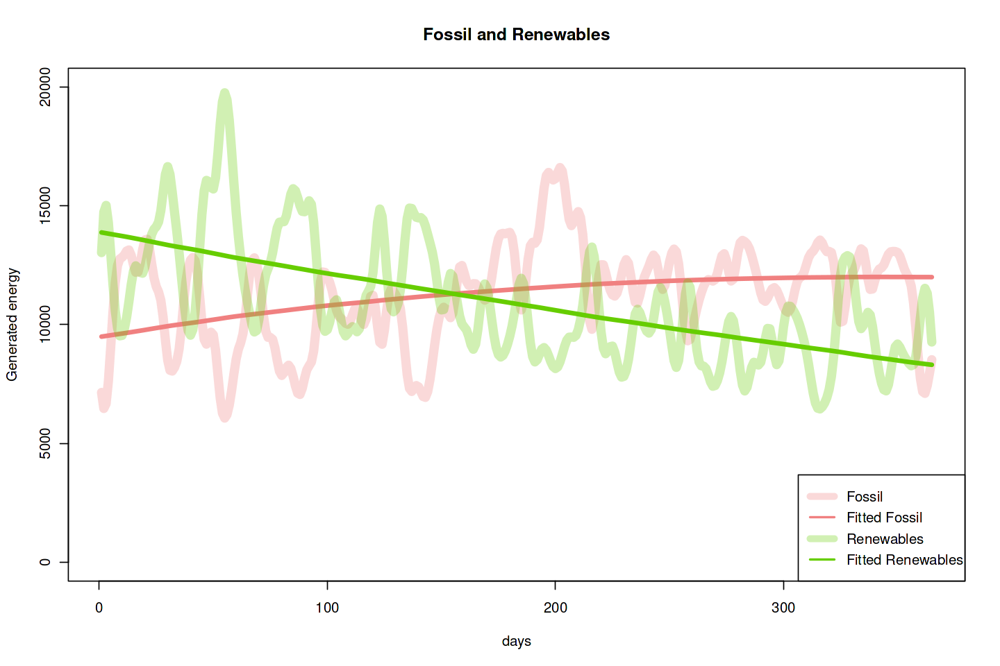

In [55]:
options(repr.plot.width=12, repr.plot.height=8)
par(mfrow=c(1,1))

m = UCRCD_v2(data_2015_d_smooth$generation.all.fossil, data_2015_d_smooth$generation.all.renewables,
            display=T, col1='lightcoral', col2 = 'chartreuse3', xlabel='days', lab1='Fossil',lab2='Renewables')
summary(m)
coef(m)

#### 2015: Biomass - Fossil

Call: ( UCRCD Model )

  UCRCD_v2(sales1 = data_2015_d_smooth$generation.all.fossil, sales2 = data_2015_d_smooth$generation.biomass.waste, 
    display = T, col1 = "lightcoral", col2 = "lightseagreen", 
    xlabel = "days", lab1 = "Fossil", lab2 = "Biomass")

Residuals Series 1:
 Length  Class   Mode 
     0   NULL   NULL 

Residuals Series 2:
 Length  Class   Mode 
     0   NULL   NULL 

Coefficients:
            Estimate    Std.Error         Lower         Upper  p-value    
mc     8.720727e+06 5.478880e+05  7.646886e+06  9.794568e+06 3.90e-49 ***
p1c    1.061175e-03 5.751756e-05  9.484426e-04  1.173907e-03 1.36e-62 ***
p2c    4.031308e-05 2.031207e-05  5.021588e-07  8.012399e-05 4.76e-02   *
q1c   -1.025701e-01 3.542774e-02 -1.720072e-01 -3.313300e-02 3.90e-03  **
q2c    1.058807e-01 3.556078e-02  3.618290e-02  1.755786e-01 3.00e-03  **
delta  1.124033e-01 3.780682e-02  3.830324e-02  1.865033e-01 3.05e-03  **
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Resid

,Estimate,Description
,<chr>,<chr>
mc,8720726.85159267,Market Potential 1 competition
p1c,0.00106117493786391,Innovation coefficient 1 competition
q1c+delta,0.00983316733290229,Within-product wom 1 competition
q1c,-0.102570084544763,Cross-product wom 1 competition
p2c,4.03130750888722e-05,Innovation coefficient 2 competition
q2c,0.105880743938999,Within-product wom 2 competition
q2c-gamma,-0.00652250793866604,Cross-product wom 2 competition


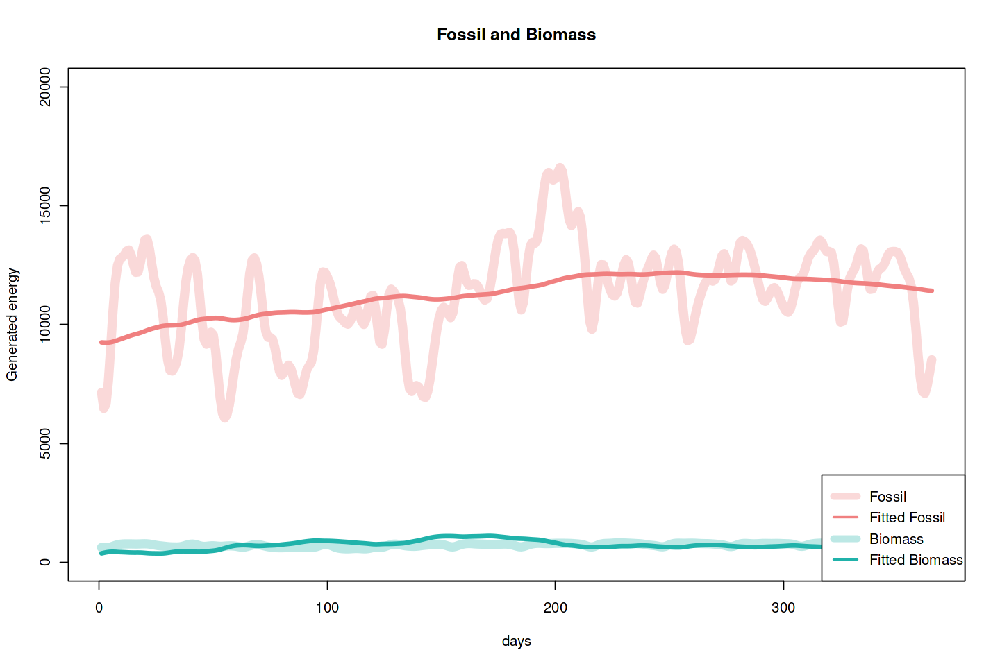

In [56]:
options(repr.plot.width=12, repr.plot.height=8)
par(mfrow=c(1,1))

m = UCRCD_v2(data_2015_d_smooth$generation.all.fossil, data_2015_d_smooth$generation.biomass.waste,
            display=T, col1='lightcoral', col2 = 'lightseagreen', xlabel='days', lab1='Fossil',lab2='Biomass')
summary(m)
coef(m)

#### 2017: Solar - Biomass

Call: ( UCRCD Model )

  UCRCD_v2(sales1 = data_2017_d_smooth$generation.solar, sales2 = data_2017_d_smooth$generation.biomass.waste, 
    display = T, col1 = "orange", col2 = "lightseagreen", xlabel = "days", 
    lab1 = "Solar", lab2 = "Biomass", yrange = c(0, 3000))

Residuals Series 1:
 Length  Class   Mode 
     0   NULL   NULL 

Residuals Series 2:
 Length  Class   Mode 
     0   NULL   NULL 

Coefficients:
           Estimate    Std.Error         Lower        Upper  p-value    
mc    9.454616e+05 1.167757e+04  9.225740e+05 9.683492e+05 0.00e+00 ***
p1c   9.783140e-04 4.917078e-05  8.819411e-04 1.074687e-03 1.33e-70 ***
p2c   4.349508e-04 4.931151e-05  3.383020e-04 5.315996e-04 8.44e-18 ***
q1c   5.146401e-04 3.568377e-03 -6.479250e-03 7.508530e-03 8.85e-01    
q2c   7.419343e-03 3.591988e-03  3.791749e-04 1.445951e-02 3.92e-02   *
delta 7.430208e-03 4.990360e-03 -2.350718e-03 1.721113e-02 1.37e-01    
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual

,Estimate,Description
,<chr>,<chr>
mc,945461.621043836,Market Potential 1 competition
p1c,0.000978314010862854,Innovation coefficient 1 competition
q1c+delta,0.00794484813739177,Within-product wom 1 competition
q1c,0.000514640093837536,Cross-product wom 1 competition
p2c,0.000434950829682424,Innovation coefficient 2 competition
q2c,0.00741934275746402,Within-product wom 2 competition
q2c-gamma,-1.08652860902076e-05,Cross-product wom 2 competition


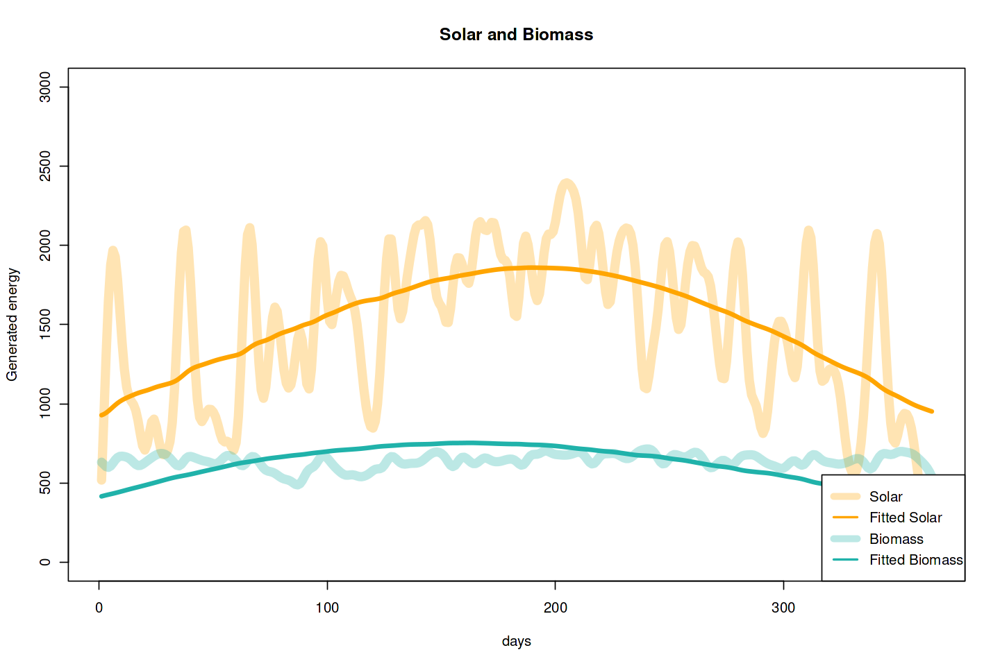

In [57]:
m = UCRCD_v2(data_2017_d_smooth$generation.solar, data_2017_d_smooth$generation.biomass.waste,
            display=T, col1='orange', col2 = 'lightseagreen', xlabel='days', lab1='Solar',lab2='Biomass', yrange=c(0,3000))
summary(m)
coef(m)

#### 2018: Fossil - Nuclear

Call: ( UCRCD Model )

  UCRCD_v2(sales1 = data_2018_d_smooth$generation.all.fossil, sales2 = data_2018_d_smooth$generation.nuclear, 
    display = T, col1 = "lightcoral", col2 = "deeppink", xlabel = "days", 
    lab1 = "Fossil", lab2 = "Nuclear")

Residuals Series 1:
 Length  Class   Mode 
     0   NULL   NULL 

Residuals Series 2:
 Length  Class   Mode 
     0   NULL   NULL 

Coefficients:
            Estimate    Std.Error         Lower        Upper p-value  
mc     8.179421e+09 4.893261e+12 -9.582437e+12 9.598796e+12   0.999  
p1c    1.085822e-06 6.520326e-04 -1.276875e-03 1.279046e-03   0.999  
p2c    7.400056e-07 4.443687e-04 -8.702066e-04 8.716866e-04   0.999  
q1c   -2.219608e-03 2.061115e-03 -6.259319e-03 1.820104e-03   0.282  
q2c    2.667790e-03 3.016130e-03 -3.243717e-03 8.579296e-03   0.377  
delta  4.341304e-03 4.266502e-03 -4.020887e-03 1.270349e-02   0.309  
---
 Signif. codes:  0 '***' 0.001 '**' 0.01 '*' 0.05 '.' 0.1 ' ' 1

 Residual standard error Series 1: 0  on  -6 

,Estimate,Description
,<chr>,<chr>
mc,8179421185.43834,Market Potential 1 competition
p1c,1.08582222844902e-06,Innovation coefficient 1 competition
q1c+delta,0.00212169610759511,Within-product wom 1 competition
q1c,-0.00221960752996452,Cross-product wom 1 competition
p2c,7.40005592585413e-07,Innovation coefficient 2 competition
q2c,0.00266778958734346,Within-product wom 2 competition
q2c-gamma,-0.00167351405021617,Cross-product wom 2 competition


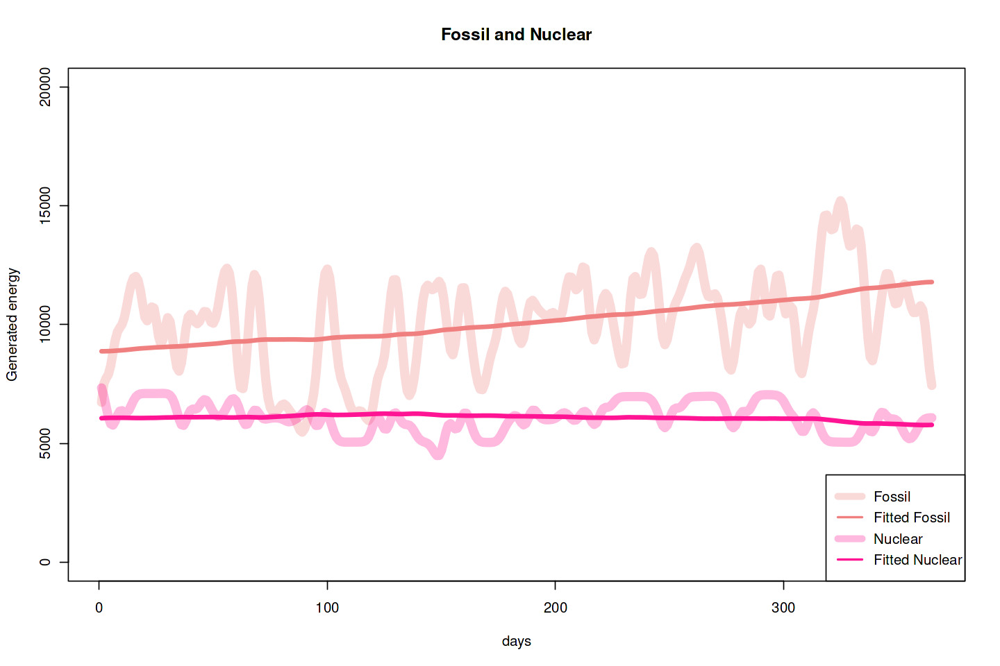

In [58]:
m = UCRCD_v2(data_2018_d_smooth$generation.all.fossil, data_2018_d_smooth$generation.nuclear,
            display=T, col1='lightcoral', col2 = 'deeppink', xlabel='days', lab1='Fossil',lab2='Nuclear')
summary(m)
coef(m)

# ➡️ Energy price forecasting

We will consider the following approaches for forecasting: Linear Models, Gradient-Boost Models (GBOOST), Simple Exponential Smoothing (SES) and Holt Smoothing, ARIMA Models.

#### Definition of the datasets and the target

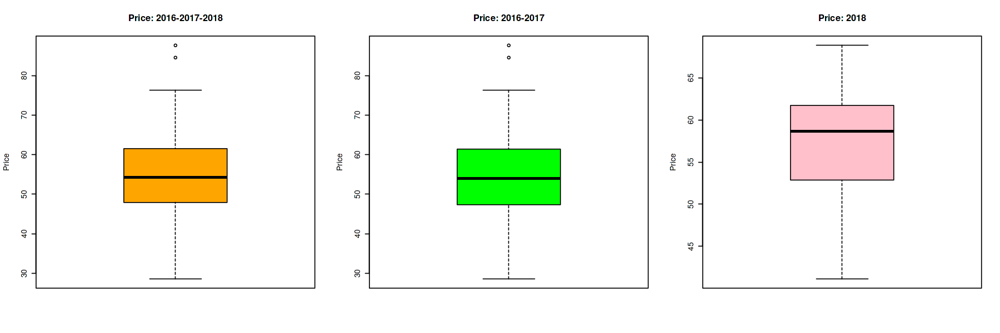

In [130]:
# Weekly data
df_weeks_mean = aggregate(subset(df, select=-c(dates, hours, weeks)),
                         by=list(week=df$week), FUN=mean)
df_weeks_mean$week<-as.numeric(df_weeks_mean$week)

price <- df_weeks_mean$price.actual
price_16_17_18 <- price[52:182]
price_16_17 <- price[52:156]
price_18 <- price[156:182]

options(repr.plot.width=15, repr.plot.height=5)
par(mfrow=c(1,3))

boxplot(price_16_17_18, col="orange", main="Price: 2016-2017-2018", ylab="Price")
boxplot(price_16_17, col="green", main="Price: 2016-2017", ylab="Price")
boxplot(price_18, col="pink", main="Price: 2018", ylab="Price")

In [131]:
df_train<-df_weeks_mean[52:156, 2:17] # train on 2016 + 2017 data
df_test<-df_weeks_mean[156:182, 2:17] # test on 2018 data (first 6 moths)

## Linear Model


Call:
lm(formula = price.actual ~ ., data = df_train)

Residuals:
     Min       1Q   Median       3Q      Max 
-20.4956  -2.9739   0.0663   3.1123  20.9144 

Coefficients:
                                              Estimate Std. Error t value
(Intercept)                                 -2.082e+01  2.802e+01  -0.743
generation.biomass                          -2.582e-04  2.941e-02  -0.009
generation.fossil.brown.coal.lignite         7.698e-03  7.546e-03   1.020
generation.fossil.gas                        1.680e-03  1.277e-03   1.316
generation.fossil.hard.coal                  2.967e-03  1.672e-03   1.774
generation.fossil.oil                        2.098e-02  5.718e-02   0.367
generation.hydro.pumped.storage.consumption  2.240e-03  6.645e-03   0.337
generation.hydro.run.of.river.and.poundage  -4.572e-03  6.382e-03  -0.716
generation.hydro.water.reservoir             1.353e-03  1.721e-03   0.786
generation.nuclear                           3.059e-03  1.884e-03   1.624
generation.o


	Breusch-Godfrey test for serial correlation of order up to 19

data:  Residuals
LM test = 53.869, df = 19, p-value = 3.458e-05



	Durbin-Watson test

data:  linear_model
DW = 1.402, p-value = 7.784e-05
alternative hypothesis: true autocorrelation is greater than 0


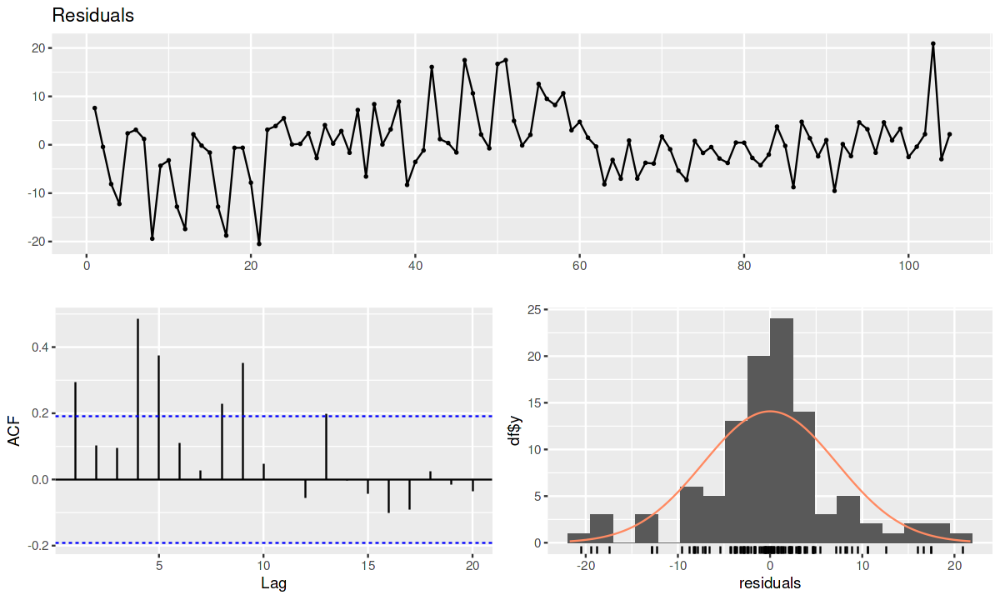

In [61]:
options(repr.plot.width=10, repr.plot.height=6)
par(mfrow=c(1,2))

linear_model <- lm(price.actual~., data=df_train)
summary(linear_model)
checkresiduals(linear_model)
dwtest(linear_model)

Start:  AIC=446.83
price.actual ~ generation.biomass + generation.fossil.brown.coal.lignite + 
    generation.fossil.gas + generation.fossil.hard.coal + generation.fossil.oil + 
    generation.hydro.pumped.storage.consumption + generation.hydro.run.of.river.and.poundage + 
    generation.hydro.water.reservoir + generation.nuclear + generation.other + 
    generation.other.renewable + generation.solar + generation.waste + 
    generation.wind.onshore + total.load.actual

                                              Df Sum of Sq    RSS    AIC
- generation.biomass                           1      0.00 5457.6 444.83
- generation.other                             1      0.84 5458.5 444.85
- generation.hydro.pumped.storage.consumption  1      6.97 5464.6 444.97
- generation.fossil.oil                        1      8.26 5465.9 444.99
- generation.solar                             1      9.56 5467.2 445.02
- generation.hydro.run.of.river.and.poundage   1     31.47 5489.1 445.44
- generation.w


Call:
lm(formula = price.actual ~ generation.fossil.brown.coal.lignite + 
    generation.fossil.gas + generation.fossil.hard.coal + generation.nuclear + 
    generation.other.renewable + generation.waste + generation.wind.onshore + 
    total.load.actual, data = df_train)

Residuals:
     Min       1Q   Median       3Q      Max 
-20.7986  -3.2150  -0.0159   3.1817  20.7583 

Coefficients:
                                       Estimate Std. Error t value Pr(>|t|)    
(Intercept)                          -9.6207061 21.8690386  -0.440  0.66098    
generation.fossil.brown.coal.lignite  0.0100504  0.0064408   1.560  0.12195    
generation.fossil.gas                 0.0019106  0.0009070   2.107  0.03775 *  
generation.fossil.hard.coal           0.0031825  0.0012086   2.633  0.00986 ** 
generation.nuclear                    0.0035328  0.0015468   2.284  0.02458 *  
generation.other.renewable            0.5842663  0.1309859   4.461 2.22e-05 ***
generation.waste                     -0.0689305


	Breusch-Godfrey test for serial correlation of order up to 12

data:  Residuals
LM test = 48.109, df = 12, p-value = 2.992e-06



	Durbin-Watson test

data:  best_AIC_linear_model
DW = 1.3909, p-value = 0.0002268
alternative hypothesis: true autocorrelation is greater than 0


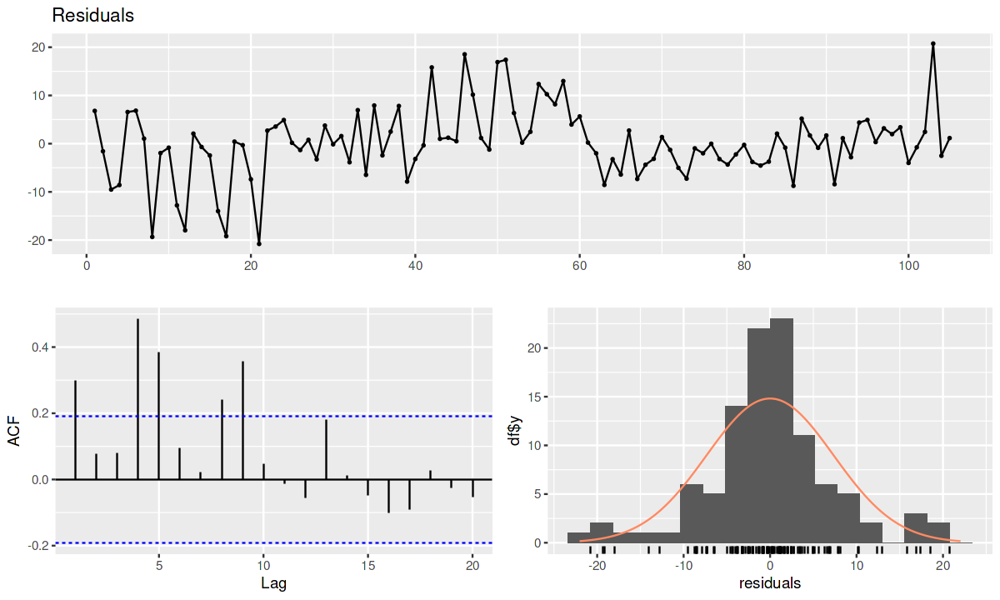

In [62]:
# Choose a model by AIC in a Stepwise Algorithm

options(repr.plot.width=10, repr.plot.height=6)
par(mfrow=c(1,2))

best_AIC_linear_model <- step(linear_model, direction="both")
summary(best_AIC_linear_model)
checkresiduals(best_AIC_linear_model)
dwtest(best_AIC_linear_model)

In [63]:
# AIC comparison:
AIC(linear_model)
AIC(best_AIC_linear_model)

[1] 746.8117

[1] 735.6961

#### Correlation between target and predictors


	Pearson's product-moment correlation

data:  df_train$price.actual and df_train$generation.other.renewable
t = 8.4245, df = 103, p-value = 2.29e-13
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.5094051 0.7398087
sample estimates:
      cor 
0.6387097 


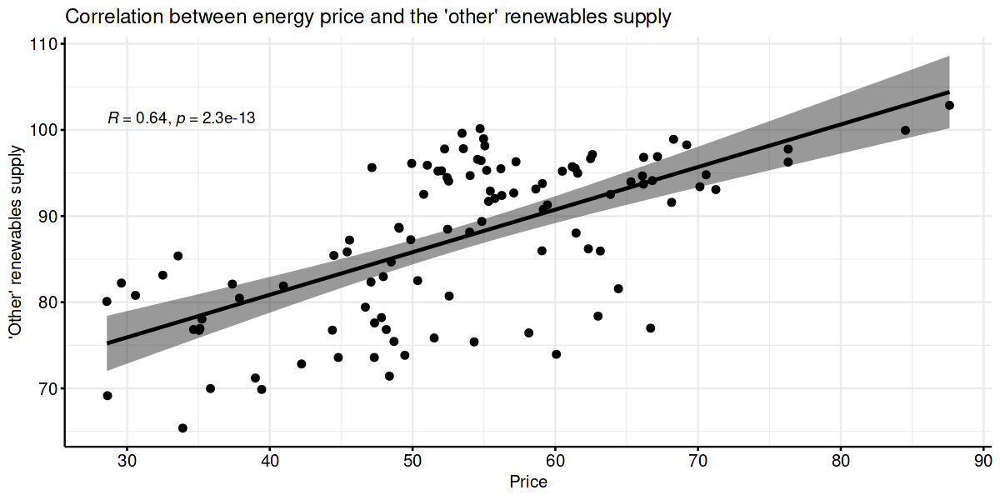

In [64]:
# Correlation with the most significant variable: 
# renewables supply other than solar, wind.onshore, hydro.water.reservoir,
# hydro.run.of.river.and.poundage and hydro.pumped.storage.consumption.

options(repr.plot.width=10, repr.plot.height=5)
par(mfrow=c(1,1))

ggscatter(df_train, x = "price.actual", y = "generation.other.renewable", title='Correlation between energy price and the \'other\' renewables supply',
          add = "reg.line", conf.int = TRUE, 
          cor.coef = TRUE, cor.method = "pearson",
          xlab = "Price", ylab = "\'Other\' renewables supply")+ grids()

res <- cor.test(df_train$price.actual, df_train$generation.other.renewable, 
                    method = "pearson")
res


	Pearson's product-moment correlation

data:  df_train$price.actual and df_train$generation.waste
t = 5.6279, df = 103, p-value = 1.582e-07
alternative hypothesis: true correlation is not equal to 0
95 percent confidence interval:
 0.3233533 0.6190838
sample estimates:
      cor 
0.4849627 


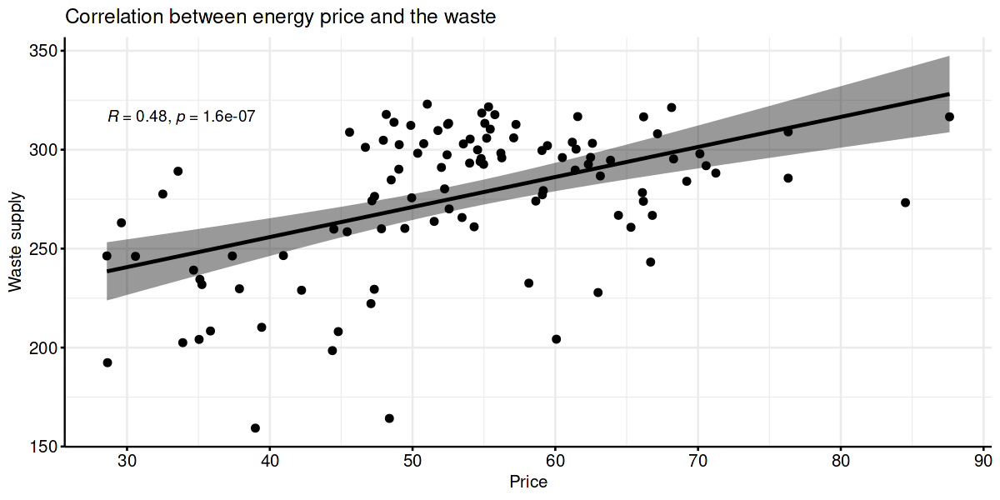

In [65]:
# Correlation with the less significant variable: waste.

options(repr.plot.width=10, repr.plot.height=5)
par(mfrow=c(1,1))

ggscatter(df_train, x = "price.actual", y = "generation.waste", title='Correlation between energy price and the waste',
          add = "reg.line", conf.int = TRUE, 
          cor.coef = TRUE, cor.method = "pearson",
          xlab = "Price", ylab = "Waste supply")+ grids()

res <- cor.test(df_train$price.actual, df_train$generation.waste, 
                    method = "pearson")
res

#### Test fitting

,ME,RMSE,MAE,MPE,MAPE
Test set,3.228689,7.680421,5.906447,4.567991,10.56447


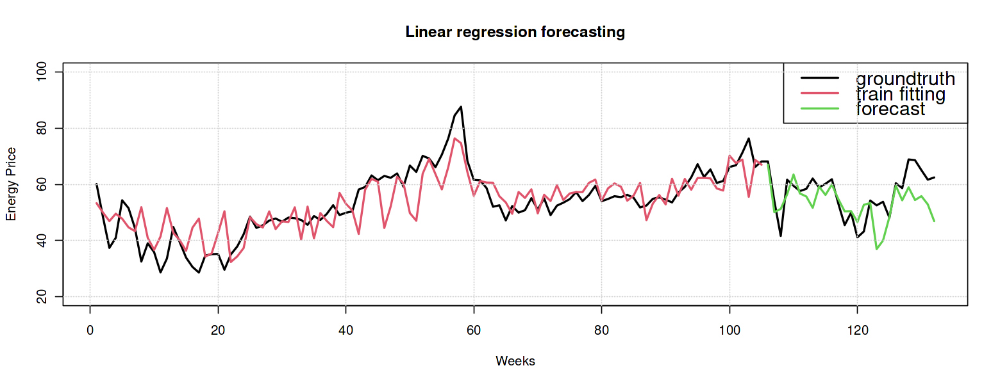

In [66]:
options(repr.plot.width=13, repr.plot.height=5)
par(mfrow=c(1,1))

pred_best_AIC_linear_model <- predict(best_AIC_linear_model, newdata=df_test)
accuracy(pred_best_AIC_linear_model, df_test$price.actual)

forecasting <- append(rep(NA, 105), pred_best_AIC_linear_model)
groundtruth <- c(df_train$price.actual, df_test$price.actual)

plot(groundtruth, type='l', lwd=2, xlab="Weeks", ylab="Energy Price", main="Linear regression forecasting", ylim=c(20,100))
lines(predict(best_AIC_linear_model, newdata=df_train), col=2, lwd=2,lty=1)
lines(forecasting, col=3, lwd=2,lty=1)

legend(x='topright',cex=1.5, legend = c('groundtruth', 'train fitting', 'forecast'), 
       col = c(1,2,3), lwd = 2,lty=1)
grid()

## Gradient Boosting Model

The following parameters have to been chosen carefully: number and depht of trees, shrinkage of the leraning rate.

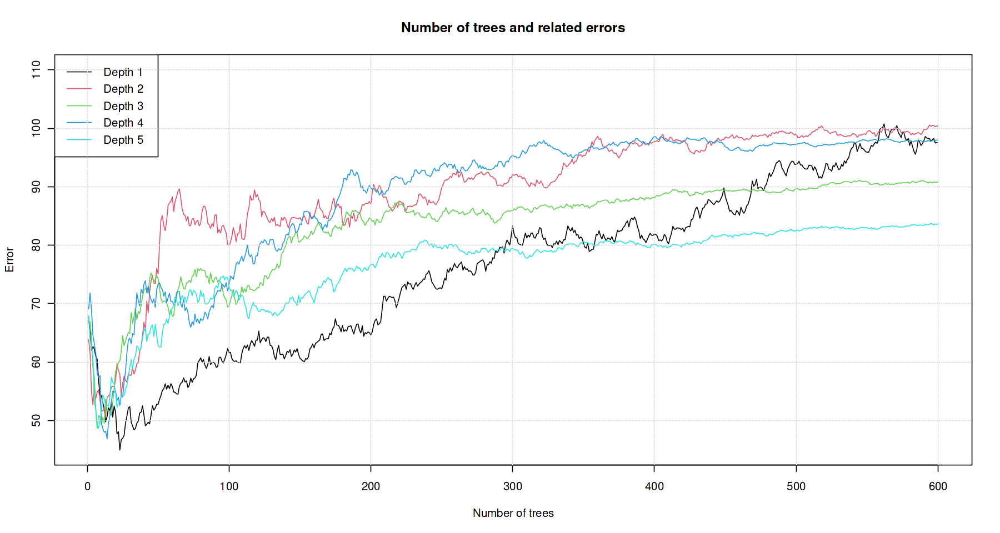

In [72]:
n_trees=600

# fitting
boost.price1=gbm(price.actual ~ ., data=df_train, 
                 distribution="gaussian", n.trees=n_trees, interaction.depth=1)
boost.price2=gbm(price.actual ~ ., data=df_train, 
                 distribution="gaussian", n.trees=n_trees, interaction.depth=2)
boost.price3=gbm(price.actual ~ ., data=df_train, 
                 distribution="gaussian", n.trees=n_trees, interaction.depth=3)
boost.price4=gbm(price.actual ~ ., data=df_train, 
                 distribution="gaussian", n.trees=n_trees, interaction.depth=4)
boost.price5=gbm(price.actual ~ ., data=df_train, 
                 distribution="gaussian", n.trees=n_trees, interaction.depth=5)

# forecasting
yhat.boost1=predict(boost.price1, newdata=df_test, n.trees=1:n_trees)
yhat.boost2=predict(boost.price2, newdata=df_test, n.trees=1:n_trees)
yhat.boost3=predict(boost.price3, newdata=df_test, n.trees=1:n_trees)
yhat.boost4=predict(boost.price4, newdata=df_test, n.trees=1:n_trees)
yhat.boost5=predict(boost.price5, newdata=df_test, n.trees=1:n_trees)

# Test error
err1 = apply(yhat.boost1, 2, function(pred) mean((df_test$price.actual- pred)^2))
err2 = apply(yhat.boost2, 2, function(pred) mean((df_test$price.actual- pred)^2))
err3 = apply(yhat.boost3, 2, function(pred) mean((df_test$price.actual- pred)^2))
err4 = apply(yhat.boost4, 2, function(pred) mean((df_test$price.actual- pred)^2))
err5 = apply(yhat.boost5, 2, function(pred) mean((df_test$price.actual- pred)^2))

options(repr.plot.width=15, repr.plot.height=8)
par(mfrow=c(1,1))
             
plot(err1, type="l", ylim=c(45,110), xlab='Number of trees', ylab='Error', main='Number of trees and related errors')
lines(err2, col=2)
lines(err3, col=3)
lines(err4, col=4)
lines(err5, col=5)
legend('topleft',col=c(1,2,3,4,5), legend=c('Depth 1','Depth 2','Depth 3','Depth 4','Depth 5'),lty=1)
grid()

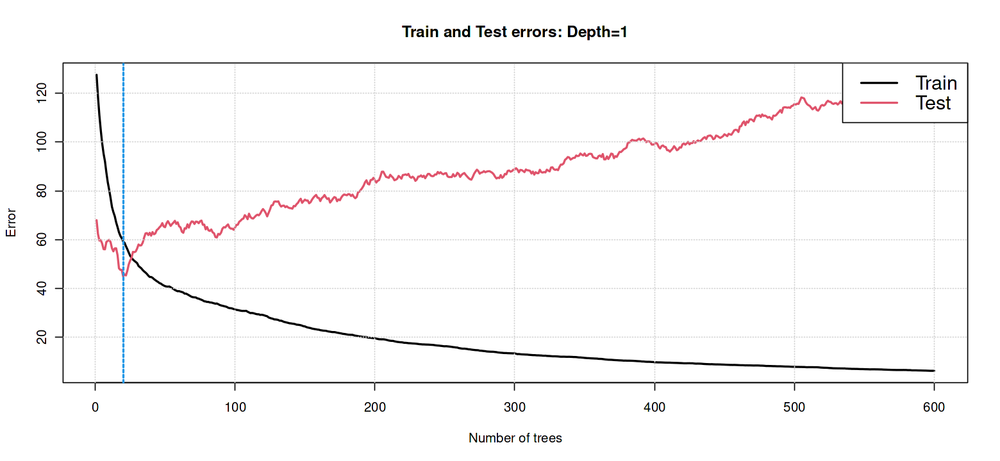

In [68]:
options(repr.plot.width=13, repr.plot.height=6)
par(mfrow=c(1,1))

plot(boost.price1$train.error, type="l", xlab='Number of trees', ylab='Error', main='Train and Test errors: Depth=1',lwd=2)
lines(err1, type="l", col=2, lwd=2)
grid()
legend('topright',cex=1.5, col=c(1,2), legend=c('Train','Test'), lty=1,lwd=2)

best_n_trees=which.min(err1)
abline(v=best_n_trees, lty='dashed', col=4,lwd=2)

#### Feature importance

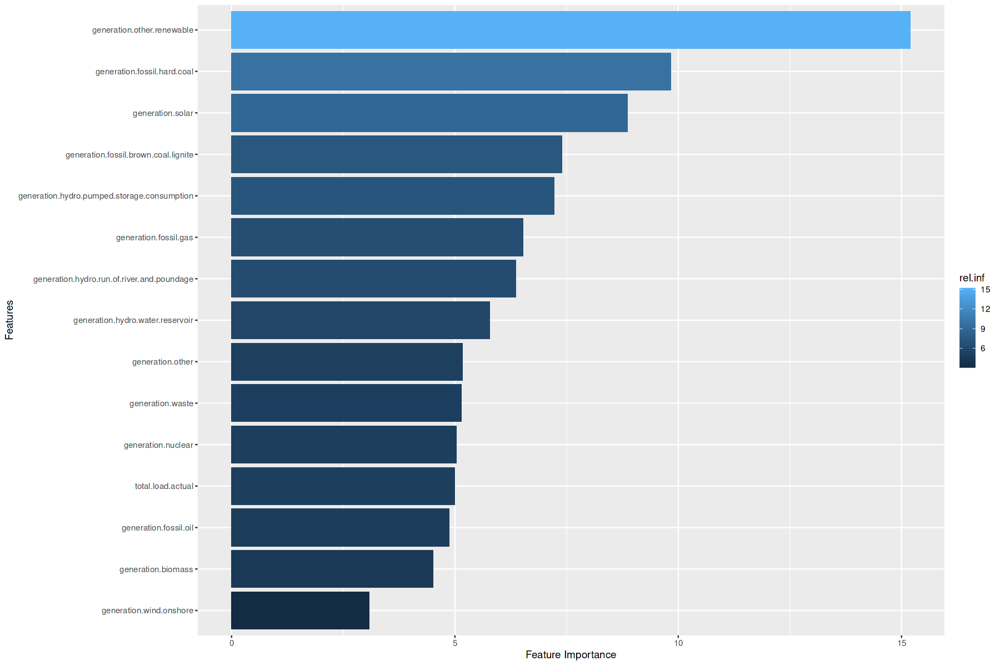

In [69]:
options(repr.plot.width=15, repr.plot.height=10)
par(mfrow=c(1,1))

importances <- summary(boost.price1, normalize =TRUE, cBars = length(boost.price1$var.names), plotit ='FALSE')
ggplot(importances, aes(x= reorder(var, rel.inf), y=rel.inf, fill=rel.inf))+geom_bar(stat ="identity")+ 
coord_flip() + xlab('Features') + ylab('Feature Importance')

#### Partial dependence plots

In [ ]:
best_boost.price=gbm(price.actual ~ ., data=df_train, 
                 distribution="gaussian", n.trees=best_n_trees, interaction.depth=1)

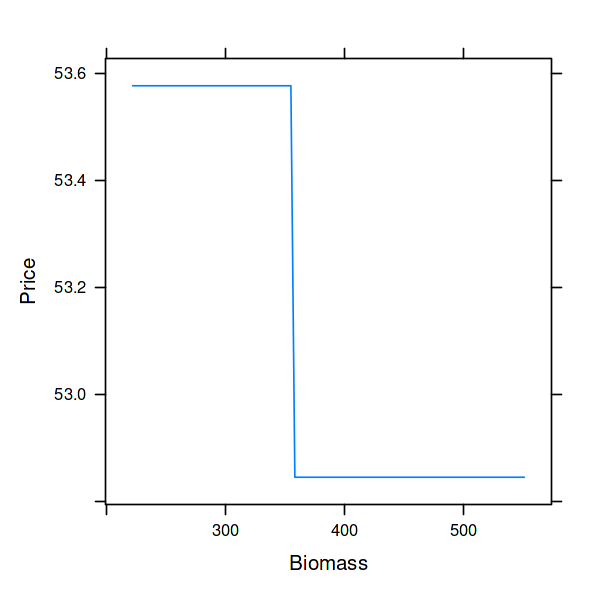

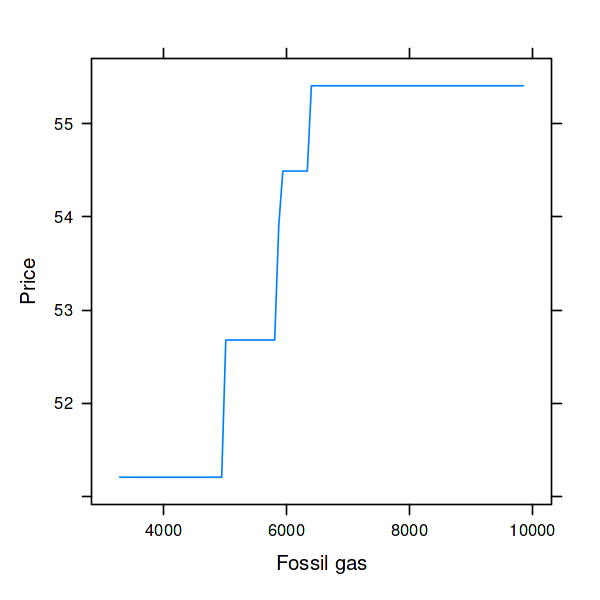

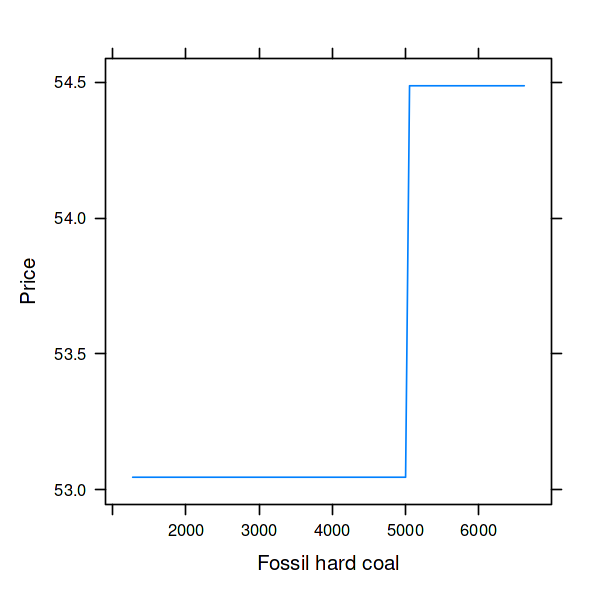

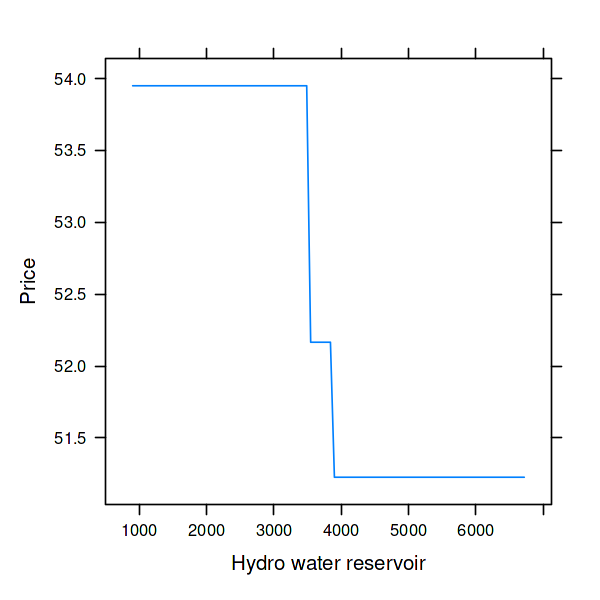

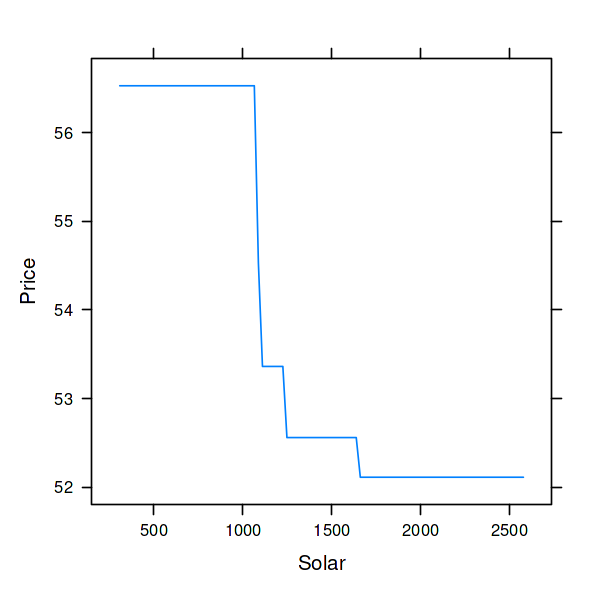

In [114]:
options(repr.plot.width=5, repr.plot.height=5)

plot(best_boost.price, i.var=1, n.trees = best_n_trees, xlab='Biomass', ylab='Price')
plot(best_boost.price, i.var=3, n.trees = best_n_trees, xlab='Fossil gas', ylab='Price')
plot(best_boost.price, i.var=4, n.trees = best_n_trees, xlab='Fossil hard coal', ylab='Price')
plot(best_boost.price, i.var=8, n.trees = best_n_trees, xlab='Hydro water reservoir', ylab='Price')
plot(best_boost.price, i.var=12, n.trees = best_n_trees, xlab='Solar', ylab='Price')

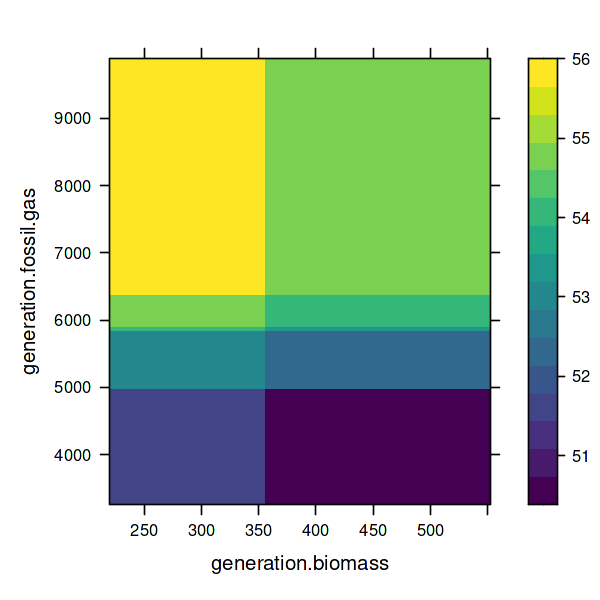

In [117]:
plot(best_boost.price, i.var=c(1,3), n.trees = best_n_trees)

## Simple Exponential Smoothing

Simple Exponential Smoothing (SES) is suitable for forecasting data with no clear trend or seasonal pattern. 

The parameter $\alpha$ regulates the amount of smoothing and we will perform Cross-Validation w.r.t. the RMSE to choose the best value.

A high value for $\alpha$ indicates that the model is more sensitive to a change in the data structure, while a lower value generates a ‘flat’ forecast.

[1] "Best value for alpha minimizing the RMSE:"


alpha,RMSE
<dbl>,<dbl>
0.0871,8.997016


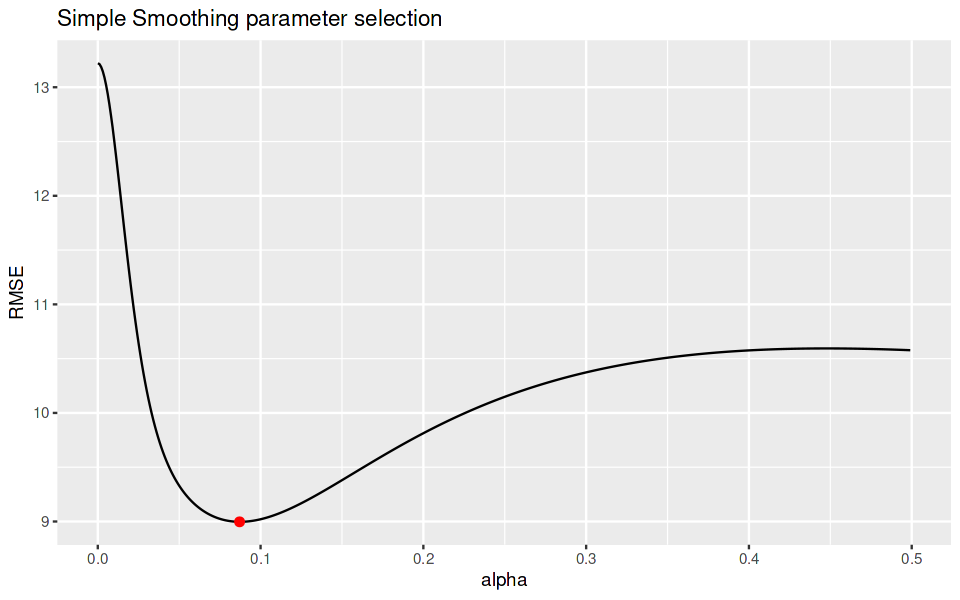

In [30]:
# Fitting for different values of alpha
alpha <- seq(.0001, .5, by = .001)
RMSE <- NA

for(i in seq_along(alpha )) {
  fit <- ses(price_16_17, alpha = alpha[i], h = 53)
  RMSE[i] <- accuracy(fit, price_18)[2,2]
}

# Convert to data frame and idenitify the best alpha value with min RMSE
alpha.fit <- data_frame(alpha, RMSE)
alpha.best <- filter(alpha.fit, RMSE == min(RMSE))

print("Best value for alpha minimizing the RMSE:")
alpha.best

# plot RMSE vs. alpha
options(repr.plot.width=8, repr.plot.height=5)

ggplot(alpha.fit, aes(alpha, RMSE)) +
  geom_line() +
  geom_point(data = alpha.best, 
             aes(alpha, RMSE), 
             size = 2, color = "red")+ ggtitle("Simple Smoothing parameter selection")

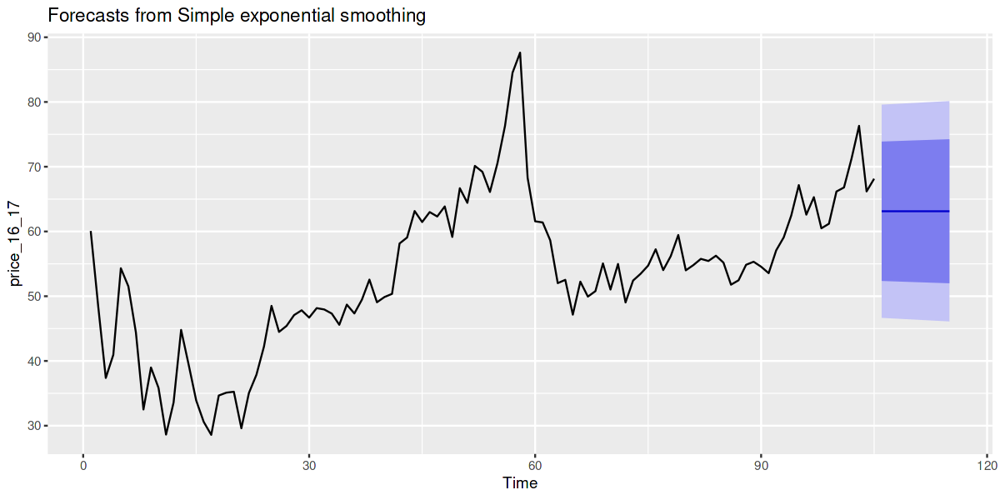

In [42]:
options(repr.plot.width=10, repr.plot.height=5)
ses.price <- ses(price_16_17, h=10, alpha=0.0871)
autoplot(ses.price)

## Holt smoothing

Holt smoothing allows the forecasting of data with a trend. This method involves a forecast equation and two smoothing equations (one for the level and one for the trend).

Again, $\alpha$ is the smoothing parameter of the series, and $\beta$ is the smoothing parameter for the trend.

[1] "Best value for beta minimizing the RMSE:"


beta,RMSE
<dbl>,<dbl>
0.2941,10.19056


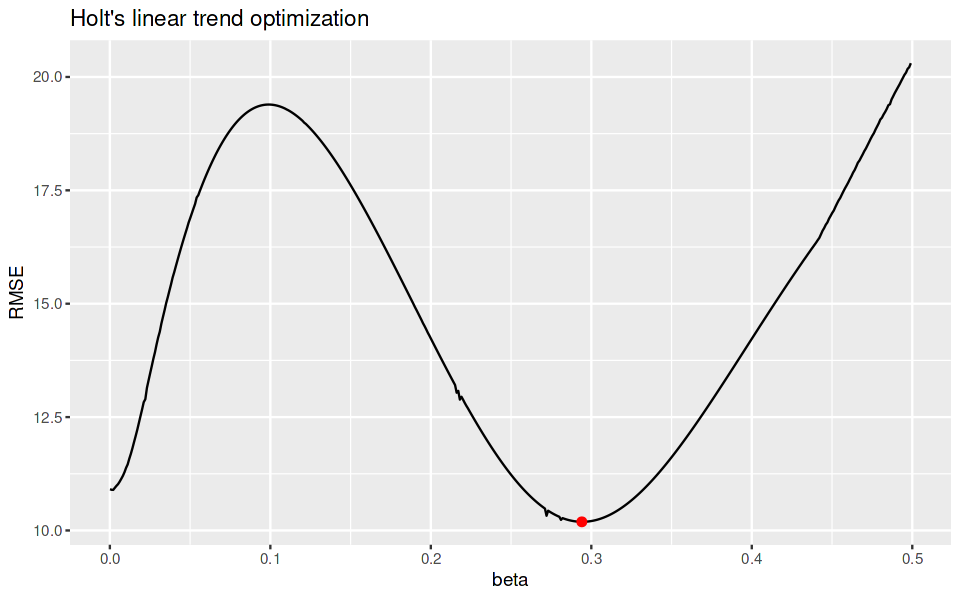

In [43]:
# Fitting for different values of beta
beta <- seq(.0001, .5, by = .001)
RMSE <- NA

for(i in seq_along(beta)) {
  fit <- holt(price_16_17, beta = beta[i], h = 53)
  RMSE[i] <- accuracy(fit, price_18)[2,2]
}
  
# Convert to data frame and idenitify the best beta value with min RMSE
beta.fit <- data_frame(beta, RMSE)
beta.best <- filter(beta.fit, RMSE == min(RMSE))

print("Best value for beta minimizing the RMSE:")
beta.best

# plot RMSE vs. beta
options(repr.plot.width=8, repr.plot.height=5)

ggplot(beta.fit, aes(beta, RMSE)) +
  geom_line() +
  geom_point(data = beta.best, 
             aes(beta, RMSE), 
             size = 2, color = "red") +ggtitle("Holt's linear trend optimization")
  

[1] "Standard model performance:"


,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,0.08166255,4.940489,3.733349,-0.4017693,7.512489,0.9973199,-0.002535772
Test set,-6.02226533,10.519902,7.593040,-12.0690376,14.129147,2.0283908,NA


[1] "Optimized model performance:"


,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,0.1516345,5.413462,3.926591,0.1672195,7.872117,1.048942,-0.08556787
Test set,-3.7453930,10.190564,7.474005,-8.5911279,13.675439,1.996592,NA


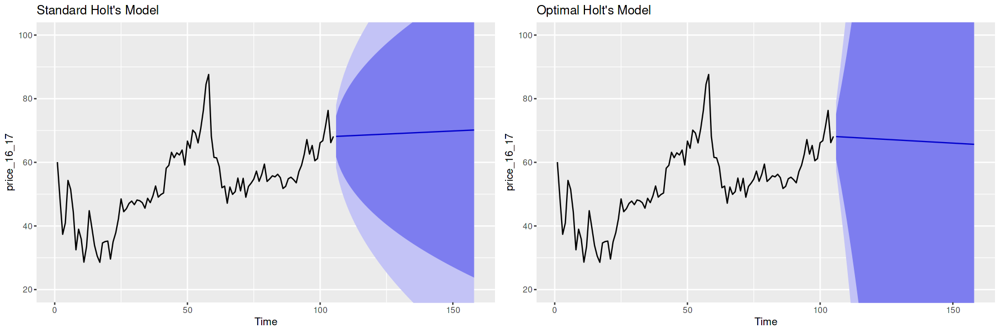

In [45]:
# Standard model
holt.price <- holt(price_16_17, h = 53)
print("Standard model performance:")
accuracy(holt.price, price_18)

# Optimized model with best beta
holt.price.opt <- holt(price_16_17, h = 53, beta = 0.2941)
print("Optimized model performance:")
accuracy(holt.price.opt, price_18)

options(repr.plot.width=20, repr.plot.height=8)

p1 <- autoplot(holt.price) +
  ggtitle("Standard Holt's Model") +
  coord_cartesian(ylim = c(20, 100))
  
p2 <- autoplot(holt.price.opt) +
  ggtitle("Optimal Holt's Model") +
  coord_cartesian(ylim = c(20, 100))

options(repr.plot.width=15, repr.plot.height=5)
gridExtra::grid.arrange(p1, p2, nrow = 1)

#### Differentiated energy price

To stabilize the series it is possible to differentiate the prices and try to predict not the price itself but the difference with the day before.

In [84]:
price.diff.16_17<-diff(price_16_17)
price.diff.18<-diff(price_18)

[1] "Best value for beta minimizing the RMSE:"


beta,RMSE
<dbl>,<dbl>
0.0031,5.557827


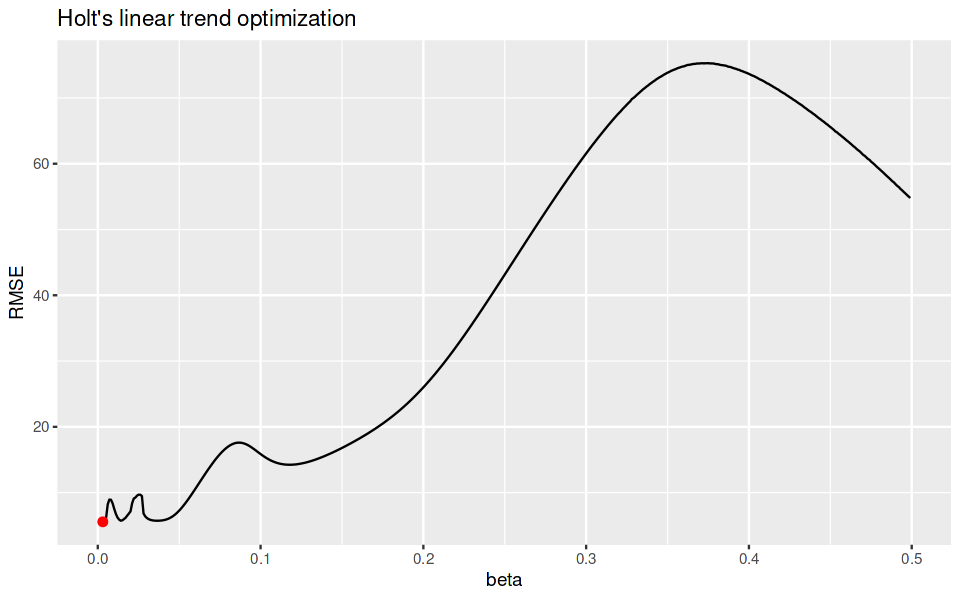

In [47]:
# Fitting for different values of beta
beta <- seq(.0001, .5, by = .001)
RMSE <- NA

for(i in seq_along(beta)) {
  fit <- holt(price.diff.16_17, beta = beta[i], h = 53)
  RMSE[i] <- accuracy(fit, price.diff.18)[2,2]
}
  
# Convert to data frame and idenitify the best beta value with min RMSE
beta.fit <- data_frame(beta, RMSE)
beta.best <- filter(beta.fit, RMSE == min(RMSE))

print("Best value for beta minimizing the RMSE:")
beta.best

# plot RMSE vs. beta
options(repr.plot.width=8, repr.plot.height=5)

ggplot(beta.fit, aes(beta, RMSE)) +
  geom_line() +
  geom_point(data = beta.best, 
             aes(beta, RMSE), 
             size = 2, color = "red") +ggtitle("Holt's linear trend optimization")
  

[1] "Standard model performance:"


,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,-0.3230923,5.053611,3.855130,86.95682,143.6657,0.7267297,0.03284826
Test set,-3.0731974,6.351760,4.845084,13.87996,291.3605,0.9133456,NA


[1] "Optimized model performance:"


,ME,RMSE,MAE,MPE,MAPE,MASE,ACF1
Training set,-0.18093656,5.046204,3.811917,104.58055,108.52483,0.7185835,0.03432344
Test set,-0.02250293,5.557827,3.700022,91.71334,96.98202,0.6974902,NA


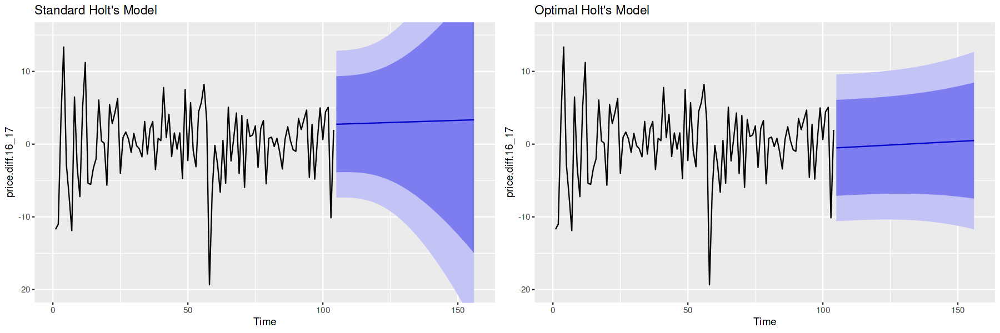

In [49]:
# Standard model
holt.price <- holt(price.diff.16_17, h = 52)
print("Standard model performance:")
accuracy(holt.price, price.diff.18)

# Optimized model with best beta
holt.price.opt <- holt(price.diff.16_17, h = 52, beta = 0.0031)
print("Optimized model performance:")
accuracy(holt.price.opt, price.diff.18)

options(repr.plot.width=20, repr.plot.height=8)

p1 <- autoplot(holt.price) +
  ggtitle("Standard Holt's Model") +
  coord_cartesian(ylim = c(-20, 15))
  
p2 <- autoplot(holt.price.opt) +
  ggtitle("Optimal Holt's Model") +
  coord_cartesian(ylim = c(-20, 15))

options(repr.plot.width=15, repr.plot.height=5)
gridExtra::grid.arrange(p1, p2, nrow = 1)

## ARIMA Models

While exponential smoothing models are based on a description of the trend and seasonality in the data, ARIMA models aim to describe the autocorrelations in the data.

In an autoregression model, we forecast the variable of interest using a linear combination of past values of the variable. The term autoregression indicates that it is a regression of the variable against itself. We refer to this as an $AR(p)$ model, an autoregressive model of order $p$.

Rather than using past values of the forecast variable in a regression, a moving average model uses past forecast errors in a regression-like model. We refer to this as an $MA(q)$ model, a moving average model of order $q$.

If we combine differencing with autoregression and a moving average model, we obtain a non-seasonal ARIMA model. Indeed, ARIMA is an acronym for AutoRegressive Integrated Moving Average, that is $ARIMA(p, d, q)$ where $p$ refers to the AR part, $q$ refers to the MA part and $d$ is the degree of first differencing involved.

A further extension of ARIMA models concerns seasonality. An ARIMA model with seasonal components is an $ARIMA(p, d, q)(P,D,Q)s$, where $(p, d, q)$ indicates the non-seasonal component of the model, while $(P,D,Q)$ indicates the seasonal component of order $s$.

#### Autocorrelation in the data

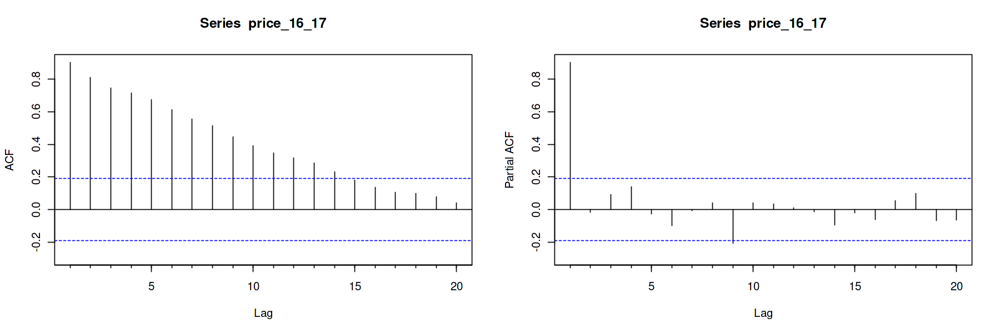

In [50]:
options(repr.plot.width=15, repr.plot.height=5)
par(mfrow=c(1,2))

Acf(price_16_17)
Pacf(price_16_17)

Usually, by simply looking at the time series plot, it is not possible to tell what values of $p$ and $q$ are appropriate for the data. However, it is sometimes useful to use the ACF plot, and the closely related PACF plot, to determine appropriate values for 
$p$ and $q$.

#### One-component ARIMA

In [51]:
white.noise <- Arima(price_16_17,order=c(0,0,0))
random.walk <- Arima(price_16_17,order=c(0,1,0))
autoregression <- Arima(price_16_17,order=c(1,0,0))
moving.average <- Arima(price_16_17,order=c(0,0,1))

models.basic <- c('White Noise', 'Random Walk', 'Autoregression', 'Moving Average')
AICs.basic <- c(white.noise$aic, random.walk$aic, autoregression$aic, moving.average$aic)
models.AIC.basic <- data.frame(models.basic, AICs.basic)
models.AIC.basic

models.basic,AICs.basic
<chr>,<dbl>
White Noise,818.8044
Random Walk,629.7070
Autoregression,636.5455
Moving Average,730.7051



	Ljung-Box test

data:  Residuals from ARIMA(0,1,0)
Q* = 11.455, df = 10, p-value = 0.3232

Model df: 0.   Total lags used: 10



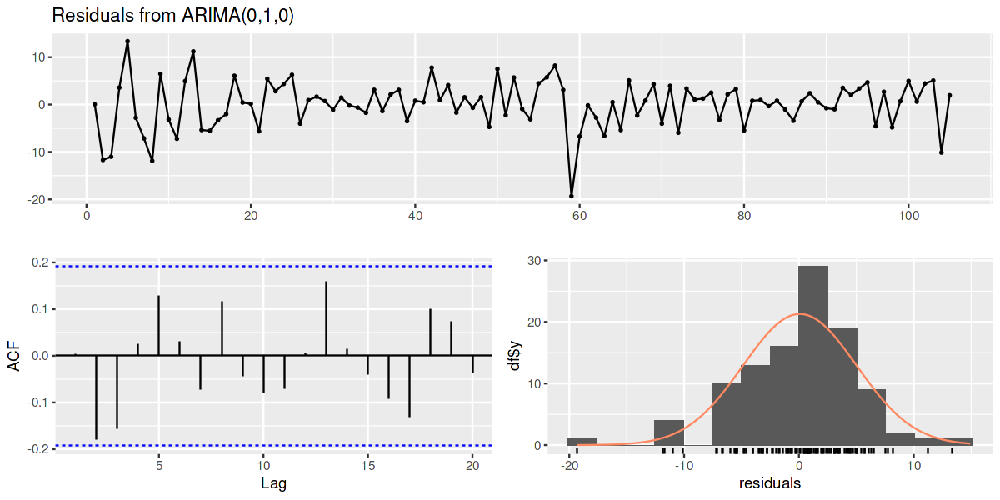

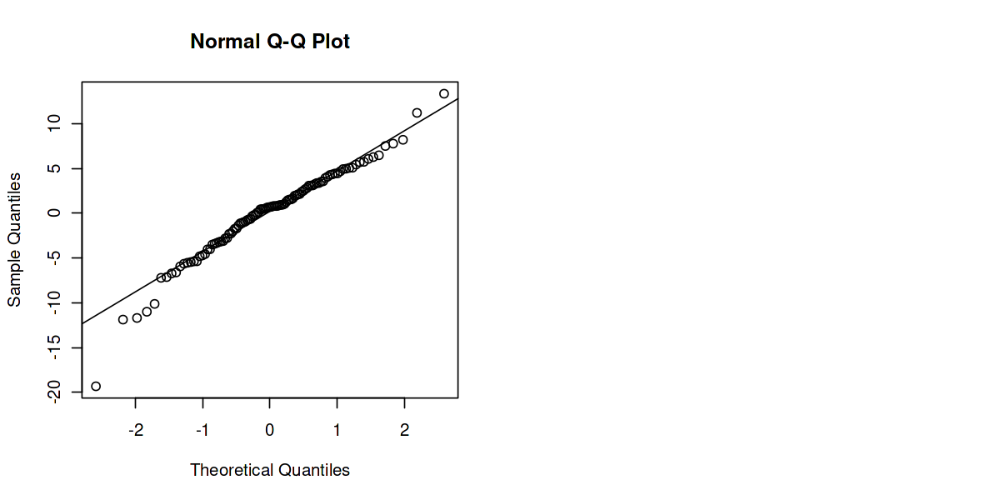

In [55]:
# The best one-component ARIMA according to AIC is Random Walk

# Analysis of the residuals
options(repr.plot.width=10, repr.plot.height=5)
par(mfrow=c(1,2))

resid.random.walk <- residuals(random.walk)
checkresiduals(random.walk)
qqnorm(resid.random.walk)
qqline(resid.random.walk)

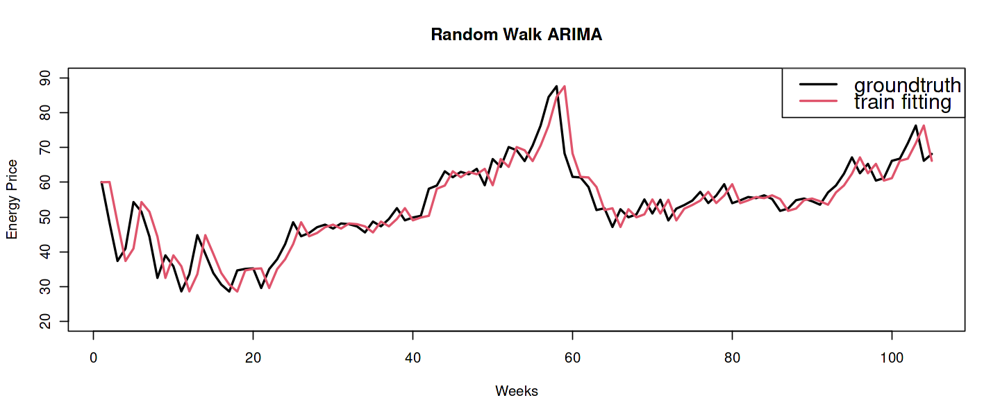

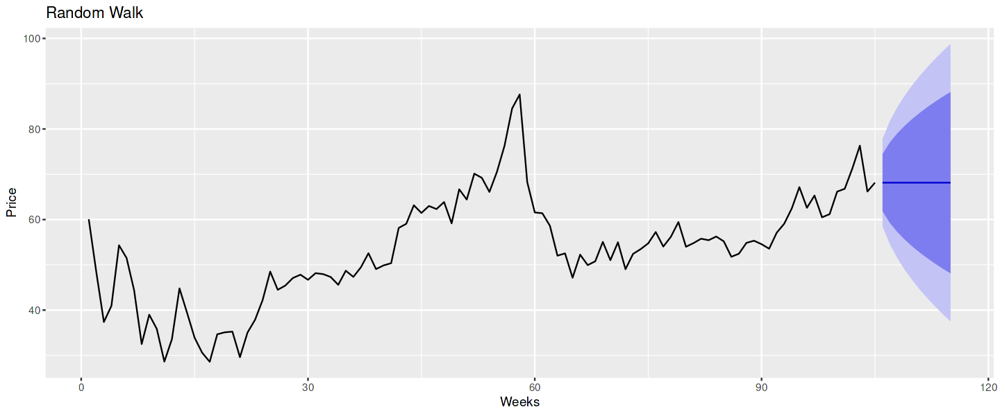

In [58]:
# Fitting
options(repr.plot.width=12, repr.plot.height=5)
par(mfrow=c(1,1))

plot(price_16_17, type='l', lwd=2, xlab="Weeks", ylab="Energy Price", main="Random Walk ARIMA", ylim=c(20,90))
lines(fitted(random.walk), col=2, lwd=2,lty=1)
legend(x='topright',cex=1.5, legend = c('groundtruth', 'train fitting'), 
       col = c(1,2), lwd = 2,lty=1)

# Forecasting
for.random.walk<- forecast(random.walk)
autoplot(for.random.walk, xlab='Weeks', ylab='Price', main='Random Walk')

#### Non-seasonal ARIMA

In [59]:
a1.one_variable<- Arima(price_16_17,order=c(0,0,1))
a2.one_variable<- Arima(price_16_17,order=c(1,0,1))
a3.one_variable<- Arima(price_16_17,order=c(2,0,1))
a4.one_variable<- Arima(price_16_17,order=c(2,1,1))
a5.one_variable<- Arima(price_16_17,order=c(0,0,2))
a6.one_variable<- Arima(price_16_17,order=c(0,1,2))
a7.one_variable<- Arima(price_16_17,order=c(1,1,2))
a8.one_variable<- Arima(price_16_17,order=c(2,1,2))

models.one_variable<-c('ARIMA(0,0,1)','ARIMA(1,0,1)','ARIMA(2,0,1)','ARIMA(2,1,1)',
         'ARIMA(0,0,2)','ARIMA(0,1,2)','ARIMA(1,1,2)','ARIMA(2,1,2)')
AICs.one_variable<-c(a1.one_variable$aic,a2.one_variable$aic,a3.one_variable$aic,a4.one_variable$aic,
            a5.one_variable$aic,a6.one_variable$aic,a7.one_variable$aic,a8.one_variable$aic)

models.AIC.one_variable<-data.frame(models.one_variable, AICs.one_variable)
models.AIC.one_variable

models.one_variable,AICs.one_variable
<chr>,<dbl>
"ARIMA(0,0,1)",730.7051
"ARIMA(1,0,1)",638.2007
"ARIMA(2,0,1)",640.2879
"ARIMA(2,1,1)",630.0351
"ARIMA(0,0,2)",689.4777
"ARIMA(0,1,2)",629.8027
"ARIMA(1,1,2)",631.1708
"ARIMA(2,1,2)",631.1652



	Ljung-Box test

data:  Residuals
Q* = 6.165, df = 10, p-value = 0.8012

Model df: 0.   Total lags used: 10



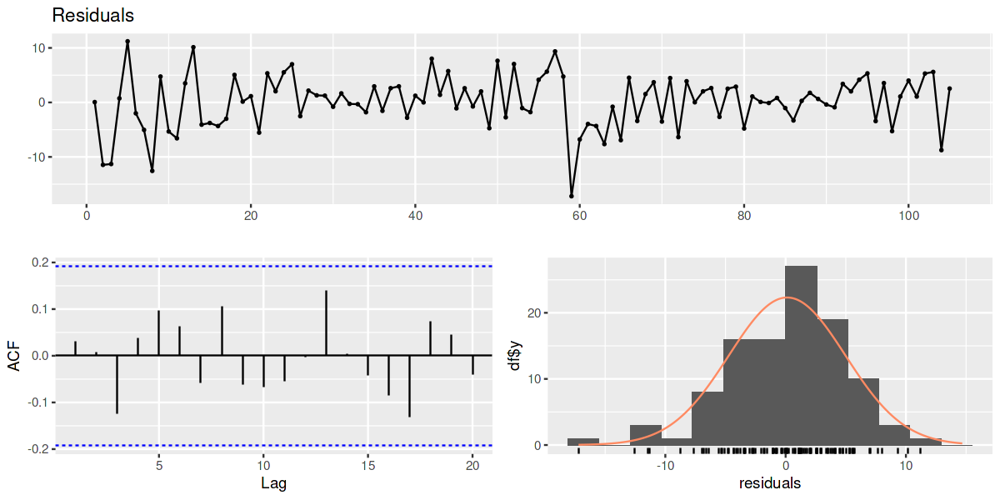

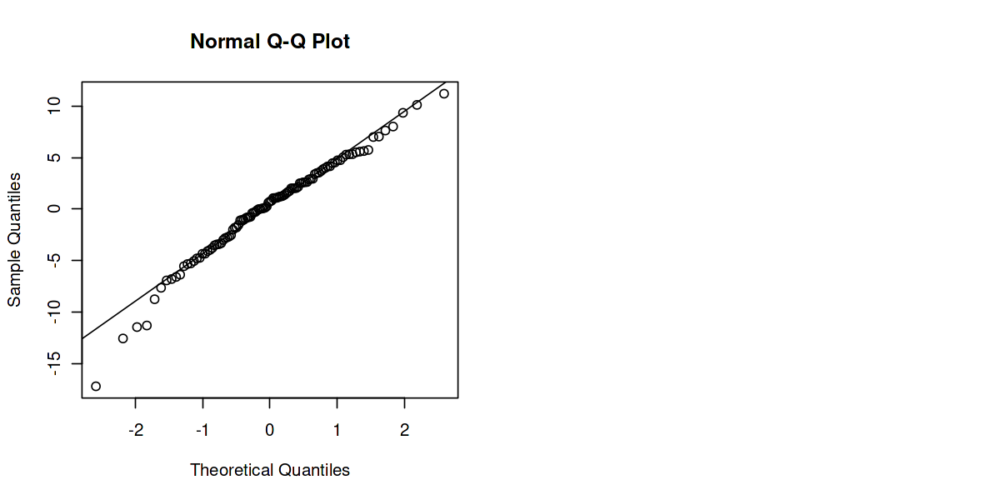

In [60]:
# The best one-variable, non-seasonal ARIMA according to AIC is ARIMA(0,1,2)

# Analysis of the residuals
options(repr.plot.width=10, repr.plot.height=5)
par(mfrow=c(1,2))

resid.a6.one_variable <- residuals(a6.one_variable)
checkresiduals(resid.a6.one_variable)
qqnorm(resid.a6.one_variable)
qqline(resid.a6.one_variable)

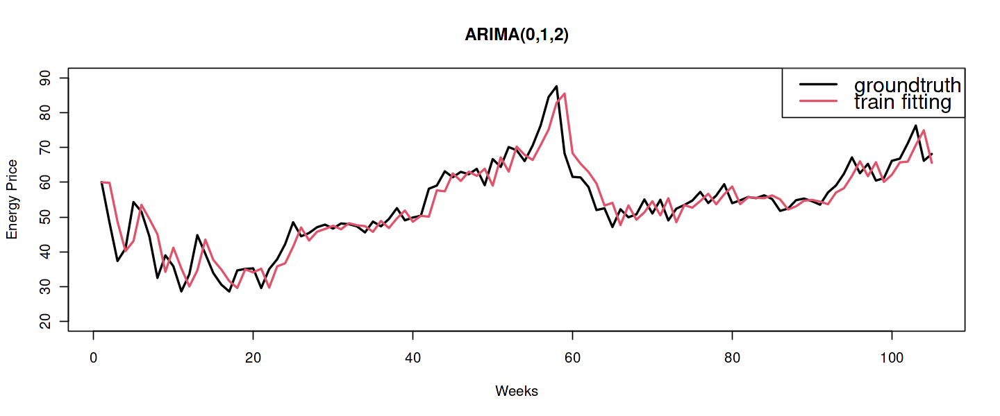

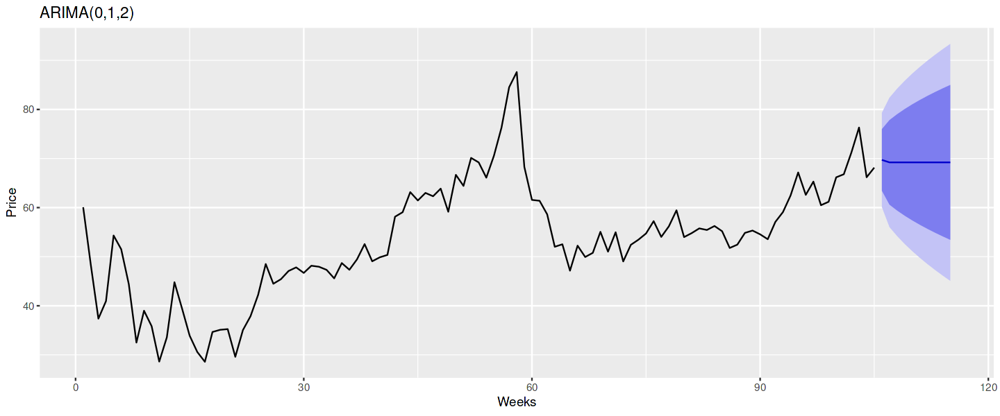

In [61]:
# Fitting
options(repr.plot.width=12, repr.plot.height=5)
par(mfrow=c(1,1))

plot(price_16_17, type='l', lwd=2, xlab="Weeks", ylab="Energy Price", main="ARIMA(0,1,2)", ylim=c(20,90))
lines(fitted(a6.one_variable), col=2, lwd=2,lty=1)
legend(x='topright',cex=1.5, legend = c('groundtruth', 'train fitting'), 
       col = c(1,2), lwd = 2,lty=1)

# Forecasting
for.a6.one_variable<- forecast(a6.one_variable)
autoplot(for.a6.one_variable, xlab='Weeks', ylab='Price', main='ARIMA(0,1,2)')

#### Seasonal ARIMA

In [64]:
a1.one_variable_s<- Arima(price_16_17,order=c(0,0,3), seasonal=c(1,0,3))
a2.one_variable_s<- Arima(price_16_17,order=c(1,0,3), seasonal=c(2,0,3))
a3.one_variable_s<- Arima(price_16_17,order=c(3,0,3), seasonal=c(1,0,1))
a4.one_variable_s<- Arima(price_16_17,order=c(3,1,3), seasonal=c(2,1,3))
a5.one_variable_s<- Arima(price_16_17,order=c(3,2,3), seasonal=c(2,1,3))
a6.one_variable_s<- Arima(price_16_17,order=c(3,1,3), seasonal=c(3,1,3))
a7.one_variable_s<- Arima(price_16_17,order=c(3,1,3), seasonal=c(3,2,3))
a8.one_variable_s<- Arima(price_16_17,order=c(3,3,3), seasonal=c(3,3,3))

models.one_variable_s<-c('ARIMA(0,0,3)(1,0,3)','ARIMA(1,0,3)(2,0,3)','ARIMA(3,0,3)(1,0,1)','ARIMA(3,1,3)(2,1,3)',
         'ARIMA(3,2,3)(2,1,3)','ARIMA(3,1,3)(3,1,3)','ARIMA(3,1,3)(3,2,1)','ARIMA(3,3,3)(2,3,3)')
AICs.one_variable_s<-c(a1.one_variable_s$aic,a2.one_variable_s$aic,a3.one_variable_s$aic,a4.one_variable_s$aic,
            a5.one_variable_s$aic,a6.one_variable_s$aic,a7.one_variable_s$aic,a8.one_variable_s$aic)

models.AIC.one_variable_s<-data.frame(models.one_variable_s, AICs.one_variable_s)
models.AIC.one_variable_s

models.one_variable_s,AICs.one_variable_s
<chr>,<dbl>
"ARIMA(0,0,3)(1,0,3)",667.7827
"ARIMA(1,0,3)(2,0,3)",639.3712
"ARIMA(3,0,3)(1,0,1)",639.3907
"ARIMA(3,1,3)(2,1,3)",632.1346
"ARIMA(3,2,3)(2,1,3)",633.2809
"ARIMA(3,1,3)(3,1,3)",632.1346
"ARIMA(3,1,3)(3,2,1)",632.1346
"ARIMA(3,3,3)(2,3,3)",640.0827



	Ljung-Box test

data:  Residuals
Q* = 3.3841, df = 10, p-value = 0.9709

Model df: 0.   Total lags used: 10



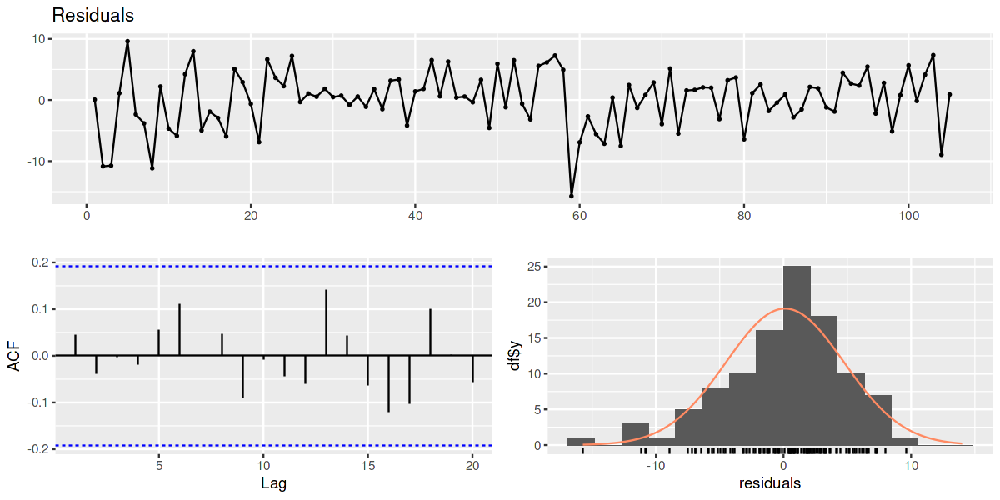

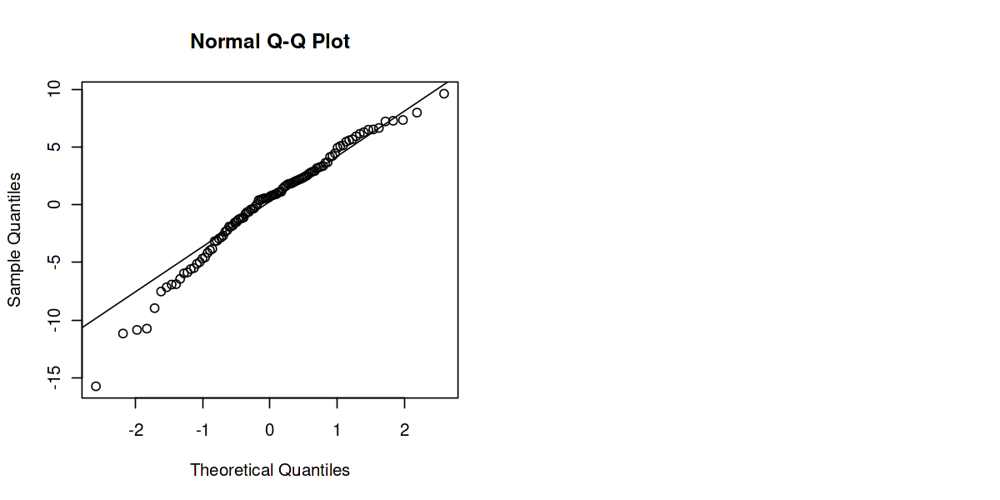

In [65]:
# The best one-variable, seasonal ARIMA according to AIC are 
# ARIMA(3,1,3)(3,1,3), ARIMA(3,1,3)(2,1,3), and ARIMA(3,1,3)(3,2,1)
# --> We'll focus on the first one.

# Analysis of the residuals
options(repr.plot.width=10, repr.plot.height=5)
par(mfrow=c(1,2))

resid.a6.one_variable_s <- residuals(a6.one_variable_s)
checkresiduals(resid.a6.one_variable_s)
qqnorm(resid.a6.one_variable_s)
qqline(resid.a6.one_variable_s)

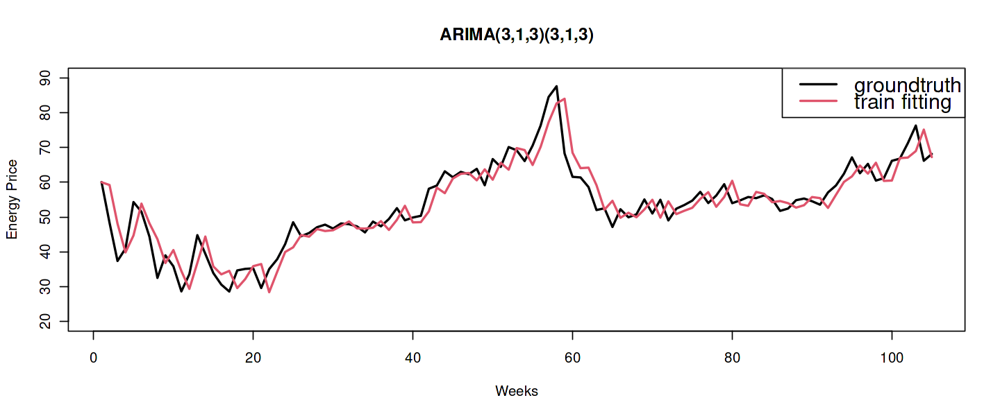

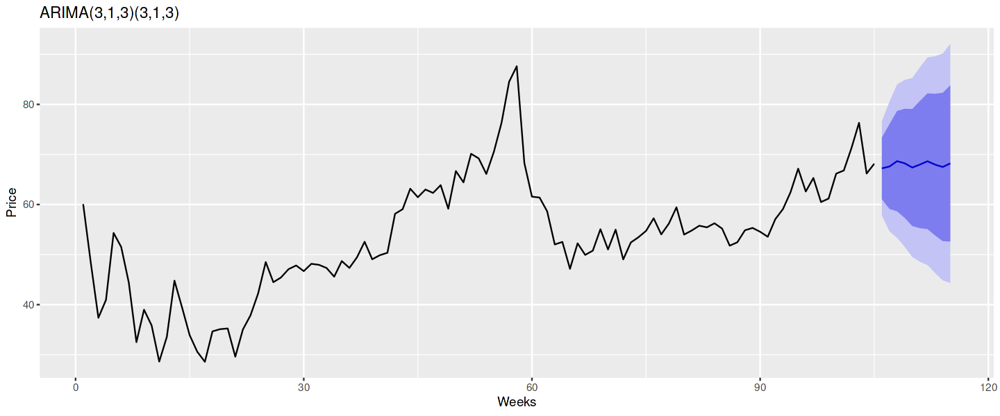

In [66]:
# Fitting
options(repr.plot.width=12, repr.plot.height=5)
par(mfrow=c(1,1))

plot(price_16_17, type='l', lwd=2, xlab="Weeks", ylab="Energy Price", main="ARIMA(3,1,3)(3,1,3)", ylim=c(20,90))
lines(fitted(a6.one_variable_s), col=2, lwd=2,lty=1)
legend(x='topright',cex=1.5, legend = c('groundtruth', 'train fitting'), 
       col = c(1,2), lwd = 2,lty=1)

# Forecasting
for.a6.one_variable<- forecast(a6.one_variable_s)
autoplot(for.a6.one_variable, xlab='Weeks', ylab='Price', main='ARIMA(3,1,3)(3,1,3)')

#### Multi-variable ARIMA
ARIMA models allow the use of all the variable available in the dataset to perform the regeression: this improves a lot the performance.

In [76]:
a1<- Arima(price_16_17, xreg=as.matrix(df_train[,1:15]),order=c(0,0,3), seasonal=c(1,0,3))
a2<- Arima(price_16_17, xreg=as.matrix(df_train[,1:15]),order=c(1,0,3), seasonal=c(2,0,3))
a3<- Arima(price_16_17, xreg=as.matrix(df_train[,1:15]),order=c(3,0,3), seasonal=c(1,0,1))
a4<- Arima(price_16_17, xreg=as.matrix(df_train[,1:15]),order=c(3,1,3), seasonal=c(2,1,3))
a5<- Arima(price_16_17, xreg=as.matrix(df_train[,1:15]),order=c(3,2,3), seasonal=c(2,1,3))
a6<- Arima(price_16_17, xreg=as.matrix(df_train[,1:15]),order=c(3,1,3), seasonal=c(3,1,3))
a7<- Arima(price_16_17, xreg=as.matrix(df_train[,1:15]),order=c(3,1,3), seasonal=c(3,2,3))
a8<- Arima(price_16_17, xreg=as.matrix(df_train[,1:15]),order=c(3,3,3), seasonal=c(3,3,3))

models.multi_variables<-c('ARIMA(0,0,3)(1,0,3)','ARIMA(1,0,3)(2,0,3)','ARIMA(3,0,3)(1,0,1)','ARIMA(3,1,3)(2,1,3)',
         'ARIMA(3,2,3)(2,1,3)','ARIMA(3,1,3)(3,1,3)','ARIMA(3,1,3)(3,2,1)','ARIMA(3,3,3)(2,3,3)')
AICs.multi_variables<-c(a1$aic,a2$aic,a3$aic,a4$aic,a5$aic,a6$aic,a7$aic,a8$aic)

models.AIC.multi_variables<-data.frame(models.multi_variables, AICs.multi_variables)
models.AIC.multi_variables

models.multi_variables,AICs.multi_variables
<chr>,<dbl>
"ARIMA(0,0,3)(1,0,3)",641.0881
"ARIMA(1,0,3)(2,0,3)",590.7733
"ARIMA(3,0,3)(1,0,1)",553.3409
"ARIMA(3,1,3)(2,1,3)",579.9732
"ARIMA(3,2,3)(2,1,3)",586.6827
"ARIMA(3,1,3)(3,1,3)",579.9732
"ARIMA(3,1,3)(3,2,1)",579.9732
"ARIMA(3,3,3)(2,3,3)",591.9919



	Ljung-Box test

data:  Residuals
Q* = 10.181, df = 10, p-value = 0.4248

Model df: 0.   Total lags used: 10



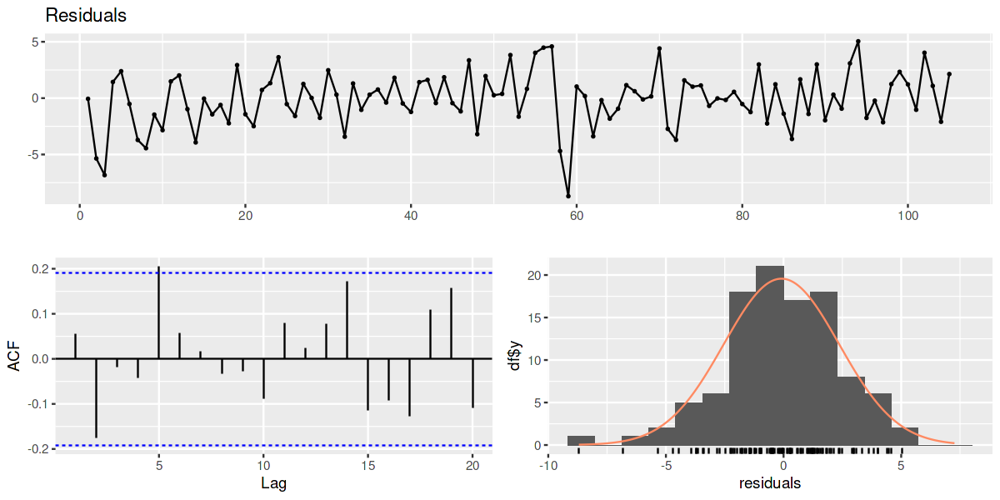

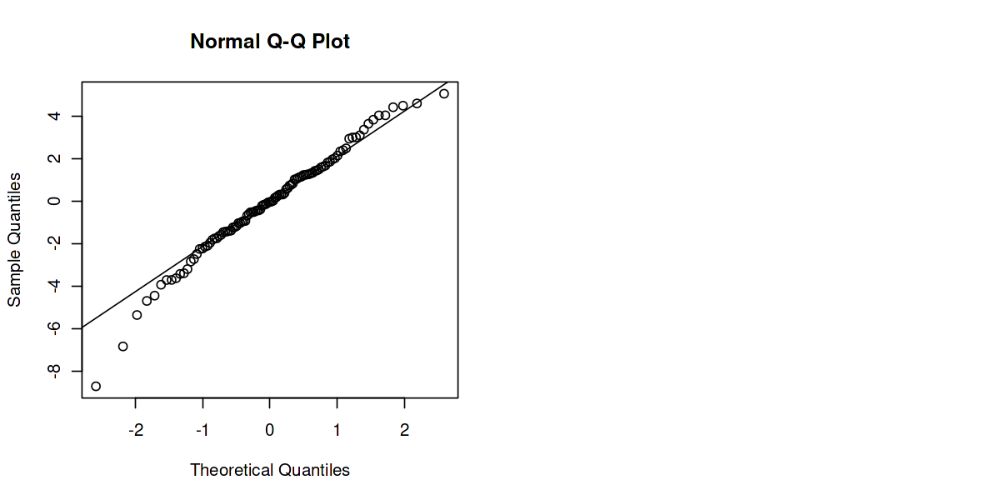

In [77]:
# The best multi-variables ARIMA according to AIC is ARIMA(3,0,3)(1,0,1)

# Analysis of the residuals
options(repr.plot.width=10, repr.plot.height=5)
par(mfrow=c(1,2))

resid.a3 <- residuals(a3)
checkresiduals(resid.a3)
qqnorm(resid.a3)
qqline(resid.a3)

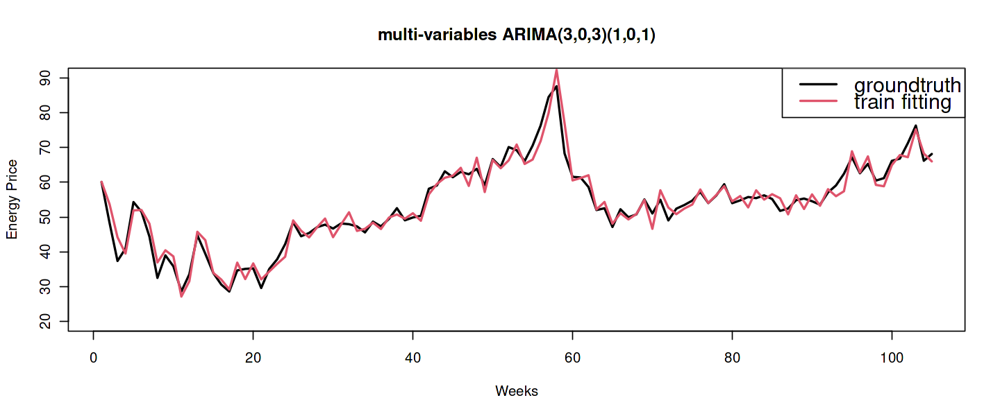

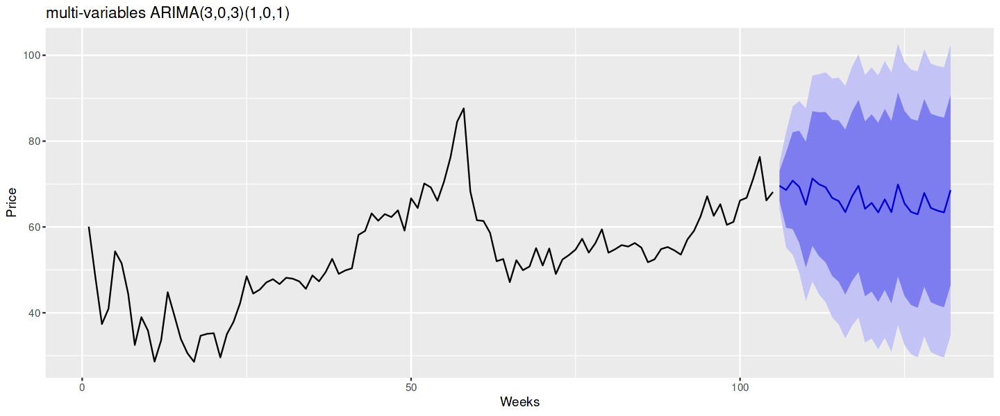

In [82]:
# Fitting
options(repr.plot.width=12, repr.plot.height=5)
par(mfrow=c(1,1))

plot(price_16_17, type='l', lwd=2, xlab="Weeks", ylab="Energy Price", main="multi-variables ARIMA(3,0,3)(1,0,1)", ylim=c(20,90))
lines(fitted(a3), col=2, lwd=2,lty=1)
legend(x='topright',cex=1.5, legend = c('groundtruth', 'train fitting'), 
       col = c(1,2), lwd = 2,lty=1)

# Forecasting
for.a3<- forecast(a3, xreg=as.matrix(df_test[,1:15]))
autoplot(for.a3, xlab='Weeks', ylab='Price', main='multi-variables ARIMA(3,0,3)(1,0,1)')

#### Differentiated energy price

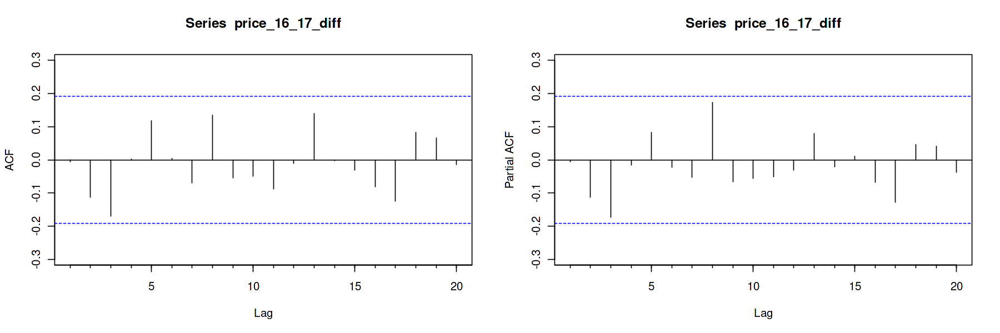

In [128]:
price_diff<-numeric(0)
for(i in 1:length(price)-1){
    price_diff<-c(price_diff,(price[i]-price[i+1]))
}

price_16_17_18_diff<-price_diff[52:182]
price_16_17_diff<-price_diff[52:156]
price_18_diff<-price_diff[156:208]
price_6m_18_diff<-price_diff[156:182]

# Autocorrelation
options(repr.plot.width=15, repr.plot.height=5)
par(mfrow=c(1,2))

Acf(price_16_17_diff)
Pacf(price_16_17_diff)


	Ljung-Box test

data:  Residuals
Q* = 17.176, df = 10, p-value = 0.07057

Model df: 0.   Total lags used: 10



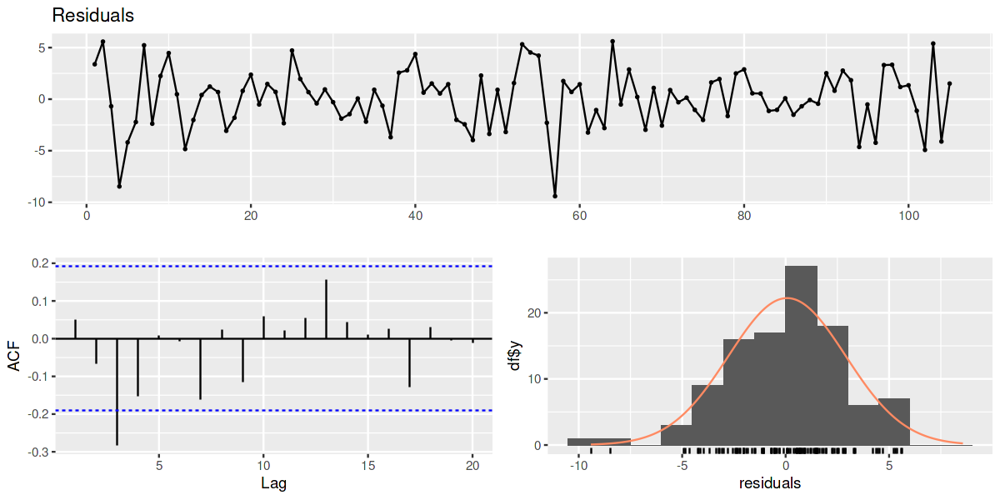

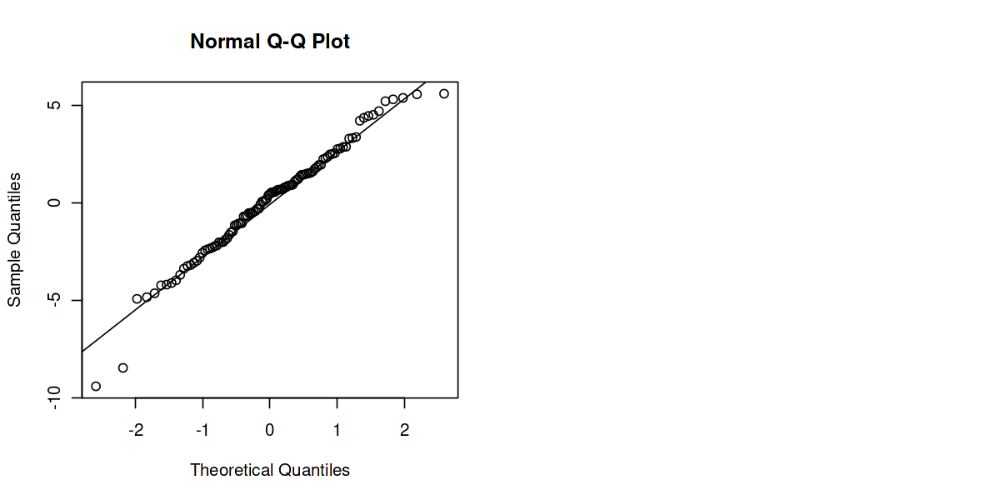

In [132]:
# Multi-variables ARIMA(3,1,3)(1,0,3)
arima_diff<- Arima(price_16_17_diff, xreg=as.matrix(df_train[,1:15]),order=c(3,0,3), seasonal=c(1,0,1))

# Analysis of the residuals
options(repr.plot.width=10, repr.plot.height=5)
par(mfrow=c(1,2))

resid.arima_diff <- residuals(arima_diff)
checkresiduals(resid.arima_diff)
qqnorm(resid.arima_diff)
qqline(resid.arima_diff)

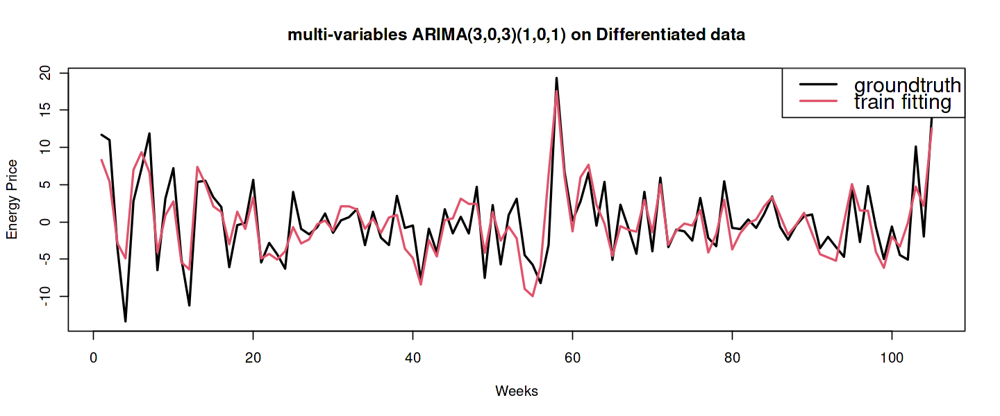

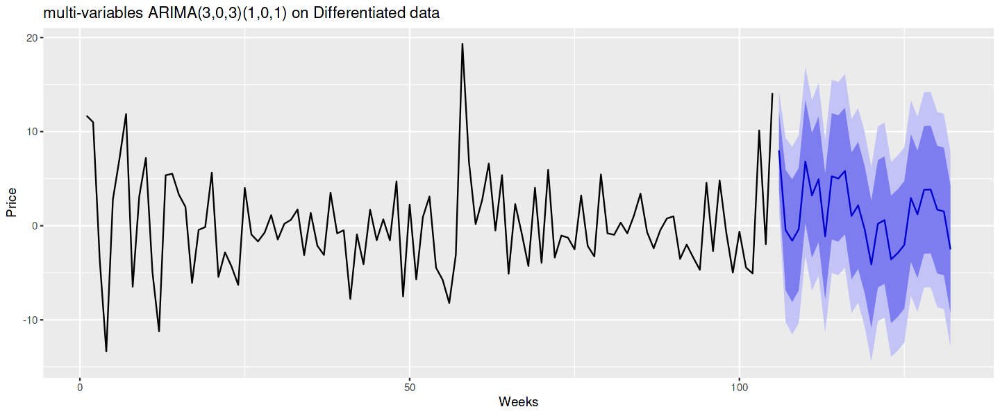

In [134]:
# Fitting
options(repr.plot.width=12, repr.plot.height=5)
par(mfrow=c(1,1))

plot(price_16_17_diff, type='l', lwd=2, xlab="Weeks", ylab="Energy Price", main="multi-variables ARIMA(3,0,3)(1,0,1) on Differentiated data")
lines(fitted(arima_diff), col=2, lwd=2,lty=1)
legend(x='topright',cex=1.5, legend = c('groundtruth', 'train fitting'), 
       col = c(1,2), lwd = 2,lty=1)

# Forecasting
for.arima_diff<- forecast(arima_diff, xreg=as.matrix(df_test[,1:15]))
autoplot(for.arima_diff, xlab='Weeks', ylab='Price', main='multi-variables ARIMA(3,0,3)(1,0,1) on Differentiated data')

## Short-time forecasting on hourly data

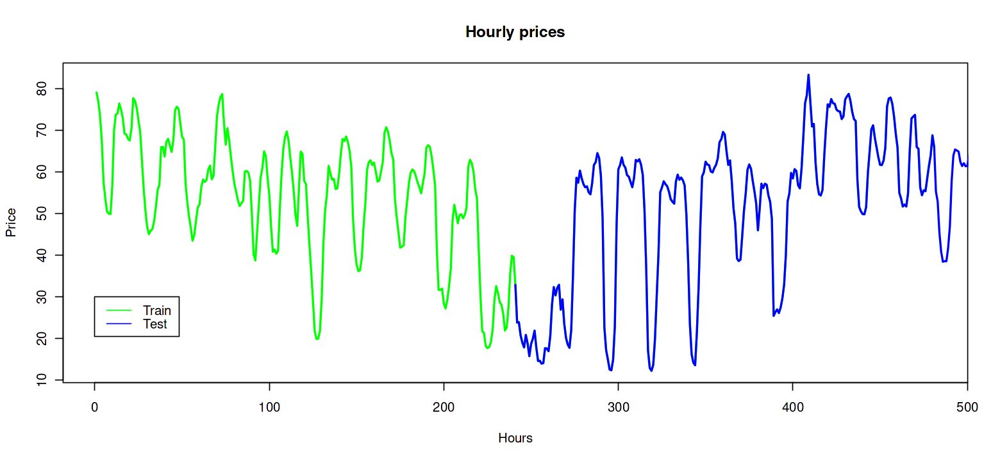

In [135]:
# Target
price_h<-df$price

# Train and test sets
price_h_train<-price_h[26018:26498] # train on hourly data about the last 10 days of 2017
price_h_test<-price_h[26498:26666]  # test on hourly data about the following week
df_h_subset <- subset(df, select=-c(price.actual, dates, weeks))
df_h_train <- df_h_subset[26018:26498,2:16]
df_h_test <- df_h_subset[26498:26666,2:16]

options(repr.plot.width=13, repr.plot.height=6)
par(mfrow=c(1,1))

price_h_test_plot<-price_h[26018:26666]
price_h_test_plot[1:240]=NA
plot(price_h_train, type='l', main='Hourly prices', xlab='Hours', ylab='Price', lwd=2, col='green')
lines(price_h_test_plot, type='l', col='blue', lwd=2)
legend(0,30,legend=c('Train','Test'), col=c('green','blue'), lty=1)


	Ljung-Box test

data:  Residuals
Q* = 12.145, df = 10, p-value = 0.2754

Model df: 0.   Total lags used: 10



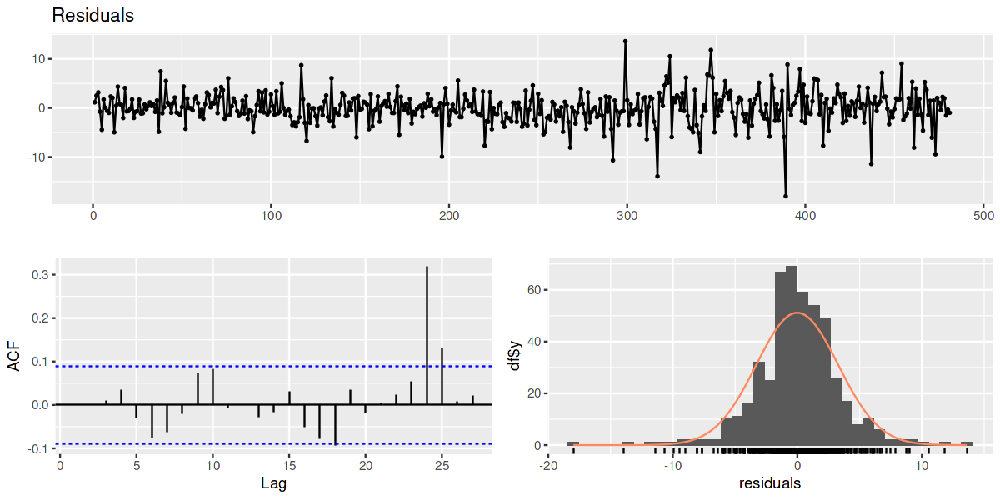

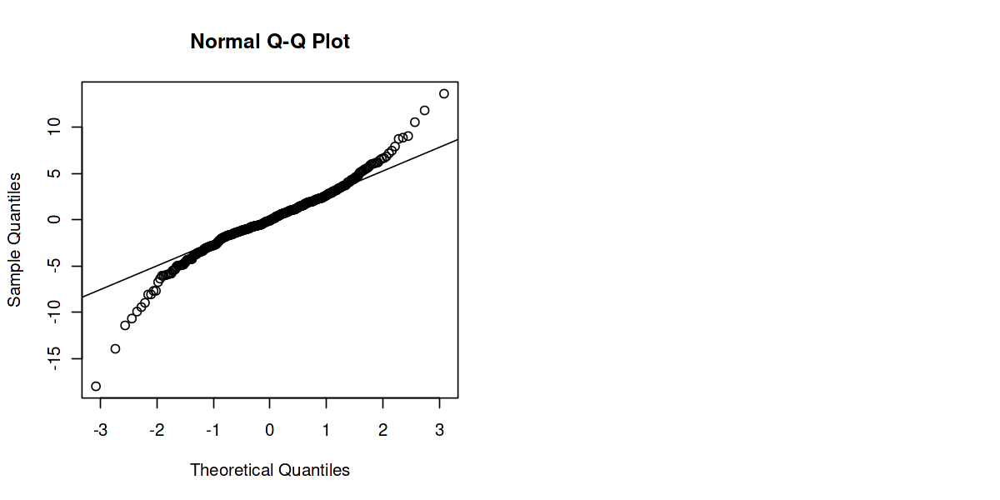

In [136]:
# Auto-ARIMA automatically finds the best ARIMA model
arima_h <- auto.arima(price_h_train ,xreg=as.matrix(df_h_train))  # ARIMA(2,0,0)

# Analysis of the residuals
options(repr.plot.width=10, repr.plot.height=5)
par(mfrow=c(1,2))

resid.arima_h <- residuals(arima_h)
checkresiduals(resid.arima_h)
qqnorm(resid.arima_h)
qqline(resid.arima_h)

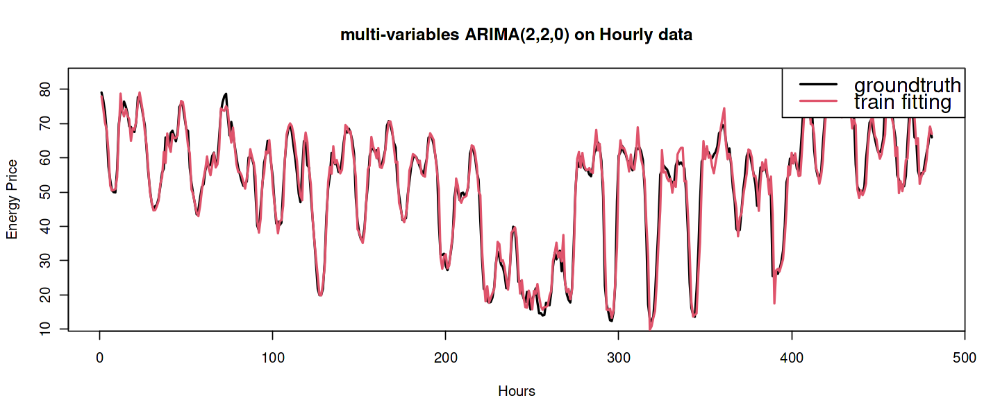

In [140]:
# Fitting
options(repr.plot.width=12, repr.plot.height=5)
par(mfrow=c(1,1))

plot(price_h_train, type='l', lwd=2, xlab="Hours", ylab="Energy Price", main="multi-variables ARIMA(2,2,0) on Hourly data")
lines(fitted(arima_h), col=2, lwd=2,lty=1)
legend(x='topright',cex=1.5, legend = c('groundtruth', 'train fitting'), 
       col = c(1,2), lwd = 2,lty=1)

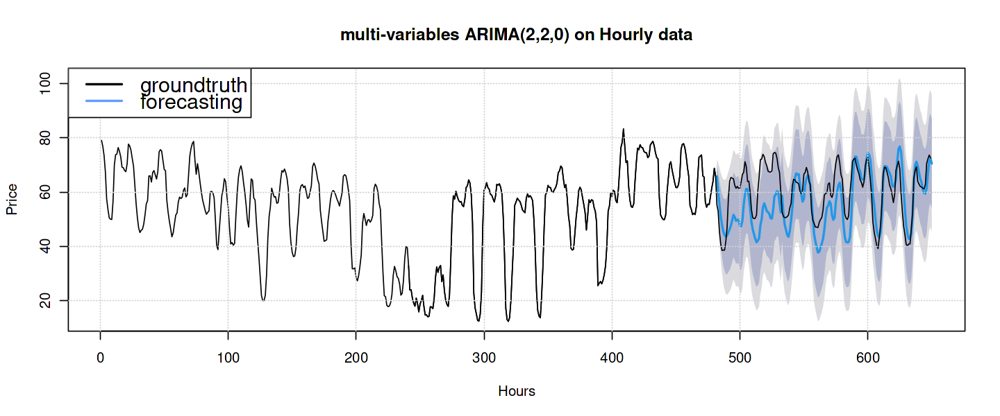

In [138]:
# Forecasting
options(repr.plot.width=12, repr.plot.height=5)
par(mfrow=c(1,1))

for.arima_h<- forecast(arima_h, xreg=as.matrix(df_h_test))
plot(for.arima_h, xlab='Hours', ylab='Price', main='multi-variables ARIMA(2,2,0) on Hourly data')
lines(price_h_test_plot, col=1)
grid()
legend(x='topleft',cex=1.5, legend = c('groundtruth', 'forecasting'), 
       col = c('black','#619CFF'), lwd = 2,lty=1)

#### Differentiated energy price

In [143]:
# Target
price_diff_h_train<-numeric(0)
for(i in 1:length(price_h_train)-1){
    price_diff_h_train<-c(price_diff_h_train,(price_h_train[i]-price_h_train[i+1]))
}

price_diff_h_test<-numeric(0)
for(i in 1:length(price_h_train)-1){
    price_diff_h_test<-c(price_diff_h_test,(price_h_train[i]-price_h_train[i+1]))
}

price_diff_h<-numeric(0)
for(i in 1:length(price_h)-1){
    price_diff_h<-c(price_diff_h,(price_h[i]-price_h[i+1]))
}


	Ljung-Box test

data:  Residuals
Q* = 29.704, df = 10, p-value = 0.0009575

Model df: 0.   Total lags used: 10



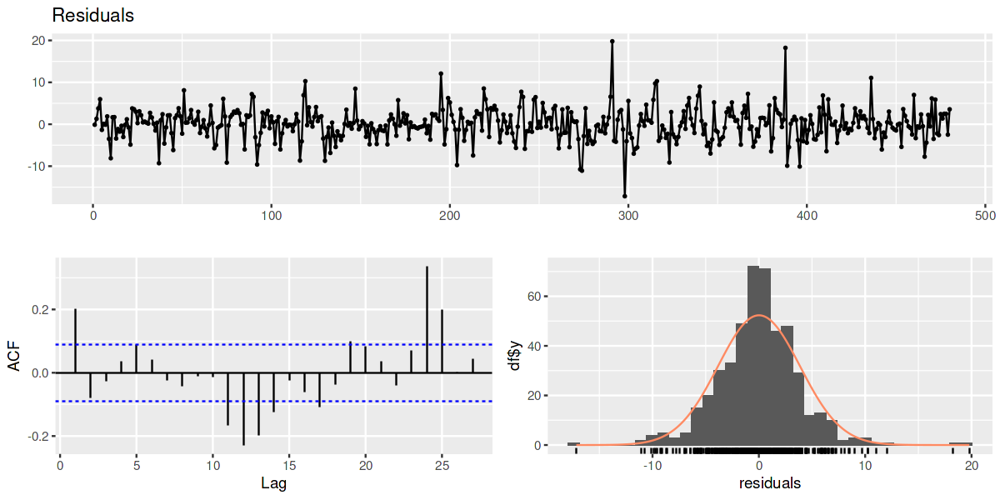

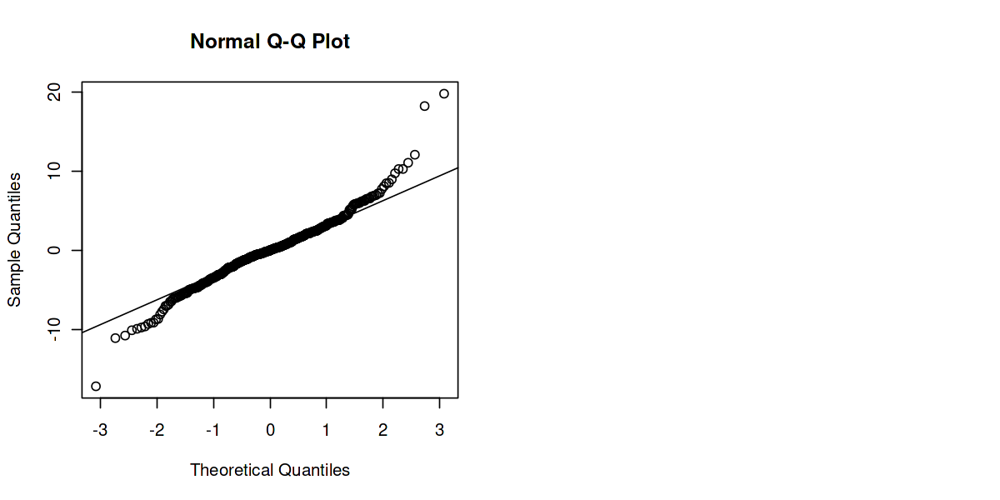

In [152]:
# Auto-ARIMA automatically finds the best ARIMA model
arima_diff_h <- auto.arima(price_diff_h_train ,xreg=as.matrix(head(df_h_train,-1)))  # ARIMA(2,0,2)

# Analysis of the residuals
options(repr.plot.width=10, repr.plot.height=5)
par(mfrow=c(1,2))

resid.arima_diff_h <- residuals(arima_diff_h)
checkresiduals(resid.arima_diff_h)
qqnorm(resid.arima_diff_h)
qqline(resid.arima_diff_h)

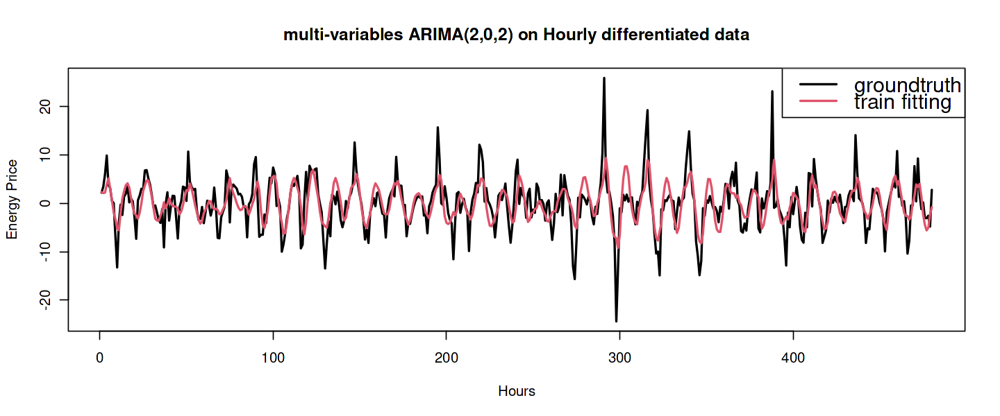

In [153]:
# Fitting
options(repr.plot.width=12, repr.plot.height=5)
par(mfrow=c(1,1))

plot(price_diff_h_train, type='l', lwd=2, xlab="Hours", ylab="Energy Price", main="multi-variables ARIMA(2,0,2) on Hourly differentiated data")
lines(fitted(arima_diff_h), col=2, lwd=2,lty=1)
legend(x='topright',cex=1.5, legend = c('groundtruth', 'train fitting'), 
       col = c(1,2), lwd = 2,lty=1)

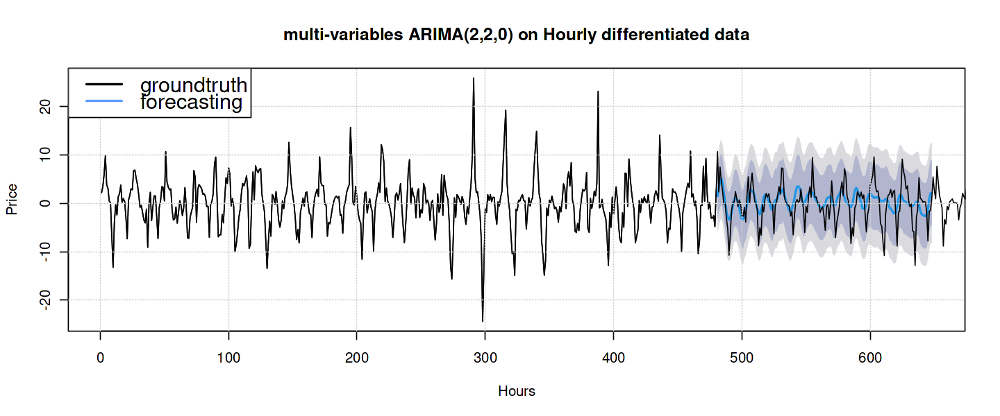

In [156]:
# Forecasting
options(repr.plot.width=12, repr.plot.height=5)
par(mfrow=c(1,1))

for.arima_diff_h<- forecast(arima_diff_h, xreg=as.matrix(head(df_h_test,-1)))
plot(for.arima_diff_h, xlab='Hours', ylab='Price', main='multi-variables ARIMA(2,2,0) on Hourly differentiated data')
lines(price_diff_h[26018:26700], col=1)
grid()
legend(x='topleft',cex=1.5, legend = c('groundtruth', 'forecasting'), 
       col = c('black','#619CFF'), lwd = 2,lty=1)